# Deep Learning for Predictive Maintenance

This is the skeleton code file for the EEC4400 assignment. Replace the XX in the name of this notebook with your group number (this is important for correct marks to be awarded to your group). Fill in the blank cells below with the necessary code (you should work on this notebook section by section). At the end, the entire notebook should generate all the required results and execute without error.

The text above the blank cells provide some information on the functionality that needs to be implemented. You need to write Python code at places indicated by "[WriteCode]".

In this notebook, we explore the following:

1. CNN 1D and LSTM models
2. Two types of prediction tasks
  
  a. Binary Classification :  determining if a machine will fail in a given "w1" window period (Yes/No)

  b. Regression : predicting the remaining time a machine can run before failing (RUL)


In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from tensorflow import keras # make sure you use TensorFlow Keras
import seaborn as sns
import warnings
import os
import time
%matplotlib inline

from sklearn import preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Dense, Dropout, Flatten, BatchNormalization, LayerNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping
# from kerastuner.tuners import RandomSearch
import tensorflow as tf
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from tensorflow.keras.regularizers import l1
# Extra imports must be done by students
# [WriteCode] from ... import ...
# [WriteCode] from ... import ...
# [WriteCode] from ... import ...

# Setting seed for reproducibility (uncomment and use if needed)
# np.random.seed(xx)  
# PYTHONHASHSEED = x

## Setting up TensorBoard

In [2]:
def get_run_logdir(k):
  root_logdir = os.path.join(os.curdir, "eec4400_logs", k)
  run_id = time.strftime("run_%Y_%m_%d-%H_%M_%S")
  return os.path.join(root_logdir, run_id)

## Initialize model parameters

Use the form below to enter parameter values before re-running the notebook. 

Use the same no. of epochs (ep) and batch size (ba) values for all the baseline CNN-Bin, LSTM-Bin, CNN-RUL and LSTM-RUL models.

Create additional variables and fields in this form as you require.

In [3]:
# Input Parameters
sequence_length = 25 # length of each sequence of values
ep =  5 # epochs
ba =  100 # batch_size                 

In [4]:
# DO NOT CHANGE the settings in this cell
w1 = 30 # window size before failure classification

## Data Ingestion
In the following section, 
- We ingest the training, test and ground truth datasets
- We provide column headings for consistency

(*Note*: training, test and ground truth dataframes are named "train_df", "test_df", and "truth_df" correspondingly. This naming is used consistently throughout the skeleton file.)

In [6]:
# Data ingestion

# read training data 
train_df = pd.read_csv('PM-2024/PM_train-2024.txt', sep=" ", header=None)
train_df.drop(train_df.columns[[26, 27]], axis=1, inplace=True)
train_df.columns = ['id', 'cycle', 'setting1', 'setting2', 'setting3', 's1', 's2', 's3',
                     's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14',
                     's15', 's16', 's17', 's18', 's19', 's20', 's21']

# read test data
test_df = pd.read_csv('PM-2024/PM_test-2024.txt', sep=" ", header=None)
test_df.drop(test_df.columns[[26, 27]], axis=1, inplace=True)
test_df.columns = ['id', 'cycle', 'setting1', 'setting2', 'setting3', 's1', 's2', 's3',
                     's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14',
                     's15', 's16', 's17', 's18', 's19', 's20', 's21']

# read ground truth data
truth_df = pd.read_csv('PM-2024/PM_truth-2024.txt', sep=" ", header=None)
truth_df.drop(truth_df.columns[[1]], axis=1, inplace=True)

# final Training data
train_df = train_df.sort_values(['id','cycle'])
train_df.head()

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s12,s13,s14,s15,s16,s17,s18,s19,s20,s21
0,1,1,-0.0005,0.0004,100.0,518.67,642.36,1583.23,1396.84,14.62,...,522.31,2388.01,8145.32,8.4246,0.03,391,2388,100.0,39.11,23.3537
1,1,2,0.0008,-0.0003,100.0,518.67,642.50,1584.69,1396.89,14.62,...,522.42,2388.03,8152.85,8.4403,0.03,392,2388,100.0,38.99,23.4491
2,1,3,-0.0014,-0.0002,100.0,518.67,642.18,1582.35,1405.61,14.62,...,522.03,2388.00,8150.17,8.3901,0.03,391,2388,100.0,38.85,23.3669
3,1,4,-0.0020,0.0001,100.0,518.67,642.92,1585.61,1392.27,14.62,...,522.49,2388.08,8146.56,8.3878,0.03,392,2388,100.0,38.96,23.2951
4,1,5,0.0016,0.0000,100.0,518.67,641.68,1588.63,1397.65,14.62,...,522.58,2388.03,8147.80,8.3869,0.03,392,2388,100.0,39.14,23.4583


## Data Exploration

Understanding the underlying characteristics of the dataset:
- Plot cross-correlation heatmap to understand correlation between sensor readings in training data (use seaborn package)
- Observe the data characteristics of three machines with shortest, average and longest operating lifetime (code provided)

(*Note*: use the results to answer the Data Exploration question Section 7 of the assignment document)

### Cross-correlation Heatmap

Expected result:

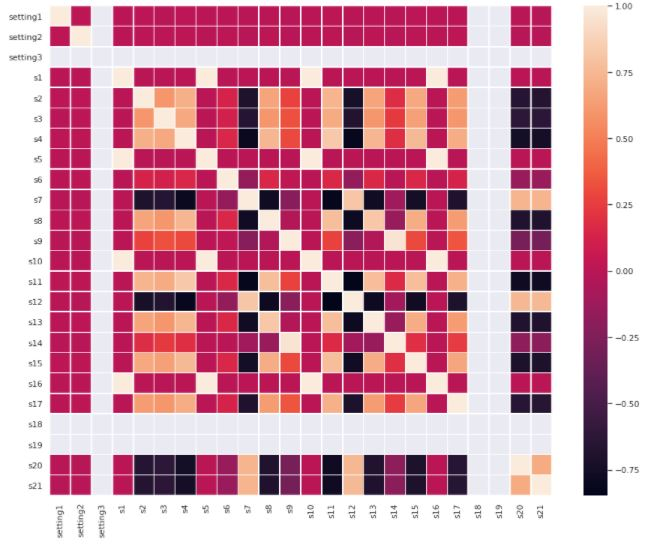

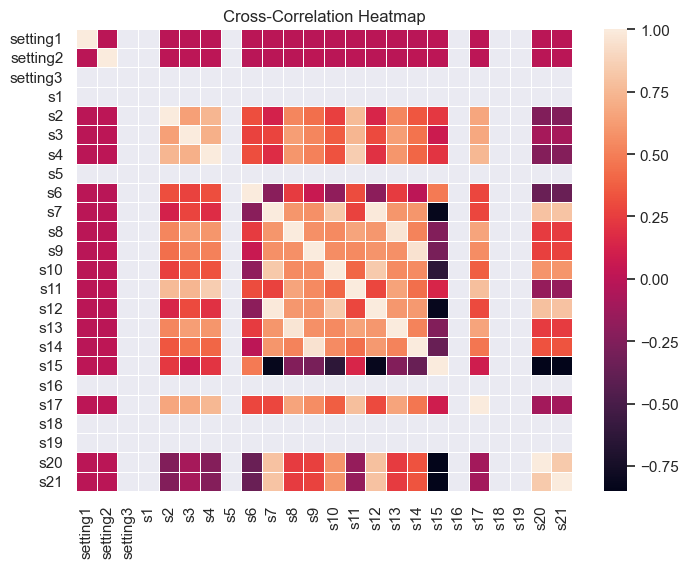

In [7]:
# Cross-correlation HeatMap

sns.set() 
def labels(x, y, *axes):
    for axis in axes:
        if x: axis.set_xlabel(x)
        if y: axis.set_ylabel(y)

df_sub = train_df.copy()
del df_sub['id']

df_sub.set_index('cycle', inplace=True)

# [WriteCode] to determine Pearson correlation and save in dataframe df_corr
# [WriteCode] for plotting cross-correlation heatmap using seaborn
# df_sub.head()

df_corr = df_sub.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(df_corr, linewidths=0.1, linecolor='white')
plt.title("Cross-Correlation Heatmap")
plt.show()

### Shortest, Average and Longest machine lifetimes

In [8]:
# Some Plotting Functions

mapp = {}
for id_num in train_df['id'].unique():
    mapp[id_num] = train_df['cycle'].loc[train_df['id'] == id_num].max()
mapp_len = sorted(mapp.items(), key=lambda kv: kv[1])
wind_size = w1

def exclude_trivial(df_sub):
    cols = []
    for col in df_sub.columns:
        if col == 'id':
            continue
        elif col == 'RUL':
            continue
        elif len(df_sub[col].unique()) <= 2:
            continue
        else:
            cols.append(col)
    return df_sub[cols].copy()

def get_data_non_trivial(df, unit_num, ):
    df_sub = df.loc[df['id'] == unit_num].copy()
    df_sub.set_index('cycle', inplace=True)
    df_sub.dropna(axis=1, how='all', inplace=True)
    df_sub = exclude_trivial(df_sub)
    return df_sub

def get_data_by_cols_and_unit(df, unit_num, cols):
    df_sub = df.loc[df['id'] == unit_num].copy()
    df_sub.set_index('cycle', inplace=True)
    df_sub.dropna(axis=1, how='all', inplace=True)
    df_sub = df_sub[cols]
    return df_sub

def plot_ts(df, unit_num, wind_size):
    '''plot all non trivial measurements and states'''
    df_sub = get_data_non_trivial(df, unit_num)
    cols = df_sub.columns
    fig, axes = plt.subplots(len(cols), 1, figsize=(15,12))
    for col, ax in zip(cols, axes):
        df_sub[col].plot(ax = ax)
        df_sub[col].rolling(wind_size).median().plot(ax = ax)
        df_sub[col].rolling(wind_size).mean().plot(style = '--', legend=True, ax = ax)
    fig.suptitle('unit NUM: {}'.format(unit_num))

def plot_hist(df, unit_num, wind_size):
    '''plot all non trivial measurements and states'''
    df_sub = get_data_non_trivial(df, unit_num)
    cols = df_sub.columns
    n_cols = min(len(cols), 5)
    n_rows = int(np.ceil(len(cols) / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15,12))
    axes = axes.flatten()
    for col, ax in zip(cols, axes):
        sns.distplot(df_sub[[col]], ax=ax, label=col)
        labels(col, "p", ax)
    fig.suptitle('unit NUM: {}'.format(unit_num))
    
def plot_learn(loss, val_loss):
    plt.plot(np.arange(len(loss)) + 0.5, loss, "b.-", label="Training loss")
    plt.plot(np.arange(len(val_loss)) + 1, val_loss, "r.-", label="Validation loss")
    plt.gca().xaxis.set_major_locator(mpl.ticker.MaxNLocator(integer=True))
    plt.ylim((0, 0.1))
    plt.xlim((1, ep))
    plt.legend(fontsize=14)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.grid(True)

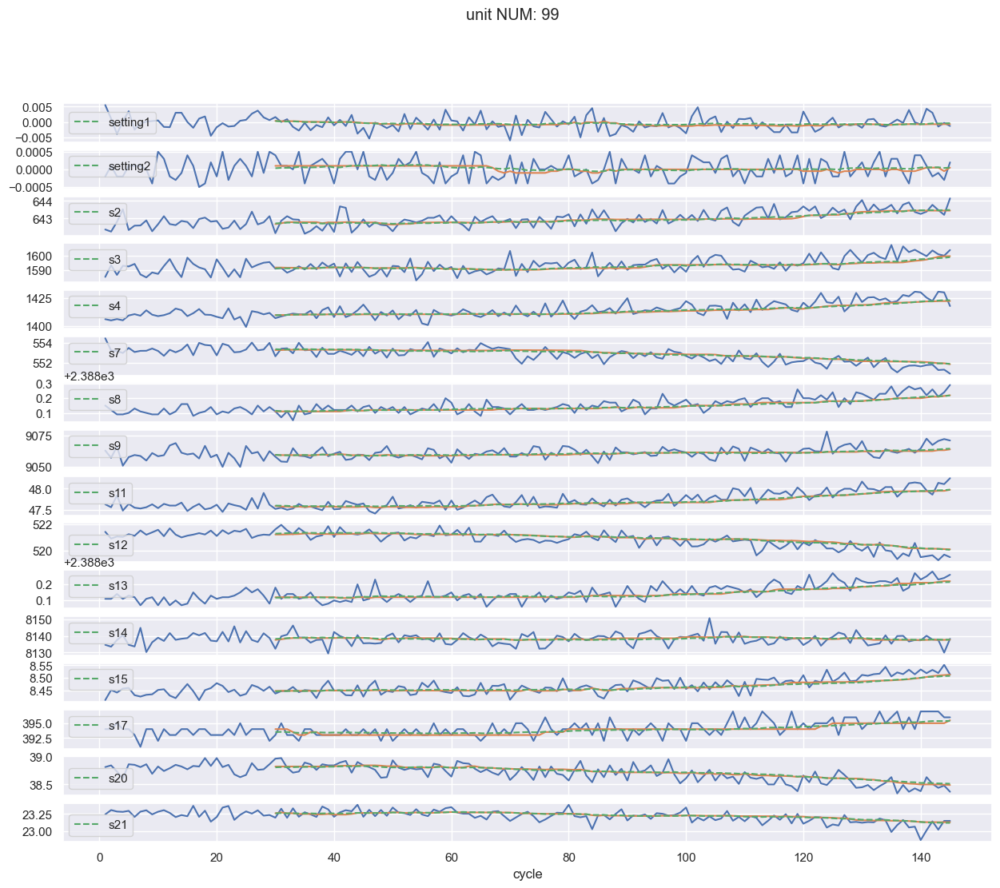

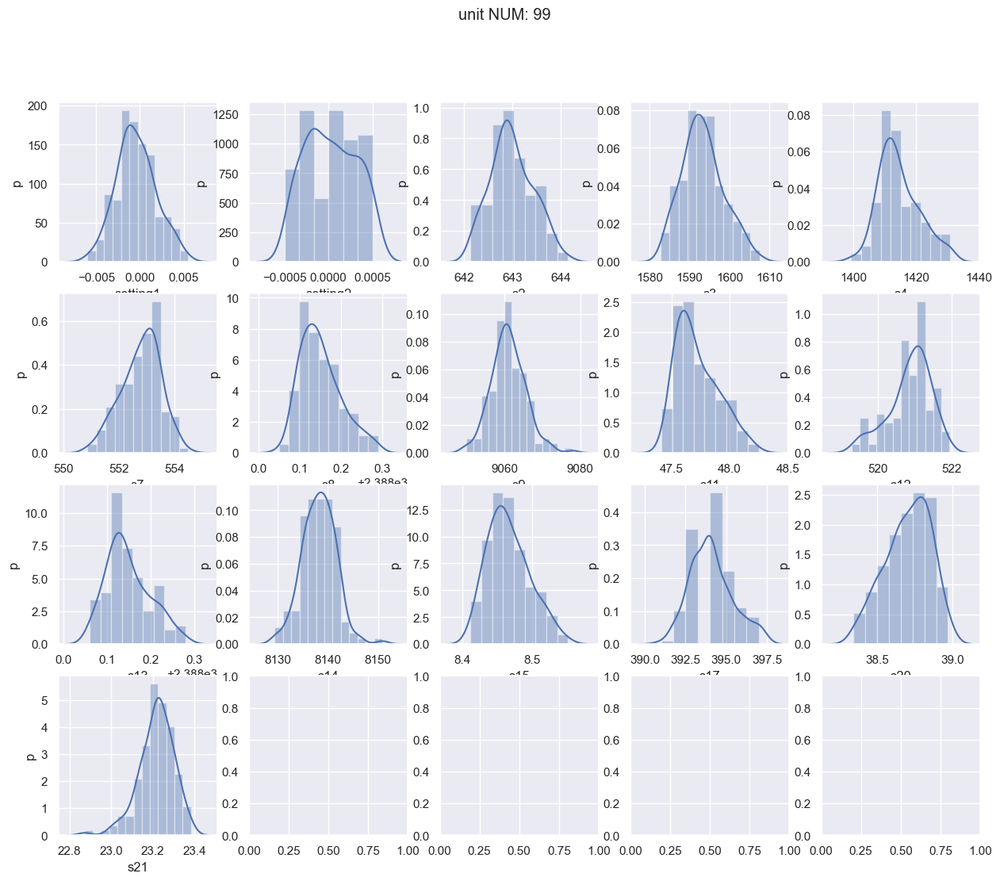

In [9]:
# Plotting sensor readings and distribution of sensor readings for machines with shortest, medium and longest operating times
warnings.filterwarnings('ignore')

# plot shortest operating time machine data
unit_to_plt = mapp_len[0][0]
plot_ts(train_df, unit_to_plt, wind_size)
plot_hist(train_df, unit_to_plt, wind_size)

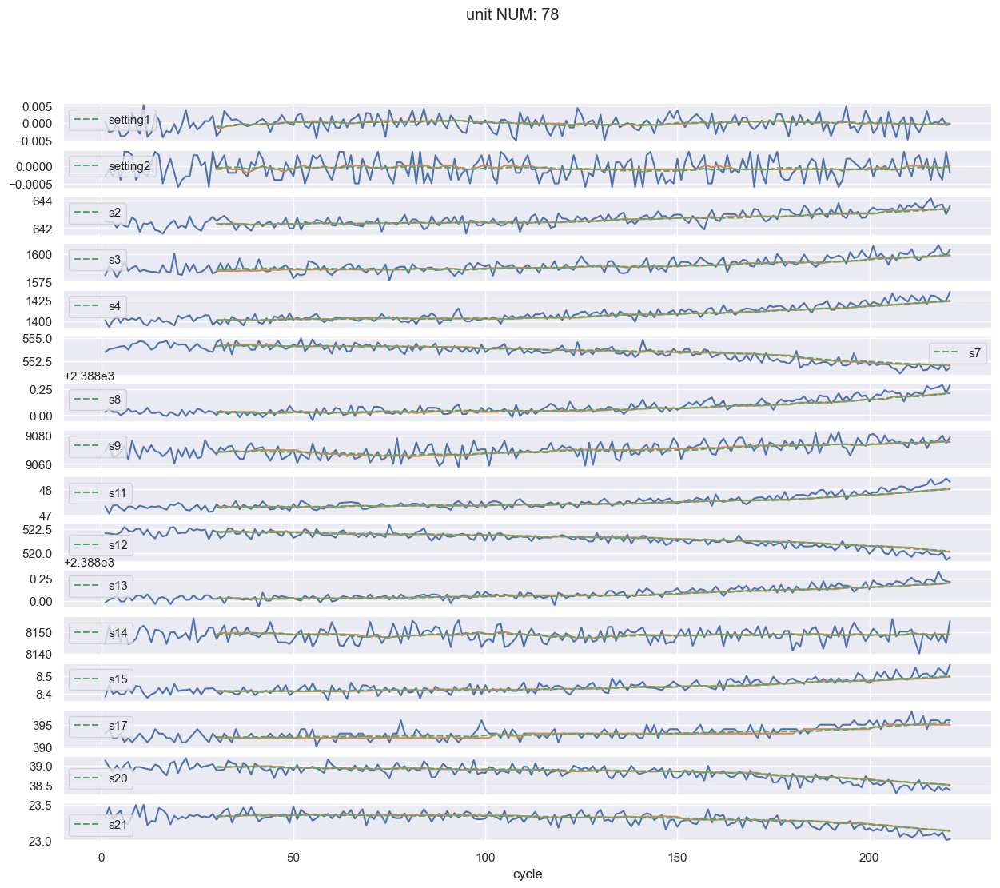

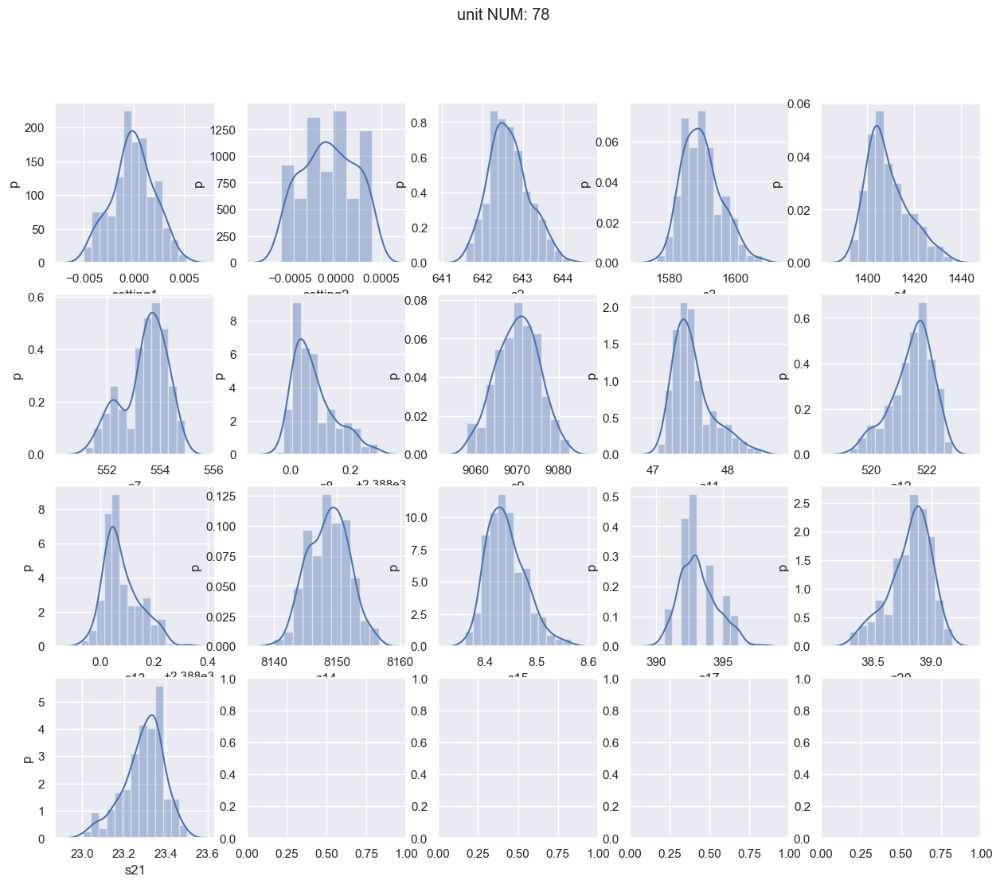

In [10]:
# plot medium operating time machine data
unit_to_plt = mapp_len[int(len(mapp)/2)][0]
plot_ts(train_df, unit_to_plt, wind_size)
plot_hist(train_df, unit_to_plt, wind_size)

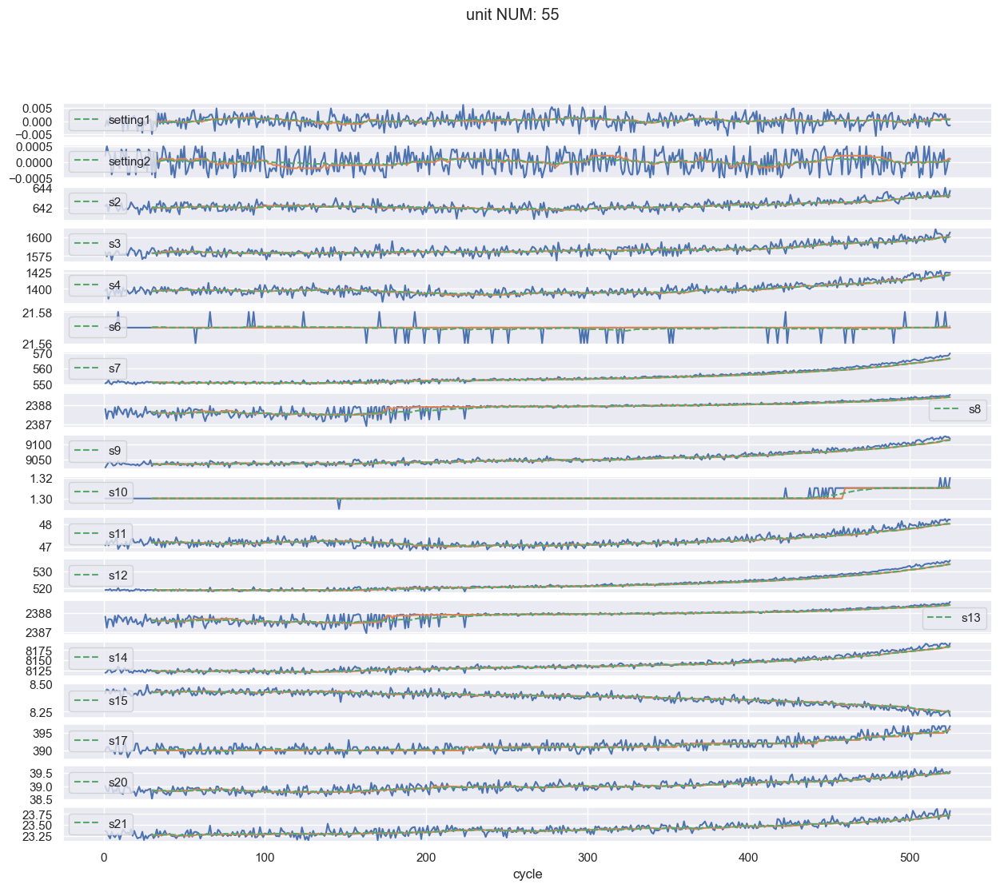

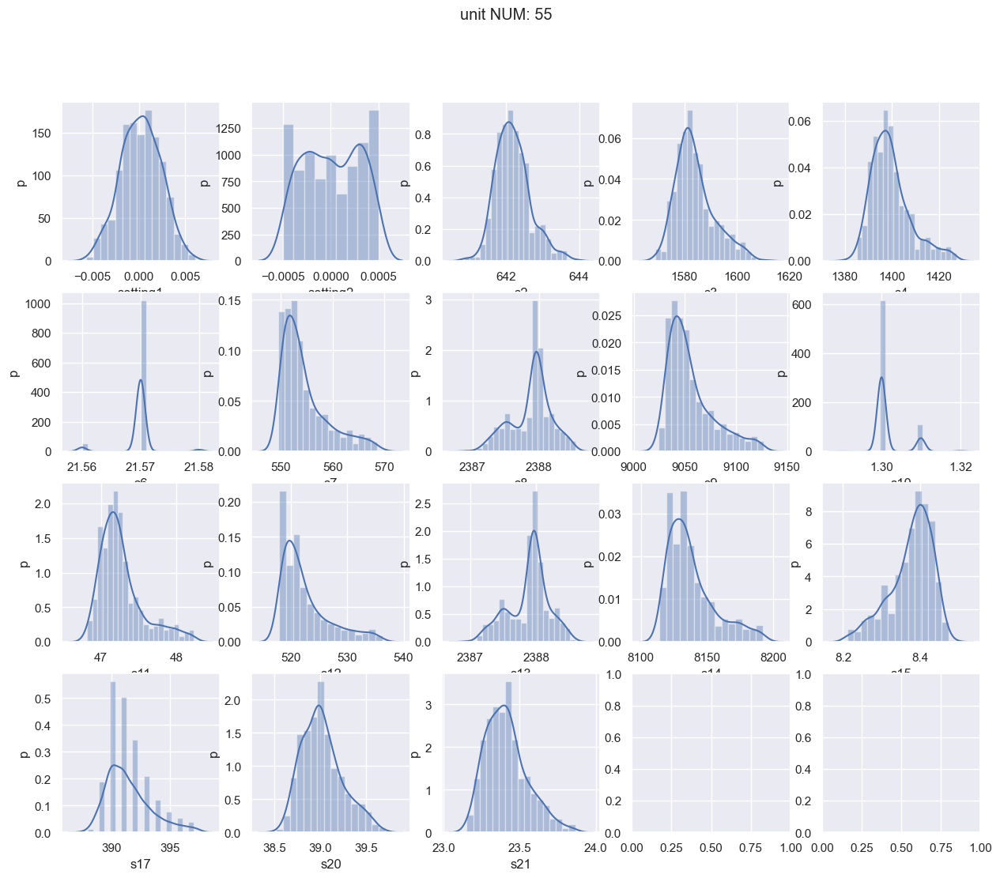

In [11]:
# plot longest operating time machine data
unit_to_plt = mapp_len[-1][0]
plot_ts(train_df, unit_to_plt, wind_size)
plot_hist(train_df, unit_to_plt, wind_size)

warnings.filterwarnings('default')

## Data Preprocessing


### Data Labeling

Generating labels for the training data for both prediction tasks:
- Remaining Useful Life ("RUL") for regression task
- "label1" for binary classification (to answer the question: is a specific engine going to fail within "w1" cycles?)

Columns "RUL" and "label1" are created

(*Note*: Column names are case-sensitive and this section is already coded.)

In [12]:
# Data Labeling for training data - generate column RUL

rul = pd.DataFrame(train_df.groupby('id')['cycle'].max()).reset_index()
rul.columns = ['id', 'max']
train_df = train_df.merge(rul, on=['id'], how='left')
train_df['RUL'] = train_df['max'] - train_df['cycle']
train_df.drop('max', axis=1, inplace=True)

# generate label1 column for training data
train_df['label1'] = np.where(train_df['RUL'] <= w1, 1, 0 )
train_df.head(10)


,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s14,s15,s16,s17,s18,s19,s20,s21,RUL,label1
0,1,1,-0.0005,0.0004,100.0,518.67,642.36,1583.23,1396.84,14.62,...,8145.32,8.4246,0.03,391,2388,100.0,39.11,23.3537,258,0
1,1,2,0.0008,-0.0003,100.0,518.67,642.50,1584.69,1396.89,14.62,...,8152.85,8.4403,0.03,392,2388,100.0,38.99,23.4491,257,0
2,1,3,-0.0014,-0.0002,100.0,518.67,642.18,1582.35,1405.61,14.62,...,8150.17,8.3901,0.03,391,2388,100.0,38.85,23.3669,256,0
3,1,4,-0.0020,0.0001,100.0,518.67,642.92,1585.61,1392.27,14.62,...,8146.56,8.3878,0.03,392,2388,100.0,38.96,23.2951,255,0
4,1,5,0.0016,0.0000,100.0,518.67,641.68,1588.63,1397.65,14.62,...,8147.80,8.3869,0.03,392,2388,100.0,39.14,23.4583,254,0
5,1,6,0.0011,-0.0005,100.0,518.67,642.24,1584.09,1400.01,14.62,...,8144.92,8.4152,0.03,393,2388,100.0,38.92,23.4281,253,0
6,1,7,-0.0038,0.0002,100.0,518.67,642.58,1585.61,1401.09,14.62,...,8147.05,8.3842,0.03,391,2388,100.0,38.84,23.4087,252,0
7,1,8,-0.0007,-0.0005,100.0,518.67,642.32,1588.32,1397.08,14.62,...,8157.34,8.4190,0.03,391,2388,100.0,39.05,23.4590,251,0
8,1,9,-0.0026,0.0000,100.0,518.67,641.64,1587.81,1406.51,14.62,...,8147.20,8.4091,0.03,392,2388,100.0,38.99,23.4693,250,0
9,1,10,0.0019,-0.0002,100.0,518.67,642.42,1587.39,1402.25,14.62,...,8152.86,8.3987,0.03,391,2388,100.0,38.94,23.4781,249,0


In [13]:
# Data Labeling for test data - generate column RUL

rul = pd.DataFrame(test_df.groupby('id')['cycle'].max()).reset_index()
rul.columns = ['id', 'max']
truth_df.columns = ['more']
truth_df['id'] = truth_df.index + 1
truth_df['max'] = rul['max'] + truth_df['more']
truth_df.drop('more', axis=1, inplace=True)

test_df = test_df.merge(truth_df, on=['id'], how='left')
test_df['RUL'] = test_df['max'] - test_df['cycle']
test_df.drop('max', axis=1, inplace=True)

# generate label1 column for test data
test_df['label1'] = np.where(test_df['RUL'] <= w1, 1, 0 )
test_df.head()

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s14,s15,s16,s17,s18,s19,s20,s21,RUL,label1
0,1,1,-0.0017,-0.0004,100.0,518.67,641.94,1581.93,1396.93,14.62,...,8133.48,8.3760,0.03,391,2388,100.0,39.07,23.4468,276,0
1,1,2,0.0006,-0.0002,100.0,518.67,642.02,1584.86,1398.90,14.62,...,8137.44,8.4062,0.03,391,2388,100.0,39.04,23.4807,275,0
2,1,3,0.0014,-0.0003,100.0,518.67,641.68,1581.78,1391.92,14.62,...,8138.25,8.3553,0.03,391,2388,100.0,39.10,23.4244,274,0
3,1,4,0.0027,0.0001,100.0,518.67,642.20,1584.53,1395.34,14.62,...,8137.07,8.3709,0.03,392,2388,100.0,38.97,23.4782,273,0
4,1,5,-0.0001,0.0001,100.0,518.67,642.46,1589.03,1395.86,14.62,...,8134.20,8.4146,0.03,391,2388,100.0,39.09,23.3950,272,0


### Data Normalization

Perform minmax normalization using MinMax scaler in sklearn on both training and test data (train_df and test_df)


In [14]:
# MinMax normalization for training data

train_df['cycle_norm'] = train_df['cycle']
columns_to_normalize = train_df.columns.difference(['id', 'cycle', 'RUL', 'label1'])
# [WriteCode]
scaler = preprocessing.MinMaxScaler()
# train_df['cycle_norm'] = scaler.fit_transform(train_df)
train_df[columns_to_normalize] = scaler.fit_transform(train_df[columns_to_normalize])
train_df.head()

,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s15,s16,s17,s18,s19,s20,s21,RUL,label1,cycle_norm
0,1,1,0.470930,0.769231,0.0,0.0,0.355972,0.370523,0.308580,0.0,...,0.647755,0.0,0.272727,0.0,0.0,0.559524,0.446331,258,0,0.000000
1,1,2,0.546512,0.230769,0.0,0.0,0.388759,0.399100,0.309360,0.0,...,0.685659,0.0,0.363636,0.0,0.0,0.488095,0.534836,257,0,0.001908
2,1,3,0.418605,0.307692,0.0,0.0,0.313817,0.353298,0.445398,0.0,...,0.564462,0.0,0.272727,0.0,0.0,0.404762,0.458577,256,0,0.003817
3,1,4,0.383721,0.538462,0.0,0.0,0.487119,0.417107,0.237285,0.0,...,0.558909,0.0,0.363636,0.0,0.0,0.470238,0.391966,255,0,0.005725
4,1,5,0.593023,0.461538,0.0,0.0,0.196721,0.476218,0.321217,0.0,...,0.556736,0.0,0.363636,0.0,0.0,0.577381,0.543371,254,0,0.007634


In [15]:
# MinMax normalization for test data

test_df['cycle_norm'] = test_df['cycle']

# [WriteCode]
# scaler = preprocessing.MinMaxScaler()
# test_df['cycle_norm'] = scaler.transform(test_df)
test_df[columns_to_normalize] = scaler.transform(test_df[columns_to_normalize])
test_df.head()


,id,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,...,s15,s16,s17,s18,s19,s20,s21,RUL,label1,cycle_norm
0,1,1,0.401163,0.153846,0.0,0.0,0.257611,0.345077,0.309984,0.0,...,0.530420,0.0,0.272727,0.0,0.0,0.535714,0.532702,276,0,0.000000
1,1,2,0.534884,0.307692,0.0,0.0,0.276347,0.402427,0.340718,0.0,...,0.603332,0.0,0.272727,0.0,0.0,0.517857,0.564153,275,0,0.001908
2,1,3,0.581395,0.230769,0.0,0.0,0.196721,0.342141,0.231825,0.0,...,0.480444,0.0,0.272727,0.0,0.0,0.553571,0.511921,274,0,0.003817
3,1,4,0.656977,0.538462,0.0,0.0,0.318501,0.395968,0.285179,0.0,...,0.518107,0.0,0.363636,0.0,0.0,0.476190,0.561833,273,0,0.005725
4,1,5,0.494186,0.538462,0.0,0.0,0.379391,0.484048,0.293292,0.0,...,0.623612,0.0,0.272727,0.0,0.0,0.547619,0.484646,272,0,0.007634


### Data Plotting

In this section, students must plot training data. Please do the follwing:
- Use only data pertaining to engine id = 3
- Plot only the last "sequence_length" operating cycles for each sensor reading in engine 3 training data (for example: if seq_len = 50, plot the last 50 operating cycles of engine 3). 
- Use separate plot for each column or sensor reading. 

X axis: cycles and Y axis : sensor reading

expected result:
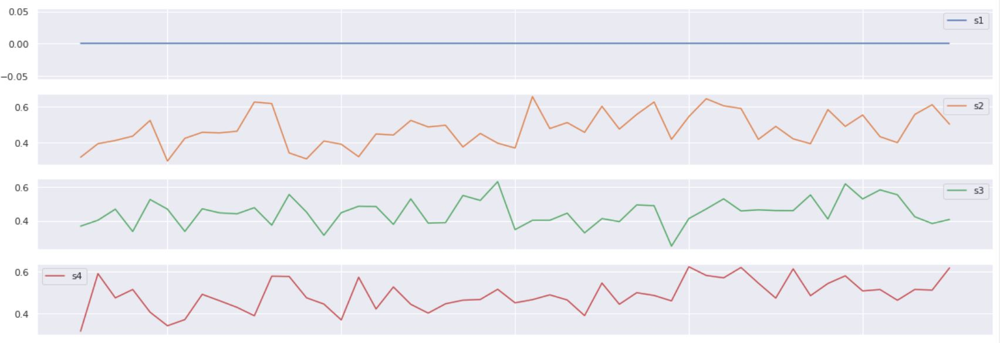

c:\Users\LDH\.conda\envs\EEC4400\lib\site-packages\pandas\plotting\_matplotlib\compat.py:13: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  op(LooseVersion(mpl.__version__), LooseVersion(version))
c:\Users\LDH\.conda\envs\EEC4400\lib\site-packages\pandas\plotting\_matplotlib\compat.py:13: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  op(LooseVersion(mpl.__version__), LooseVersion(version))
c:\Users\LDH\.conda\envs\EEC4400\lib\site-packages\pandas\plotting\_matplotlib\compat.py:13: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  op(LooseVersion(mpl.__version__), LooseVersion(version))
c:\Users\LDH\.conda\envs\EEC4400\lib\site-packages\pandas\plotting\_matplotlib\compat.py:13: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  op(LooseVersion(mpl.__version__), LooseVersion(version))
c:\Users\LDH\.conda\

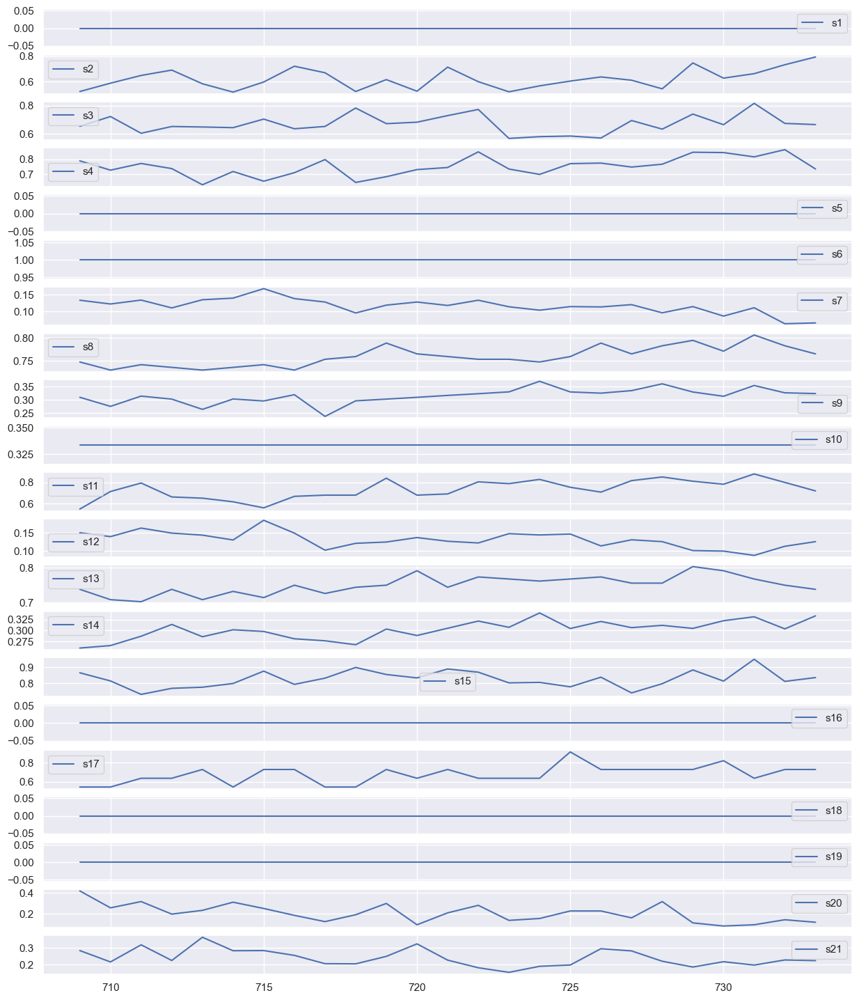

In [16]:
# [WriteCode]
draw_df = train_df[train_df['id'] == 3]
draw_df = draw_df[-sequence_length:]
cycle = draw_df['cycle']
draw_df = draw_df.drop(columns=['id', 'cycle', 'setting1', 'setting2', 'setting3', 'RUL', 'label1', 'cycle_norm'])
fig, axes = plt.subplots(21, 1, figsize=(15,18))
draw_df.head()
for col, ax in zip(draw_df.columns, axes):
    draw_df[col].plot(ax = ax, legend=True)
    # plt.legend()
    # df_sub[col].rolling(wind_size).median().plot(ax = ax)
    # df_sub[col].rolling(wind_size).mean().plot(style = '--', legend=True, ax = ax)




### Data Sequence Generation

Any deep learning model requires two data arrays for model training. The first array is the input sequence array X (named "**seq_array**" in this skeleton file) which contains the input features. The second array is the desired target array Y (named "**label_array**" in this skeleton file) which contains the actual output or ground truth. This target output "label_array" is different for binary classification and RUL regression.

In addition, Keras layers expect the input "seq_array" in the shape of a numpy array of 3 dimensions (no. of samples, time steps, features) where no. of samples is the number of training sequences, time steps is the look back window of sequence length and features is the number of features of each sequence at each time step. 

In this section, train_df is used to generate seq_array. Label_array generation is done separately for each prediction task.

In [17]:
# function to reshape features into seq_array: (samples, time steps, features) 
def gen_sequence(id_df, seq_length, seq_cols):
    """ Only sequences that meet the window-length are considered, no padding is used. This means
    we need to drop those which are below the window-length. """
    data_array = id_df[seq_cols].values
    num_elements = data_array.shape[0]
    for start, stop in zip(range(0, num_elements-seq_length), range(seq_length, num_elements)):
        yield data_array[start:stop, :]

# pick the feature columns 
sensor_cols = ['s' + str(i) for i in range(1,22)]
sequence_cols = ['setting1', 'setting2', 'setting3', 'cycle_norm']
sequence_cols.extend(sensor_cols)

# generator for the training sequences
seq_gen = (list(gen_sequence(train_df[train_df['id']==id], sequence_length, sequence_cols)) 
           for id in train_df['id'].unique())

# generate sequences and convert to numpy array
seq_array = np.concatenate(list(seq_gen)).astype(np.float32)

# final seq_array which is X input to CNN/LSTM
print(seq_array.shape)

(22220, 25, 25)


## Failure Classification

### Label array generation


In [18]:
# function to generate label_array
def gen_labels(id_df, seq_length, label):
    data_array = id_df[label].values
    num_elements = data_array.shape[0]
    return data_array[seq_length:num_elements, :]

# generate labels (generated from "label1" col as its binary classification)
label_gen = [gen_labels(train_df[train_df['id']==id], sequence_length, ['label1']) 
             for id in train_df['id'].unique()]
label_array = np.concatenate(label_gen).astype(np.float32)

# final label_array which is Y target output for CNN and LSTM 
print(label_array.shape)

(22220, 1)


### CNN Model
In this section, build a 1D CNN network to do binary classification. The choice of network architecture - no. of layers, type of layers (1D CNN, maxpooling etc.), nodes per layer, activations - is left to students. Please include the following:
- name the model as "model_cnn_bin"
- dropout layer after each CNN layer (drop probability of your choice)
- output dense layer with appropriate no. of nodes and activation for binary classification
- appropriate loss function and optimizer.

Set 'accuracy' as the metric.

Print the model summary.


In [19]:
# [WriteCode]
# Define the 1D CNN model


def model_cnn_bin_def(learning_rate=0.001, dropout_rate=0.5):
    # Define the 1D CNN model
    model_cnn_bin = Sequential()
    
    # Add Conv1D layers with Dropout
    model_cnn_bin.add(Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(sequence_length, len(sequence_cols))))
    model_cnn_bin.add(MaxPooling1D(pool_size=2))
    model_cnn_bin.add(Dropout(0.3))
    
    model_cnn_bin.add(Conv1D(filters=64, kernel_size=3, activation='relu'))
    model_cnn_bin.add(MaxPooling1D(pool_size=2))
    model_cnn_bin.add(Dropout(0.3))
    
    model_cnn_bin.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
    model_cnn_bin.add(MaxPooling1D(pool_size=2))
    model_cnn_bin.add(Dropout(0.3))
    
    # Flatten the output and add dense layers
    model_cnn_bin.add(Flatten())
    model_cnn_bin.add(Dense(64, activation='relu'))
    model_cnn_bin.add(Dropout(0.3))
    model_cnn_bin.add(Dense(32, activation='relu'))
    model_cnn_bin.add(Dropout(0.3))
    
    # Output layer for binary classification
    model_cnn_bin.add(Dense(1, activation='sigmoid'))
    
    # Compile the model
    model_cnn_bin.compile(loss='binary_crossentropy', optimizer=Adam(), metrics=['accuracy'])
    
    # Print the model summary
    model_cnn_bin.summary()
    return model_cnn_bin

model_cnn_bin = model_cnn_bin_def()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 11, 32)            0         
_________________________________________________________________
dropout (Dropout)            (None, 11, 32)            0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 4, 64)             0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 4, 64)             0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 2, 128)            2

#### Model Training

Fit the model using **seq_array** and **label_array** with epochs and batch_size set according to the parameter values in the form on top. Use validation_split = 0.05

##### Use callback: "**keras.callbacks.TensorBoard(log_dir=get_run_logdir("run_cnn_bin") , histogram_freq=1, write_graph= True, update_freq='epoch')**" to store the model training to Tensorboard log file "run_cnn_bin" for visualization.

In [20]:
%%time
cb = keras.callbacks.TensorBoard(log_dir= get_run_logdir("run_cnn_bin"), histogram_freq=1, write_graph= True, update_freq='epoch')

# [WriteCode]
# Set the callback for TensorBoard
cb = keras.callbacks.TensorBoard(log_dir=get_run_logdir("run_cnn_bin"),
                                  histogram_freq=1,
                                  write_graph=True,
                                  update_freq='epoch')

# Train the model
history = model_cnn_bin.fit(seq_array,
                             label_array,
                             epochs=ep,
                             batch_size=ba,
                             validation_split=0.05,
                             callbacks=[cb])

# Display the training history
print(history.history.keys())

Epoch 1/5
212/212 [==============================] - 3s 8ms/step - loss: 0.2198 - accuracy: 0.9116 - val_loss: 0.1003 - val_accuracy: 0.9640
Epoch 2/5
212/212 [==============================] - 1s 7ms/step - loss: 0.1216 - accuracy: 0.9520 - val_loss: 0.0638 - val_accuracy: 0.9820
Epoch 3/5
212/212 [==============================] - 1s 7ms/step - loss: 0.1105 - accuracy: 0.9572 - val_loss: 0.0678 - val_accuracy: 0.9739
Epoch 4/5
212/212 [==============================] - 2s 7ms/step - loss: 0.1006 - accuracy: 0.9604 - val_loss: 0.0795 - val_accuracy: 0.9757
Epoch 5/5
212/212 [==============================] - 2s 7ms/step - loss: 0.0950 - accuracy: 0.9609 - val_loss: 0.0708 - val_accuracy: 0.9883
dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])
CPU times: total: 9.81 s
Wall time: 9.19 s


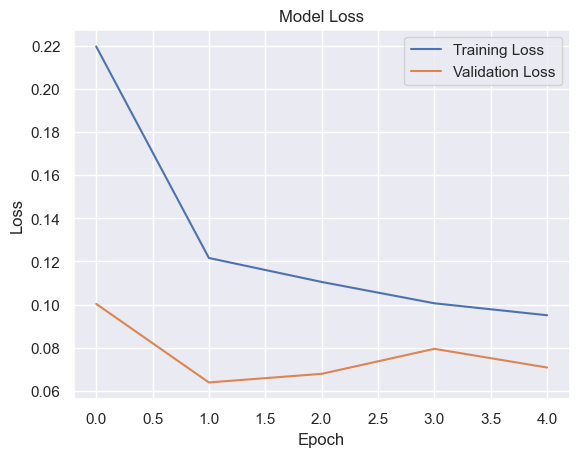

In [21]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

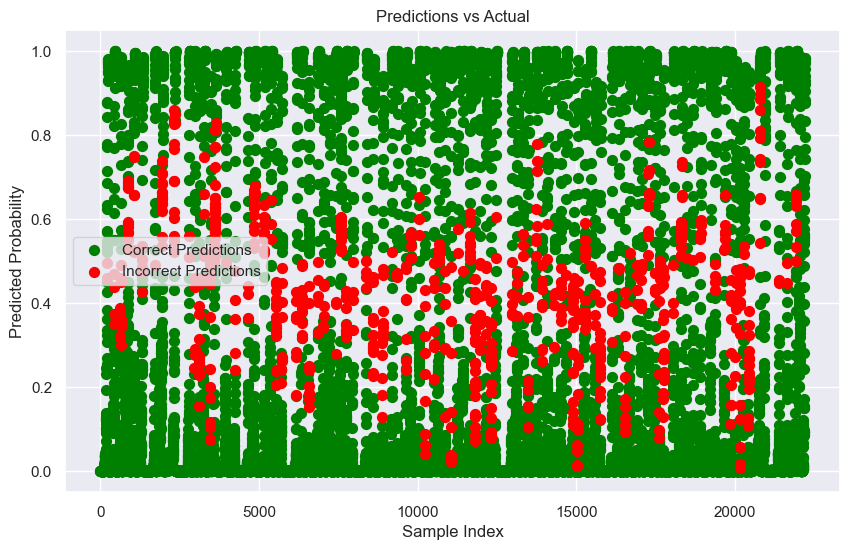

In [22]:
predictions = model_cnn_bin.predict(seq_array)

predicted_classes = (predictions > 0.5).astype(int)

correct_predictions = predicted_classes == label_array


plt.figure(figsize=(10, 6))
plt.scatter(np.where(correct_predictions)[0], predictions[correct_predictions], label='Correct Predictions', color='green', s=50)
plt.scatter(np.where(~correct_predictions)[0], predictions[~correct_predictions], label='Incorrect Predictions', color='red', s=50)

plt.title('Predictions vs Actual')
plt.xlabel('Sample Index')
plt.ylabel('Predicted Probability')
plt.legend()
plt.show()

#### Training data performance metrics

- Determine the accuracy of prediction of the trained model on the training data
- Print the confusion matrix for training data prediction
- Print the precision and recall for training data prediction

Training Accuracy: 0.9668
Confusion Matrix:
 [[18879   241]
 [  497  2603]]
Precision: 0.9153
Recall: 0.8397


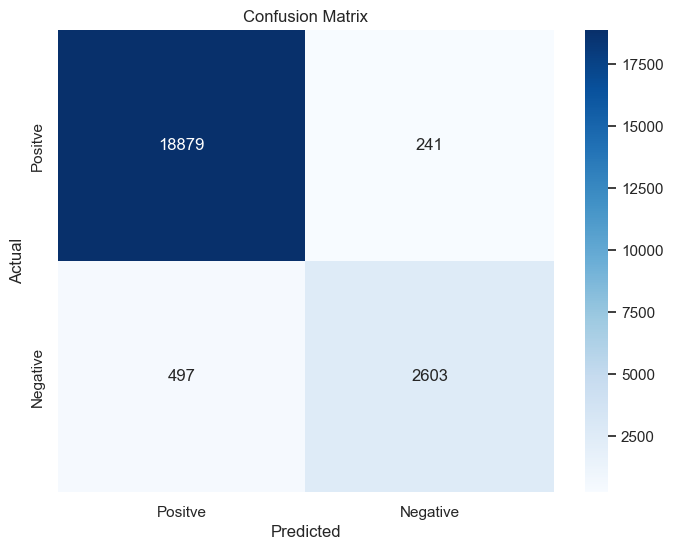

In [23]:
# [WriteCode]
# Make predictions on the training data
train_predictions = (model_cnn_bin.predict(seq_array) > 0.5).astype(int)

# Calculate accuracy
accuracy = (train_predictions == label_array).mean()
print(f"Training Accuracy: {accuracy:.4f}")

# Generate confusion matrix
cm = confusion_matrix(label_array, train_predictions)
print("Confusion Matrix:\n", cm)

# Calculate precision and recall
precision = precision_score(label_array, train_predictions)
recall = recall_score(label_array, train_predictions)
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")

# Optional: Plot confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Positve", "Negative"], yticklabels=["Positve", "Negative"])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

#### Test data for prediction

To evaluate the performance on the test data, only the last cycles of data for each engine id in the test data is kept for testing purposes. In order to compare the results to the target, we pick the last sequence for each engine id in the test data (excluding engine ids whose last cycle is shorter than "sequence length" size).

In [24]:
seq_array_test_last = [test_df[test_df['id']==id][sequence_cols].values[-sequence_length:] 
                       for id in test_df['id'].unique() if len(test_df[test_df['id']==id]) >= sequence_length]

seq_array_test_last = np.asarray(seq_array_test_last).astype(np.float32)

# Last cycle test data - seq_array for test data
print(seq_array_test_last.shape)

y_mask = [len(test_df[test_df['id']==id]) >= sequence_length for id in test_df['id'].unique()]
label_array_test_last = test_df.groupby('id')['label1'].nth(-1)[y_mask].values
label_array_test_last = label_array_test_last.reshape(label_array_test_last.shape[0],1).astype(np.float32)

# Last cycle test data - label_array for test data
print(label_array_test_last.shape)

(100, 25, 25)
(100, 1)


#### Test data performance metrics

- Determine the accuracy of prediction of the trained model on the test data
- Print the confusion matrix for test data prediction
- Print the precision, recall and F1 score for test data prediction

*Note*: use seq_array_test_last and label_array_test_last generated in the cell above as X and Y arrays (in place of seq_array and label_array) for performing prediction and calculating metrics

Test Accuracy: 0.9500
Confusion Matrix (Test Data):
 [[79  1]
 [ 4 16]]
Precision (Test Data): 0.9412
Recall (Test Data): 0.8000
F1 Score (Test Data): 0.8649


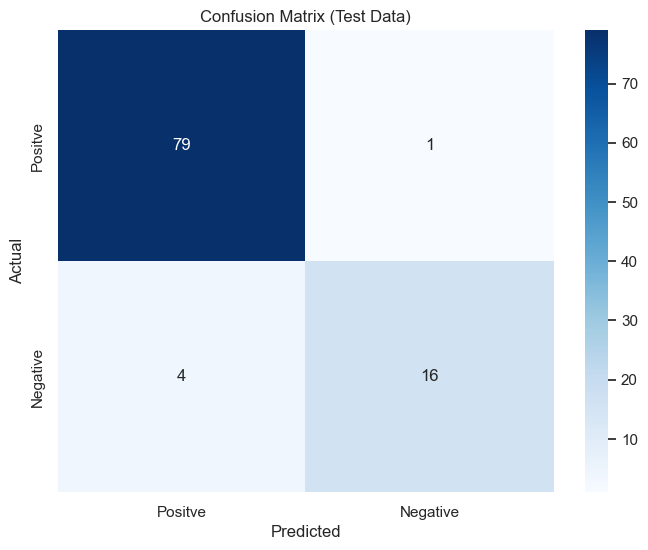

In [26]:
# [WriteCode]
# Make predictions on the test data
test_predictions = (model_cnn_bin.predict(seq_array_test_last) > 0.5).astype(int)

# Calculate accuracy
test_accuracy = (test_predictions == label_array_test_last).mean()
print(f"Test Accuracy: {test_accuracy:.4f}")

# Generate confusion matrix
cm_test = confusion_matrix(label_array_test_last, test_predictions)
print("Confusion Matrix (Test Data):\n", cm_test)

# Calculate precision, recall, and F1 score
test_precision = precision_score(label_array_test_last, test_predictions)
test_recall = recall_score(label_array_test_last, test_predictions)
test_f1 = f1_score(label_array_test_last, test_predictions)

print(f"Precision (Test Data): {test_precision:.4f}")
print(f"Recall (Test Data): {test_recall:.4f}")
print(f"F1 Score (Test Data): {test_f1:.4f}")

# Optional: Plot confusion matrix using seaborn for test data
plt.figure(figsize=(8, 6))
sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=["Positve", "Negative"], yticklabels=["Positve", "Negative"])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix (Test Data)')
plt.show()

#### Hyperparameter Optimisation

This involves finding the best network architecture (no. and types of layers, no. of nodes per layer, activations) and values for the learning rate, optimizer, dropout rate etc., even batch size and no. of epochs, parameters of the CNN model for binary classification. 

Since a systematic search is highly computationally expensive, you will only design and implement an improved CNN model with the **same** network architecture (no. and types of layers, no. of nodes per layer, activations) as the baseline CNN model, but you are free to set different values for the other parameters (you may vary the value(s) of one or more parameters).

In the cell below, enter the improved CNN model (named "model_cnn_bin_alt").
- Fit the model. Use validation_split = 0.05
- Use callback: "**keras.callbacks.TensorBoard(log_dir=get_run_logdir("run_cnn_bin_alt") , histogram_freq=1, write_graph= True, update_freq='epoch')**" to store the model training to Tensorboard log file "run_cnn_bin_alt" for visualization.
- Evaluate and print training data accuracy, confusion matrix, precision and recall.
- Evaluate and print test data accuracy, confusion matrix, precision, recall and F1 score (use seq_array_test_last and label_array_test_last generated previously).

c:\Users\LDH\.conda\envs\EEC4400\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[I 2024-11-11 16:37:43,033] A new study created in memory with name: no-name-d8233525-2478-466d-b639-4020e185cccf


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_3 (Conv1D)            (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_3 (MaxPooling1 (None, 11, 32)            0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 11, 32)            0         
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_4 (MaxPooling1 (None, 4, 64)             0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 4, 64)             0         
_________________________________________________________________
conv1d_5 (Conv1D)            (None, 2, 128)           

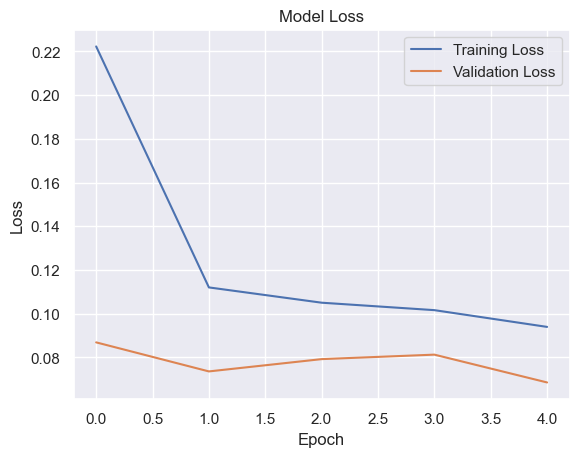

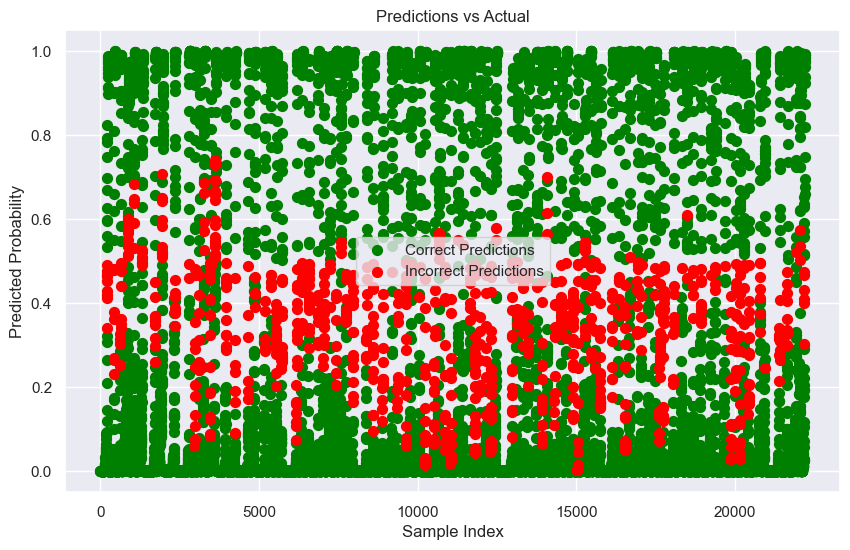

[I 2024-11-11 16:37:53,633] Trial 0 finished with value: 0.93 and parameters: {'learning_rate': 0.005425786676894478, 'dropout_rate': 0.6942628018340888, 'batch_size': 128}. Best is trial 0 with value: 0.93.


Test Confusion Matrix:
 [[79  1]
 [ 6 14]]
Test Accuracy: 0.93
Test Precision: 0.93
Test Recall: 0.70
Test F1 Score: 0.80
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_6 (Conv1D)            (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_6 (MaxPooling1 (None, 11, 32)            0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_7 (MaxPooling1 (None, 4, 64)             0         
_________________________________________________________________
dropout_11 (Dropout)         (None, 4, 64)             0        

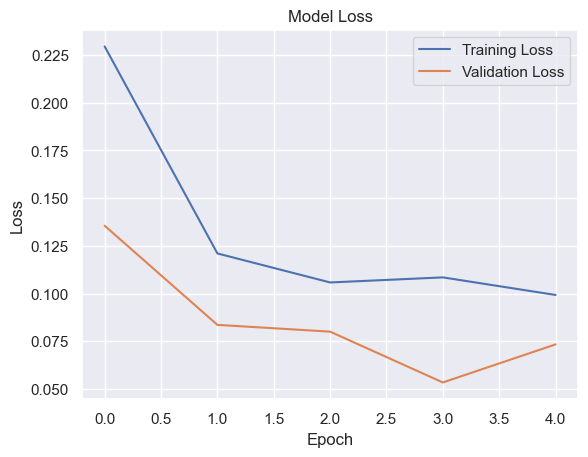

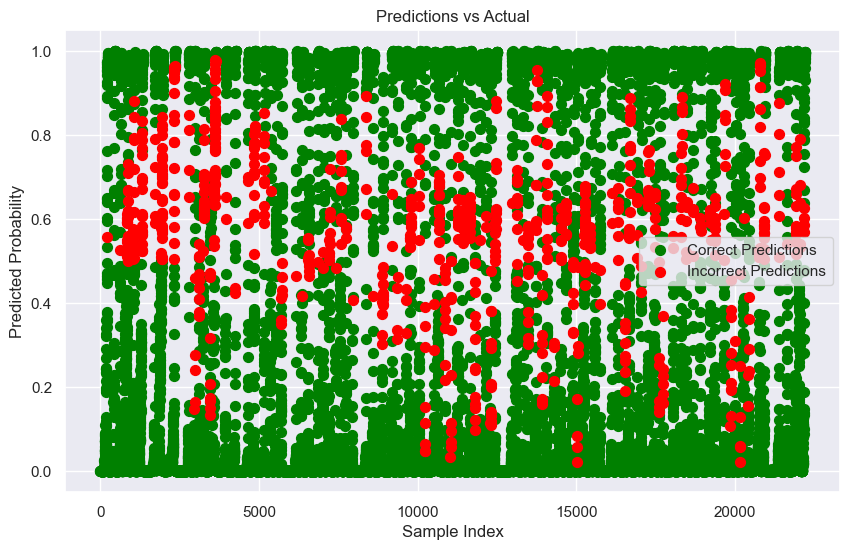

[I 2024-11-11 16:38:04,604] Trial 1 finished with value: 0.94 and parameters: {'learning_rate': 0.002500382538016224, 'dropout_rate': 0.4774004896489551, 'batch_size': 16}. Best is trial 1 with value: 0.94.


Test Confusion Matrix:
 [[77  3]
 [ 3 17]]
Test Accuracy: 0.94
Test Precision: 0.85
Test Recall: 0.85
Test F1 Score: 0.85
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_9 (Conv1D)            (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_9 (MaxPooling1 (None, 11, 32)            0         
_________________________________________________________________
dropout_15 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_10 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_10 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 4, 64)             0        

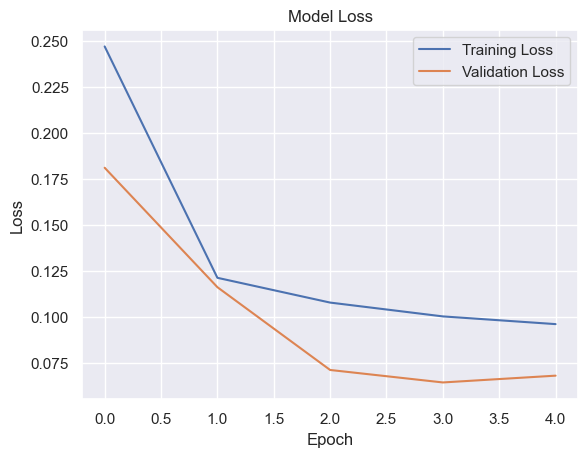

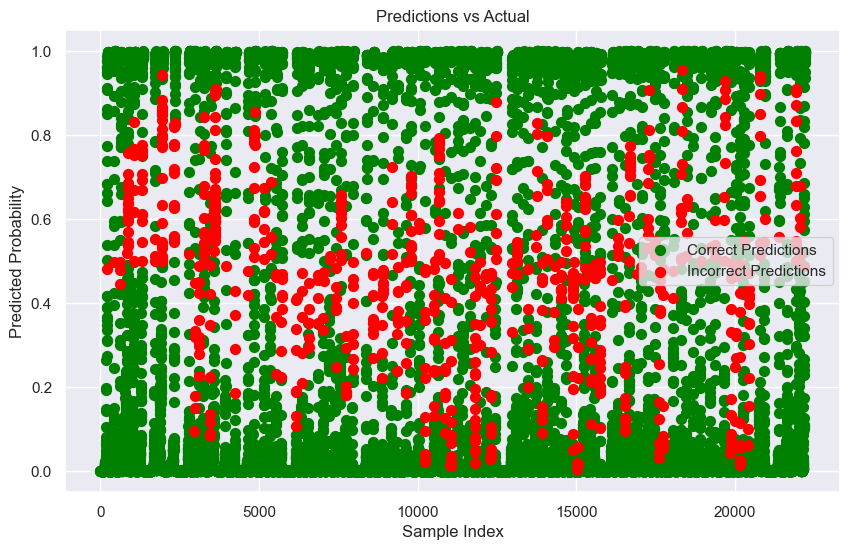

[I 2024-11-11 16:38:15,727] Trial 2 finished with value: 0.96 and parameters: {'learning_rate': 0.0013519992295392838, 'dropout_rate': 0.4082579870568192, 'batch_size': 128}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[79  1]
 [ 3 17]]
Test Accuracy: 0.96
Test Precision: 0.94
Test Recall: 0.85
Test F1 Score: 0.89
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_12 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_12 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_13 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_13 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_21 (Dropout)         (None, 4, 64)             0        

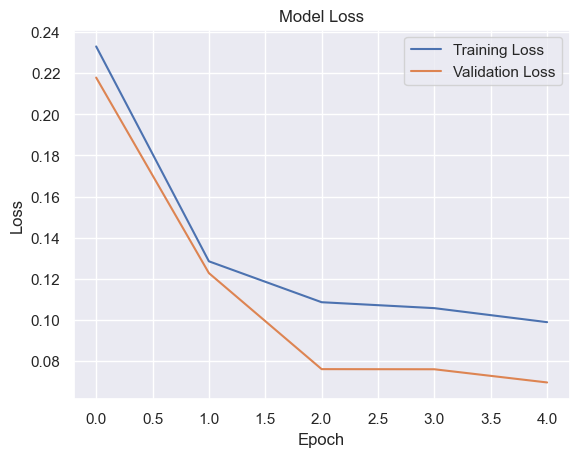

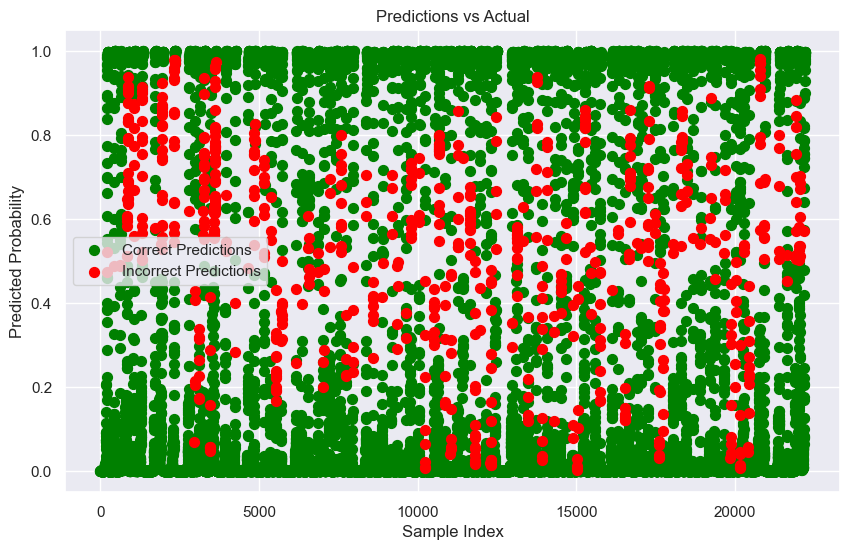

[I 2024-11-11 16:38:26,612] Trial 3 finished with value: 0.94 and parameters: {'learning_rate': 0.0007409822059329406, 'dropout_rate': 0.4761499200895698, 'batch_size': 64}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[78  2]
 [ 4 16]]
Test Accuracy: 0.94
Test Precision: 0.89
Test Recall: 0.80
Test F1 Score: 0.84
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_15 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_15 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_25 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_16 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_16 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_26 (Dropout)         (None, 4, 64)             0        

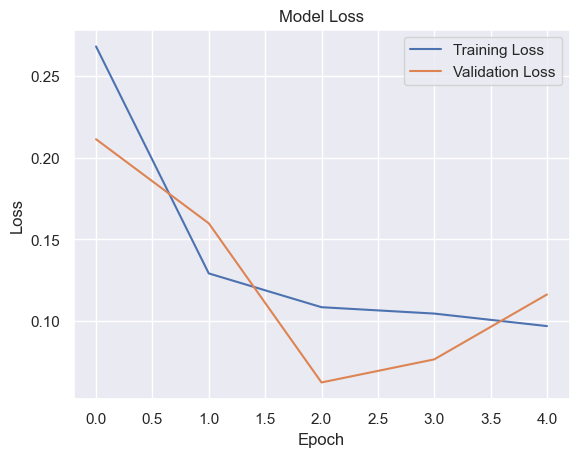

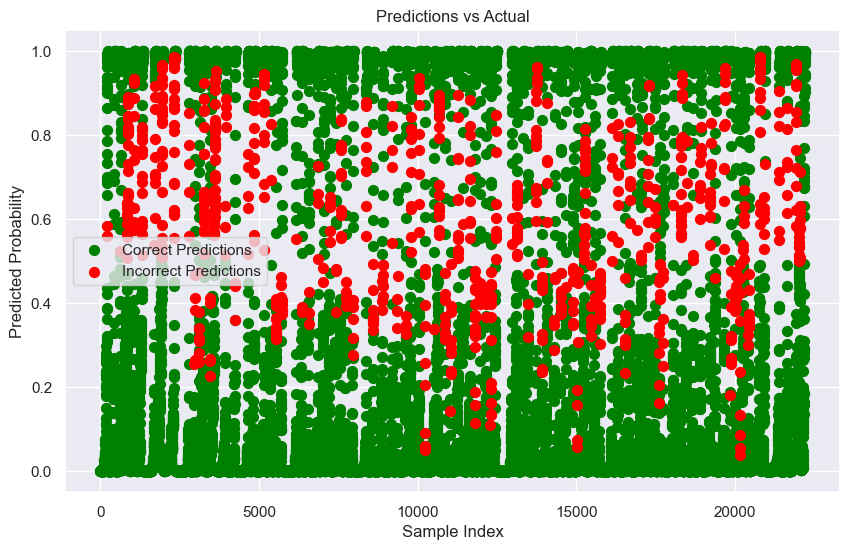

[I 2024-11-11 16:38:37,591] Trial 4 finished with value: 0.96 and parameters: {'learning_rate': 0.007290006892748354, 'dropout_rate': 0.36516410807700705, 'batch_size': 16}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[79  1]
 [ 3 17]]
Test Accuracy: 0.96
Test Precision: 0.94
Test Recall: 0.85
Test F1 Score: 0.89
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_18 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_18 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_30 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_19 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_19 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_31 (Dropout)         (None, 4, 64)             0        

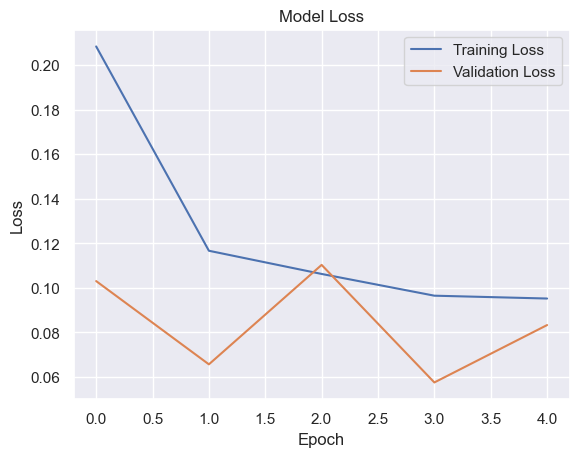

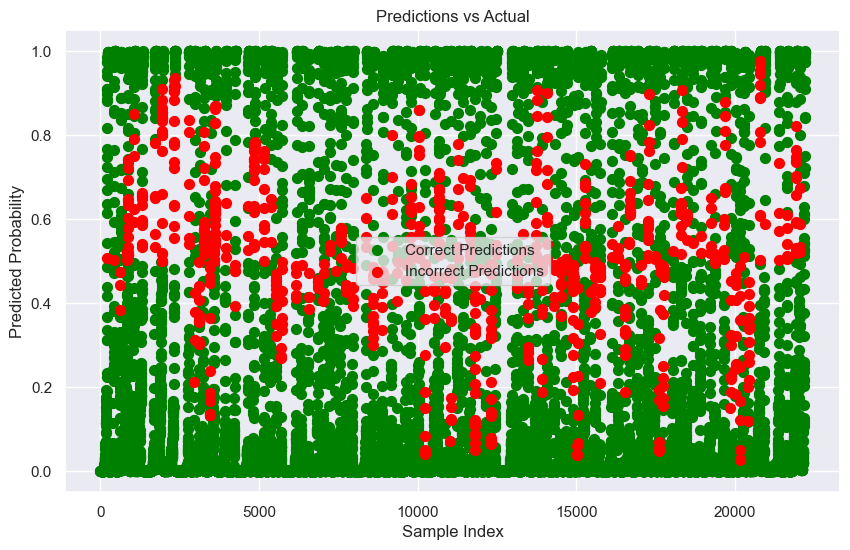

[I 2024-11-11 16:38:48,680] Trial 5 finished with value: 0.96 and parameters: {'learning_rate': 0.0043395458030921225, 'dropout_rate': 0.43767983239204944, 'batch_size': 100}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[79  1]
 [ 3 17]]
Test Accuracy: 0.96
Test Precision: 0.94
Test Recall: 0.85
Test F1 Score: 0.89
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_21 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_21 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_35 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_22 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_36 (Dropout)         (None, 4, 64)             0        

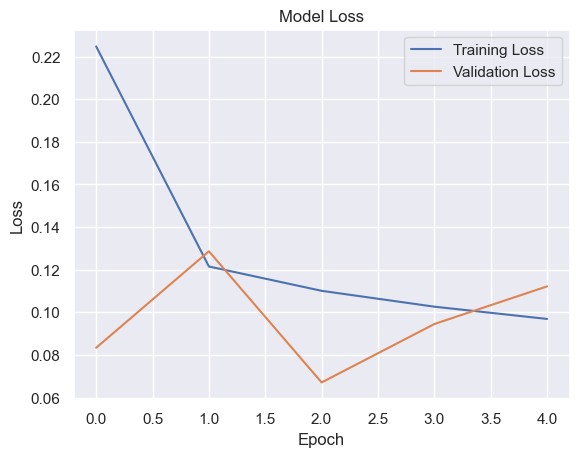

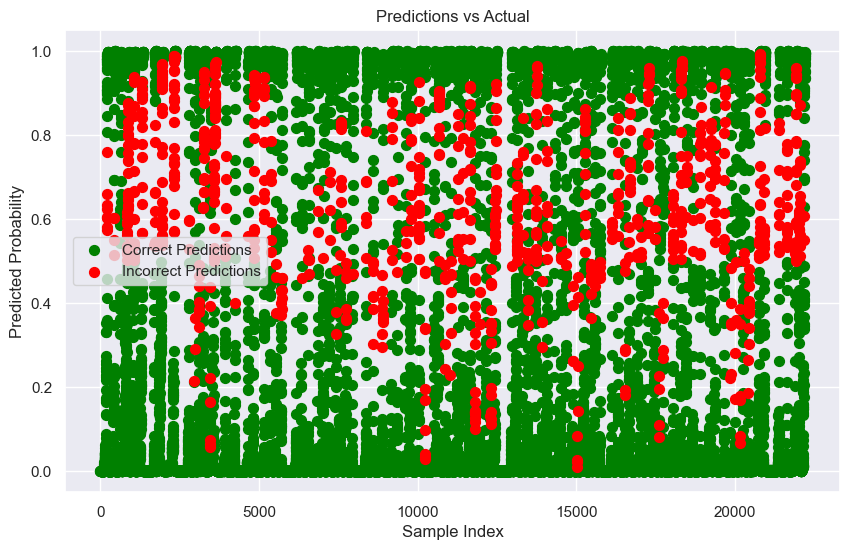

[I 2024-11-11 16:38:59,872] Trial 6 finished with value: 0.92 and parameters: {'learning_rate': 0.00014399799564117225, 'dropout_rate': 0.5042148923123095, 'batch_size': 32}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[75  5]
 [ 3 17]]
Test Accuracy: 0.92
Test Precision: 0.77
Test Recall: 0.85
Test F1 Score: 0.81
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_24 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_24 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_40 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_25 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_25 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_41 (Dropout)         (None, 4, 64)             0        

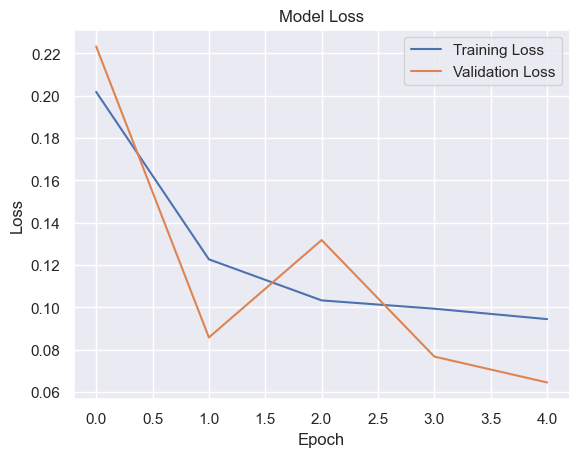

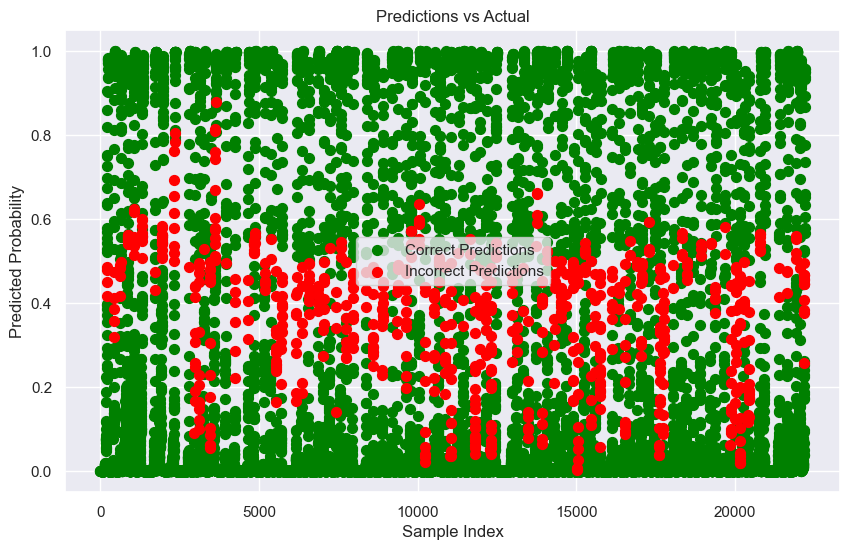

[I 2024-11-11 16:39:10,783] Trial 7 finished with value: 0.94 and parameters: {'learning_rate': 0.00022155383708375278, 'dropout_rate': 0.39027733575789125, 'batch_size': 16}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[79  1]
 [ 5 15]]
Test Accuracy: 0.94
Test Precision: 0.94
Test Recall: 0.75
Test F1 Score: 0.83
Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_27 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_27 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_45 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_28 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_28 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_46 (Dropout)         (None, 4, 64)             0        

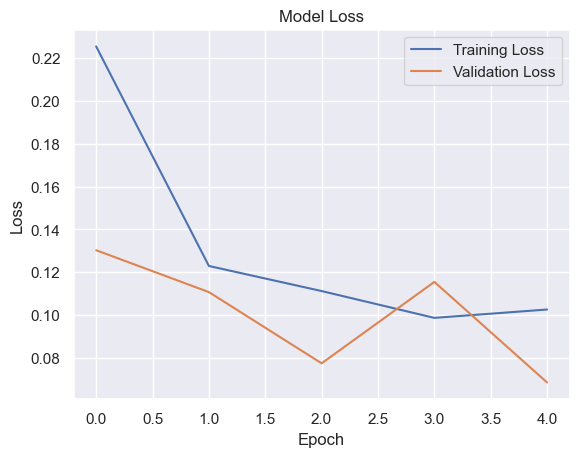

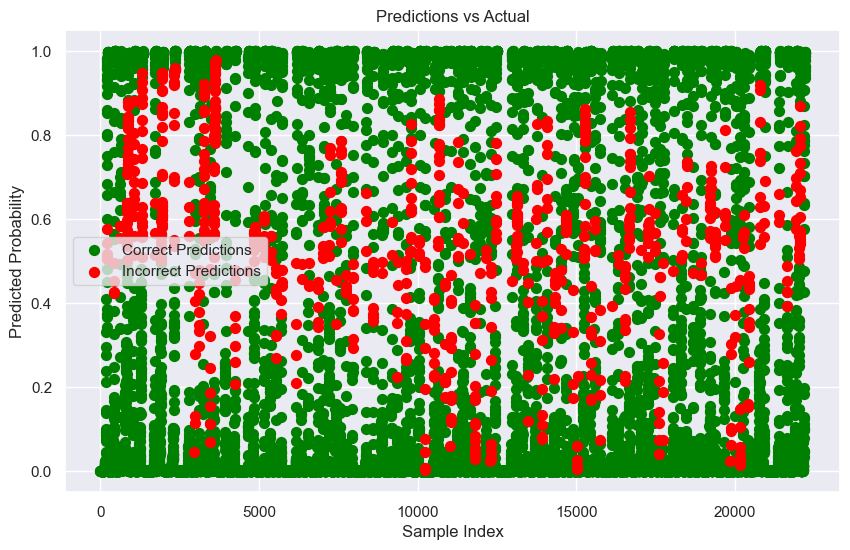

[I 2024-11-11 16:39:21,573] Trial 8 finished with value: 0.94 and parameters: {'learning_rate': 0.0006418775531516362, 'dropout_rate': 0.553543788350225, 'batch_size': 32}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[77  3]
 [ 3 17]]
Test Accuracy: 0.94
Test Precision: 0.85
Test Recall: 0.85
Test F1 Score: 0.85
Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_30 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_30 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_50 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_31 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_31 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_51 (Dropout)         (None, 4, 64)             0       

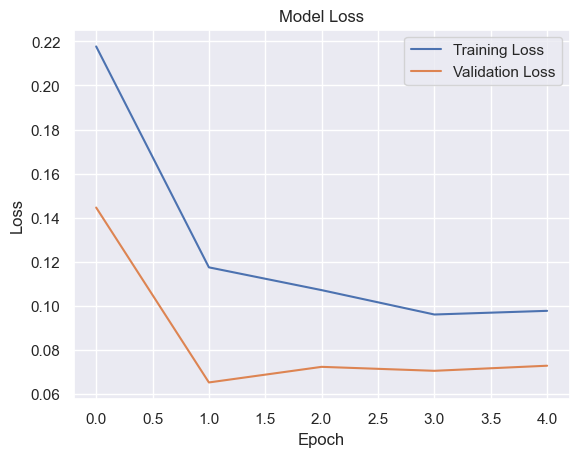

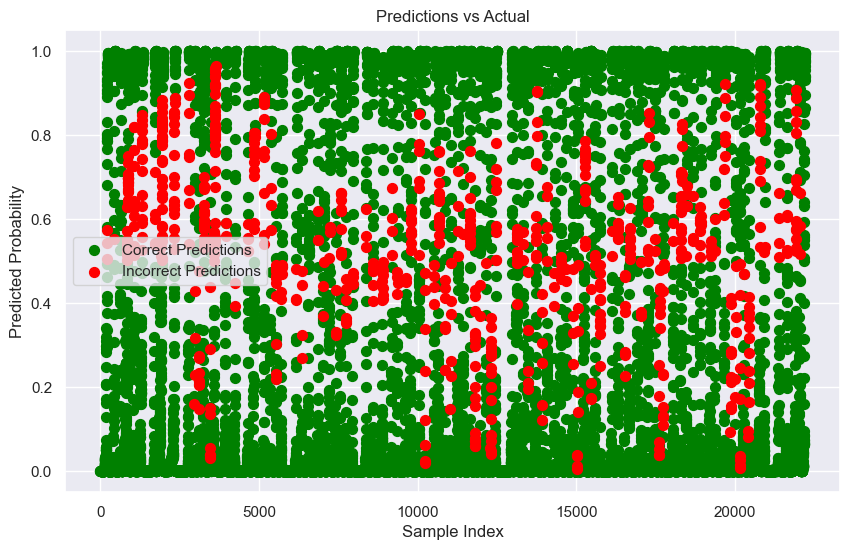

[I 2024-11-11 16:39:32,645] Trial 9 finished with value: 0.94 and parameters: {'learning_rate': 0.00021828223521260293, 'dropout_rate': 0.35327974087526315, 'batch_size': 128}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[77  3]
 [ 3 17]]
Test Accuracy: 0.94
Test Precision: 0.85
Test Recall: 0.85
Test F1 Score: 0.85
Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_33 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_33 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_55 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_34 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_34 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_56 (Dropout)         (None, 4, 64)             0       

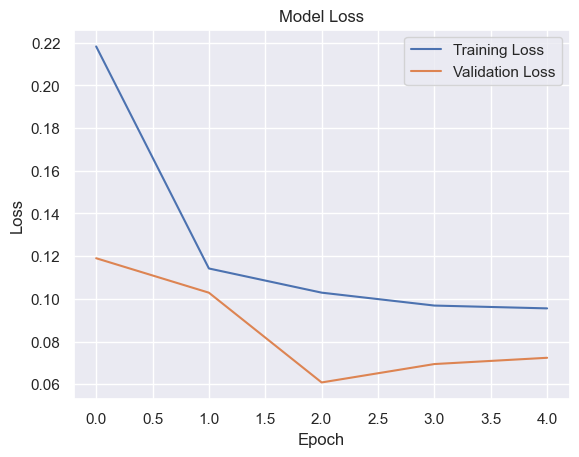

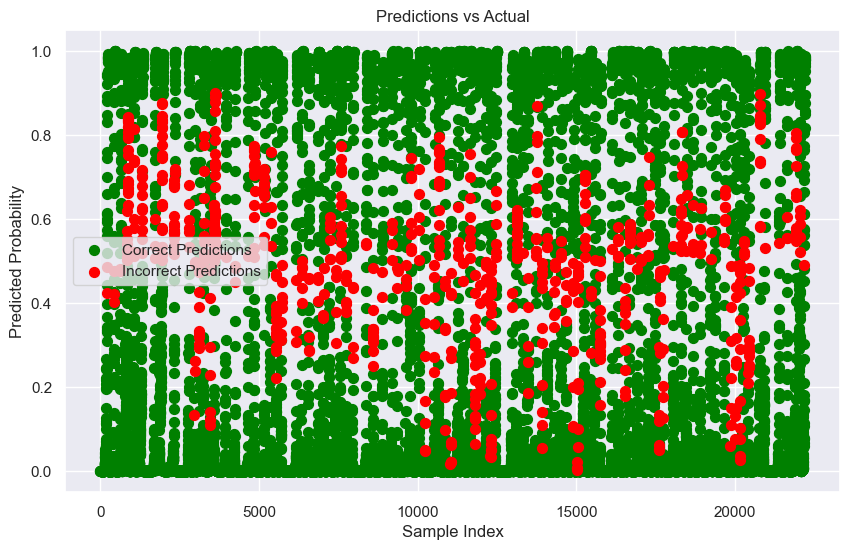

[I 2024-11-11 16:39:43,372] Trial 10 finished with value: 0.95 and parameters: {'learning_rate': 0.0017094746933386995, 'dropout_rate': 0.6080581012800441, 'batch_size': 128}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[79  1]
 [ 4 16]]
Test Accuracy: 0.95
Test Precision: 0.94
Test Recall: 0.80
Test F1 Score: 0.86
Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_36 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_36 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_60 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_37 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_37 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_61 (Dropout)         (None, 4, 64)             0       

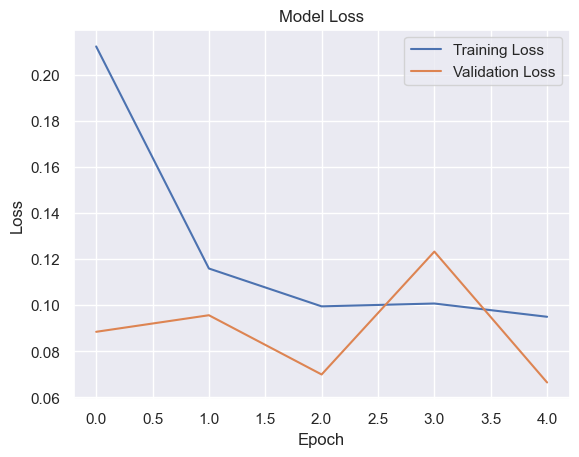

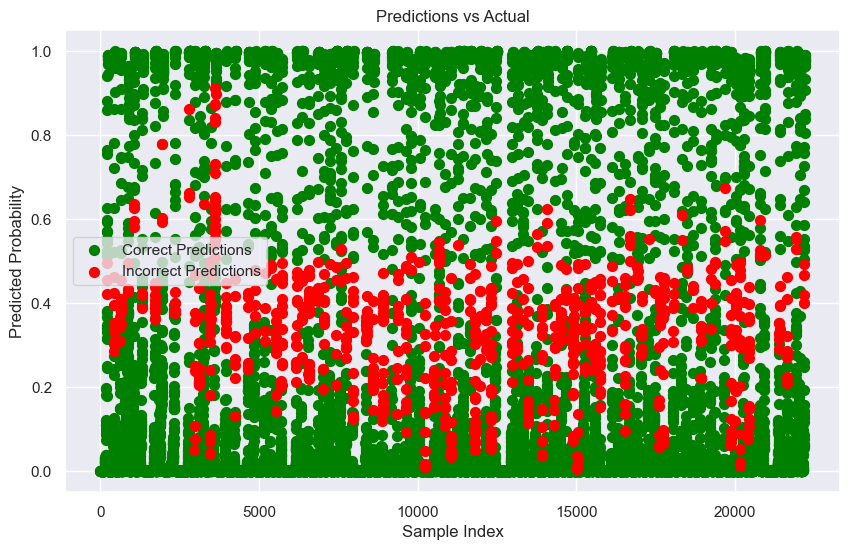

[I 2024-11-11 16:39:54,423] Trial 11 finished with value: 0.93 and parameters: {'learning_rate': 0.00927519698883376, 'dropout_rate': 0.30944741488324806, 'batch_size': 16}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[79  1]
 [ 6 14]]
Test Accuracy: 0.93
Test Precision: 0.93
Test Recall: 0.70
Test F1 Score: 0.80
Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_39 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_39 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_65 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_40 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_40 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_66 (Dropout)         (None, 4, 64)             0       

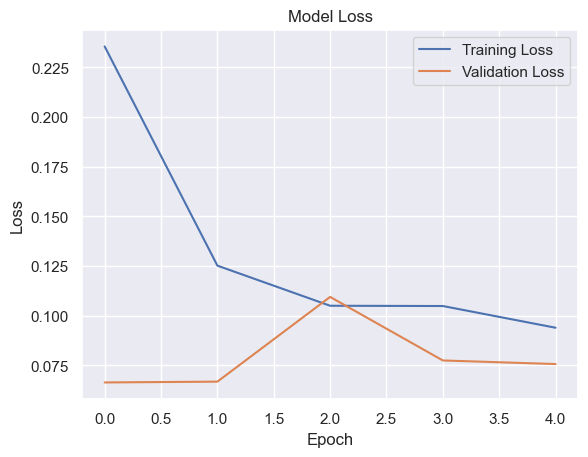

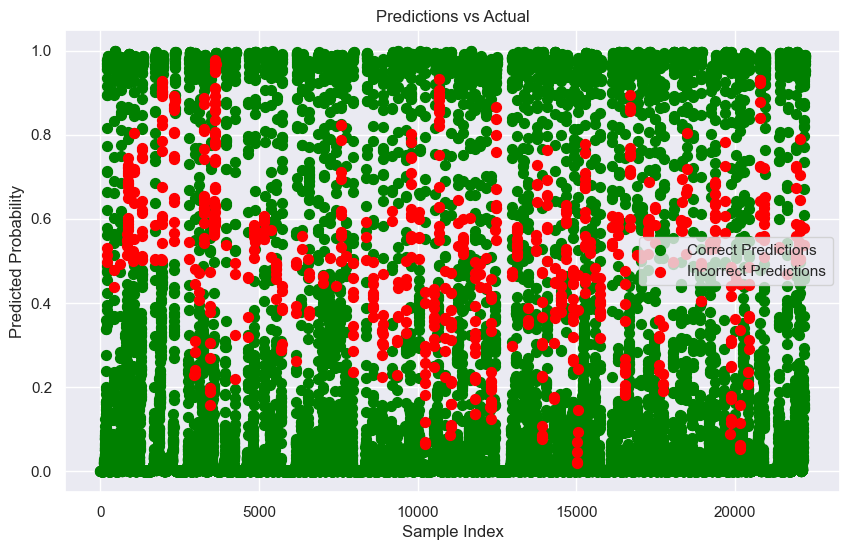

[I 2024-11-11 16:40:05,431] Trial 12 finished with value: 0.94 and parameters: {'learning_rate': 0.0013630308268289448, 'dropout_rate': 0.390029995064366, 'batch_size': 100}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[77  3]
 [ 3 17]]
Test Accuracy: 0.94
Test Precision: 0.85
Test Recall: 0.85
Test F1 Score: 0.85
Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_42 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_42 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_70 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_43 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_43 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_71 (Dropout)         (None, 4, 64)             0       

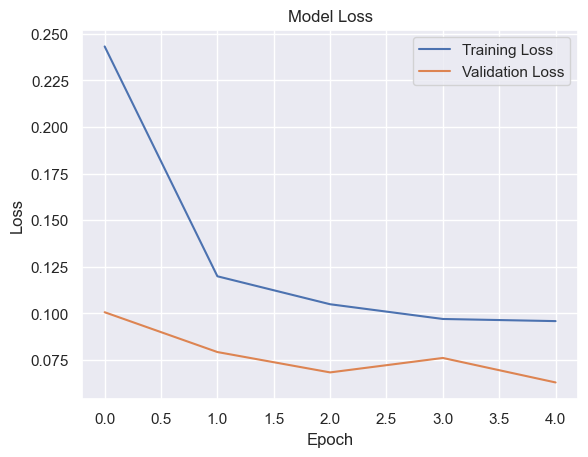

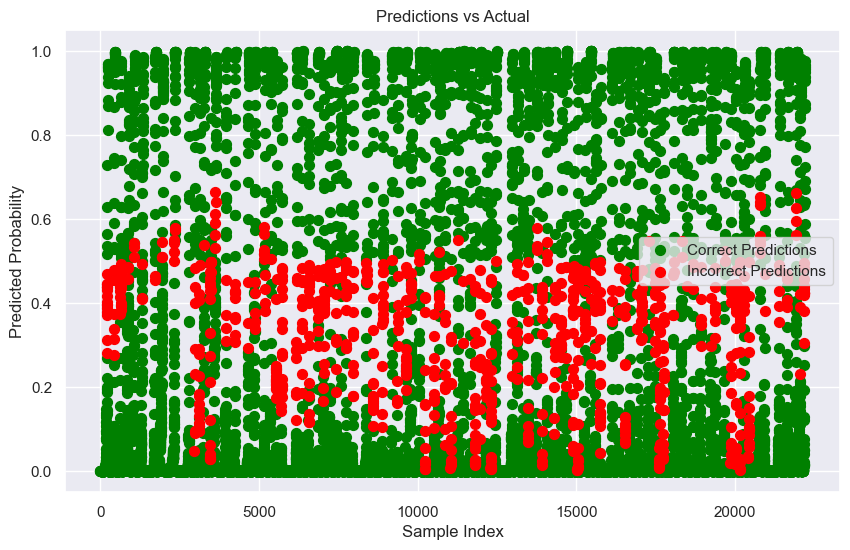

[I 2024-11-11 16:40:16,317] Trial 13 finished with value: 0.95 and parameters: {'learning_rate': 0.00046225714171288496, 'dropout_rate': 0.3036154554240535, 'batch_size': 64}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[80  0]
 [ 5 15]]
Test Accuracy: 0.95
Test Precision: 1.00
Test Recall: 0.75
Test F1 Score: 0.86
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_45 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_45 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_75 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_46 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_46 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_76 (Dropout)         (None, 4, 64)             0       

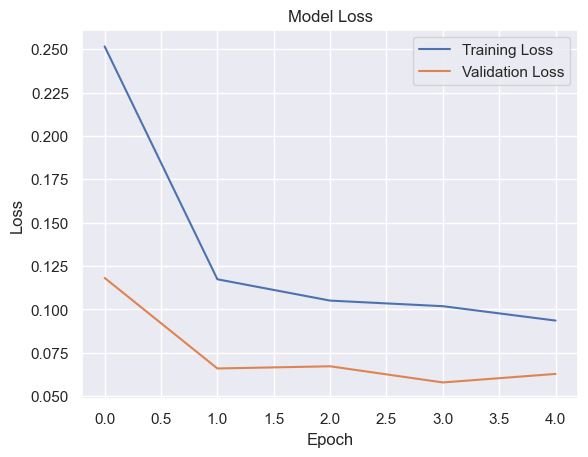

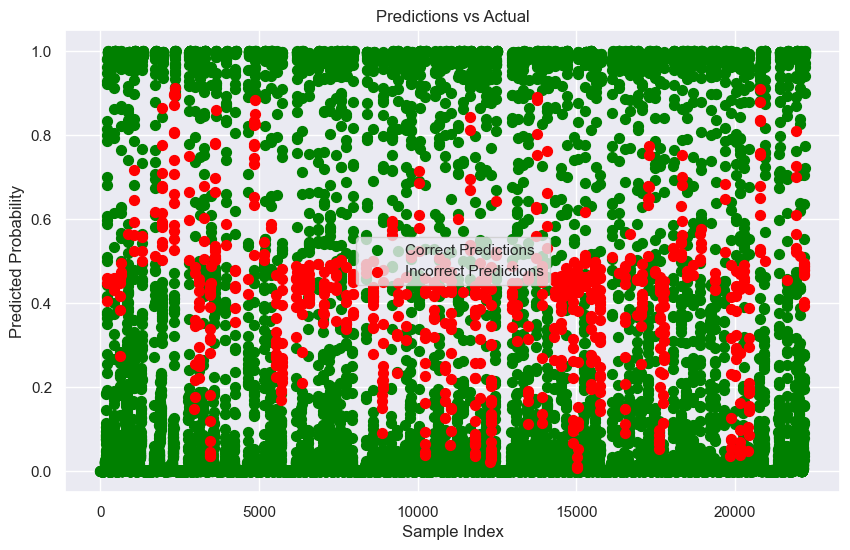

[I 2024-11-11 16:40:27,854] Trial 14 finished with value: 0.93 and parameters: {'learning_rate': 0.003194617296085539, 'dropout_rate': 0.4097628466702935, 'batch_size': 128}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[79  1]
 [ 6 14]]
Test Accuracy: 0.93
Test Precision: 0.93
Test Recall: 0.70
Test F1 Score: 0.80
Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_48 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_48 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_80 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_49 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_49 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_81 (Dropout)         (None, 4, 64)             0       

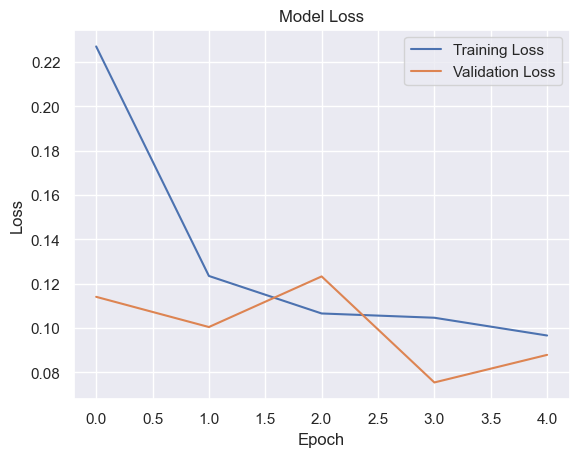

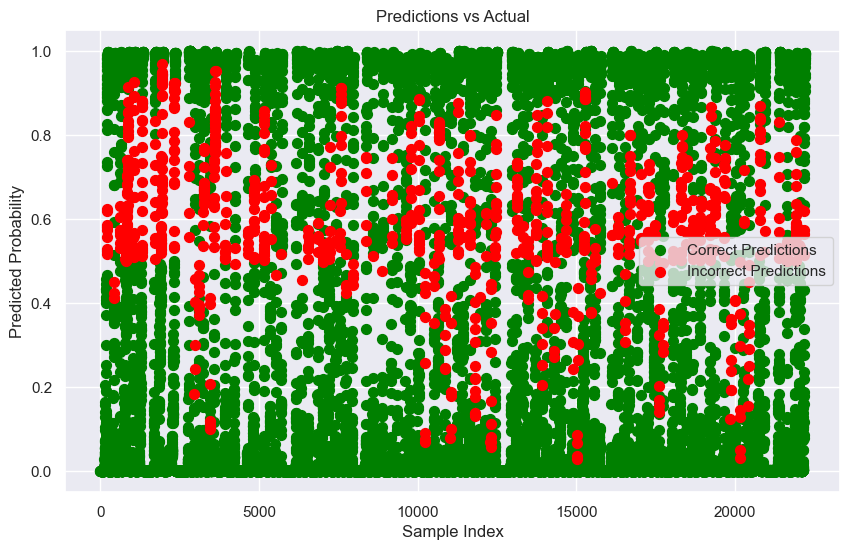

[I 2024-11-11 16:40:38,576] Trial 15 finished with value: 0.94 and parameters: {'learning_rate': 0.009402368467447336, 'dropout_rate': 0.355325357929534, 'batch_size': 16}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[76  4]
 [ 2 18]]
Test Accuracy: 0.94
Test Precision: 0.82
Test Recall: 0.90
Test F1 Score: 0.86
Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_51 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_51 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_85 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_52 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_52 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_86 (Dropout)         (None, 4, 64)             0       

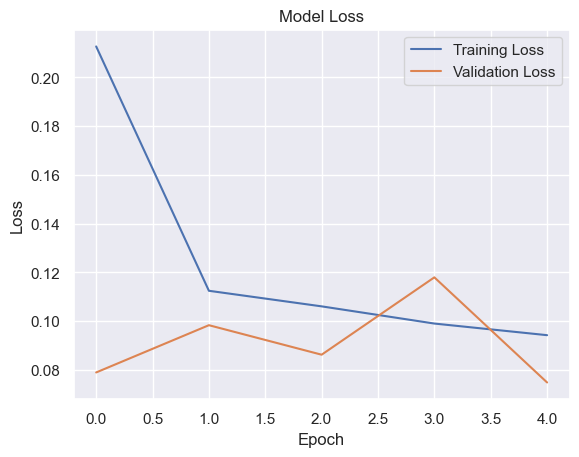

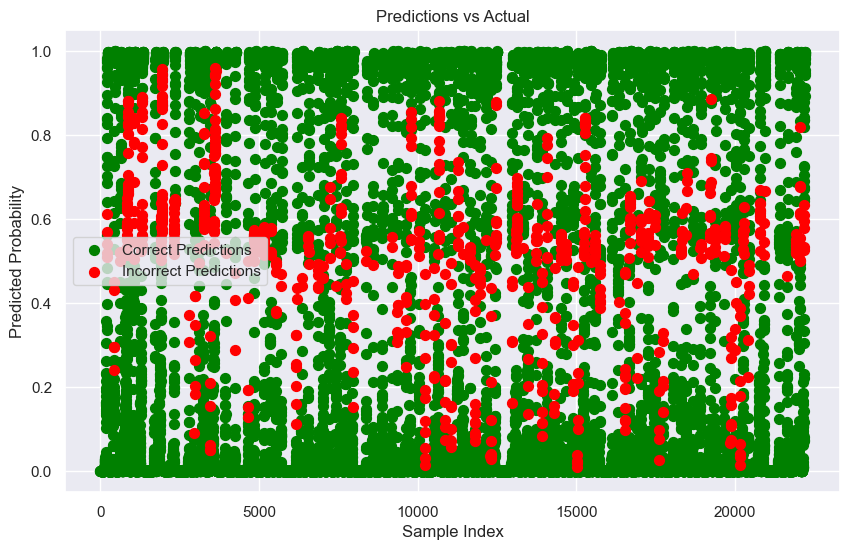

[I 2024-11-11 16:40:49,364] Trial 16 finished with value: 0.94 and parameters: {'learning_rate': 0.00037024014881541494, 'dropout_rate': 0.4432583725277409, 'batch_size': 128}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[78  2]
 [ 4 16]]
Test Accuracy: 0.94
Test Precision: 0.89
Test Recall: 0.80
Test F1 Score: 0.84
Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_54 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_54 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_90 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_55 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_55 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_91 (Dropout)         (None, 4, 64)             0       

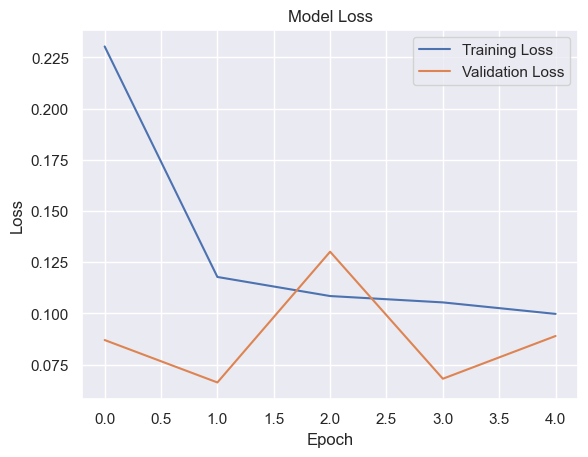

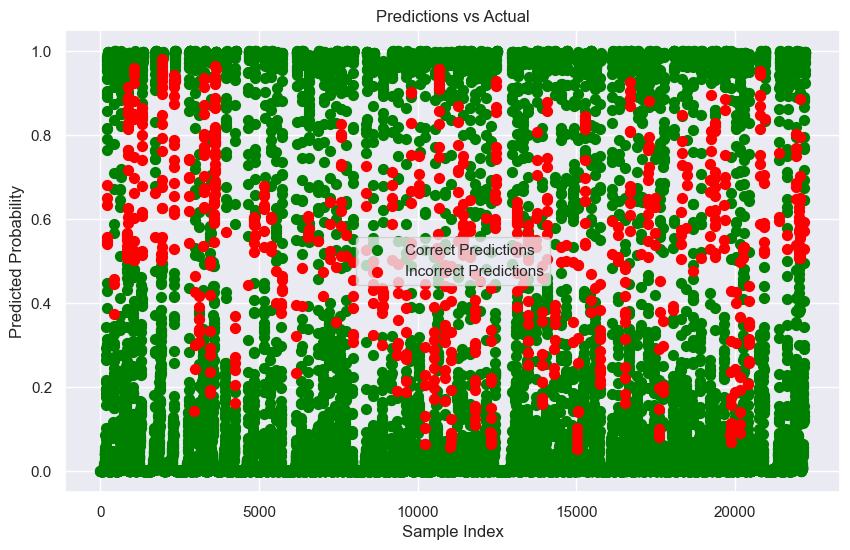

[I 2024-11-11 16:41:00,459] Trial 17 finished with value: 0.93 and parameters: {'learning_rate': 0.0012163170215351241, 'dropout_rate': 0.5270529906937454, 'batch_size': 16}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[77  3]
 [ 4 16]]
Test Accuracy: 0.93
Test Precision: 0.84
Test Recall: 0.80
Test F1 Score: 0.82
Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_57 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_57 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_95 (Dropout)         (None, 11, 32)            0         
_________________________________________________________________
conv1d_58 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_58 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_96 (Dropout)         (None, 4, 64)             0       

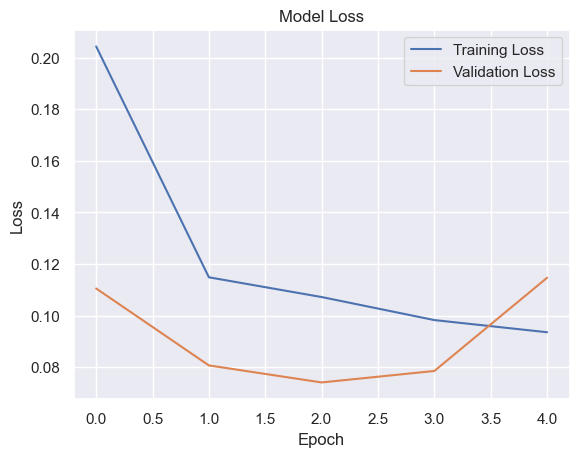

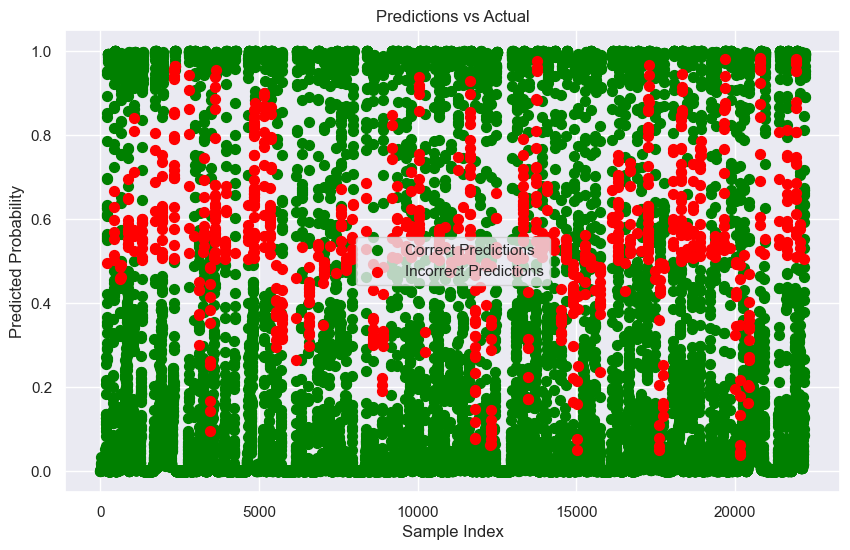

[I 2024-11-11 16:41:11,372] Trial 18 finished with value: 0.94 and parameters: {'learning_rate': 0.0022290712397510753, 'dropout_rate': 0.35330166688467113, 'batch_size': 64}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[77  3]
 [ 3 17]]
Test Accuracy: 0.94
Test Precision: 0.85
Test Recall: 0.85
Test F1 Score: 0.85
Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_60 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_60 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_100 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_61 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_61 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_101 (Dropout)        (None, 4, 64)             0       

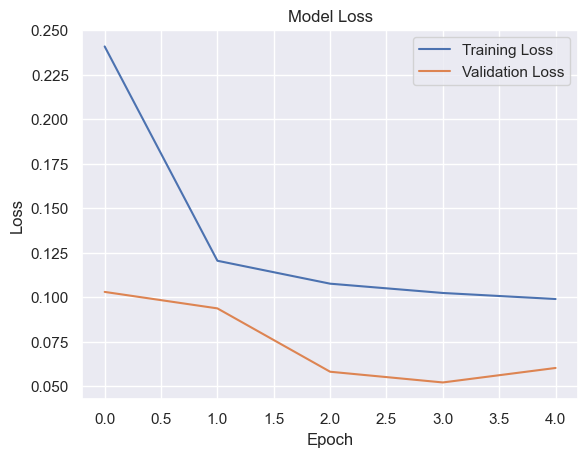

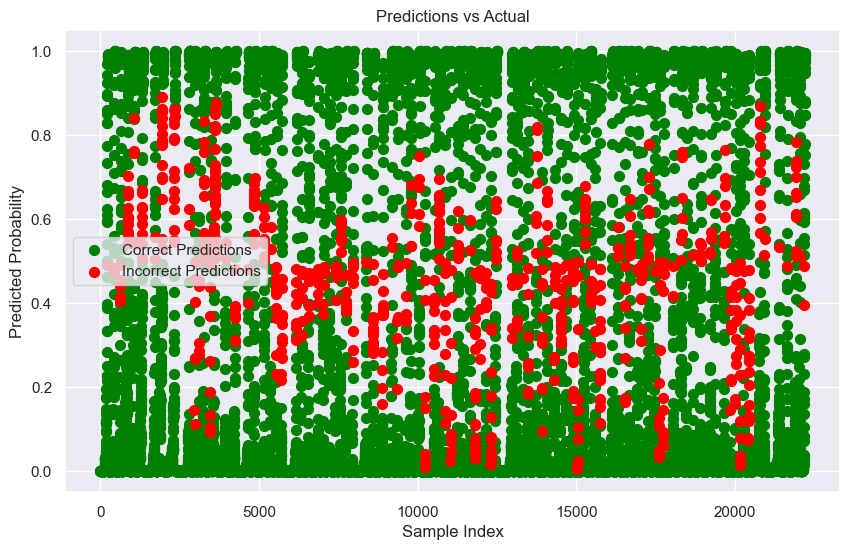

[I 2024-11-11 16:41:22,712] Trial 19 finished with value: 0.96 and parameters: {'learning_rate': 0.005496620561589909, 'dropout_rate': 0.5865867154276843, 'batch_size': 32}. Best is trial 2 with value: 0.96.


Test Confusion Matrix:
 [[79  1]
 [ 3 17]]
Test Accuracy: 0.96
Test Precision: 0.94
Test Recall: 0.85
Test F1 Score: 0.89
Best trial: {'learning_rate': 0.0013519992295392838, 'dropout_rate': 0.4082579870568192, 'batch_size': 128}
CPU times: total: 3min 59s
Wall time: 3min 39s


In [27]:
%%time
cb = keras.callbacks.TensorBoard(log_dir= get_run_logdir("run_cnn_bin_alt"), histogram_freq=1, write_graph= True, update_freq='epoch')

# [WriteCode]
import optuna

def CNN_class_train(model, epochs, batch_size):
    history = model.fit(
        seq_array,  
        label_array,  
        epochs=epochs, 
        batch_size=batch_size,  
        validation_split=0.05,  
        callbacks=[cb],
        verbose=1
    )
    
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend()
    plt.show()
    
    # on training data
    predictions = model.predict(seq_array)
    predicted_classes = (predictions > 0.5).astype(int)
    correct_predictions = predicted_classes == label_array
    plt.figure(figsize=(10, 6))
    plt.scatter(np.where(correct_predictions)[0], predictions[correct_predictions], label='Correct Predictions', color='green', s=50)
    plt.scatter(np.where(~correct_predictions)[0], predictions[~correct_predictions], label='Incorrect Predictions', color='red', s=50)
    plt.title('Predictions vs Actual')
    plt.xlabel('Sample Index')
    plt.ylabel('Predicted Probability')
    plt.legend()
    plt.show()
    
    # on test data
    predictions_test = model.predict(seq_array_test_last)
    predicted_classes_test = (predictions_test > 0.5).astype(int)
    
    conf_matrix_test = confusion_matrix(label_array_test_last, predicted_classes_test)
    print("Test Confusion Matrix:\n", conf_matrix_test)
    
    precision_test = precision_score(label_array_test_last, predicted_classes_test)
    recall_test = recall_score(label_array_test_last, predicted_classes_test)
    f1_test = f1_score(label_array_test_last, predicted_classes_test)
    test_accuracy = accuracy_score(label_array_test_last, predicted_classes_test)
    
    print(f"Test Accuracy: {test_accuracy:.2f}")
    print(f"Test Precision: {precision_test:.2f}")
    print(f"Test Recall: {recall_test:.2f}")
    print(f"Test F1 Score: {f1_test:.2f}")
    
    return test_accuracy

def objective(trial):
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-2, log=True)
    
    dropout_rate = trial.suggest_float('dropout_rate', 0.3, 0.7)
    batch_size = trial.suggest_categorical('batch_size', [ba, 16, 32, 64, 128])
    model = model_cnn_bin_def(learning_rate=learning_rate, dropout_rate=dropout_rate)
    val_accuracy = CNN_class_train(model, epochs=ep, batch_size=ba)
    
    return val_accuracy

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=20)
print("Best trial:", study.best_trial.params) 

Best trial parameters: {'learning_rate': 0.0013519992295392838, 'dropout_rate': 0.4082579870568192, 'batch_size': 128}
Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_63 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_63 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_105 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_64 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_64 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_106 (Dropout)        (None, 4, 64)             0         


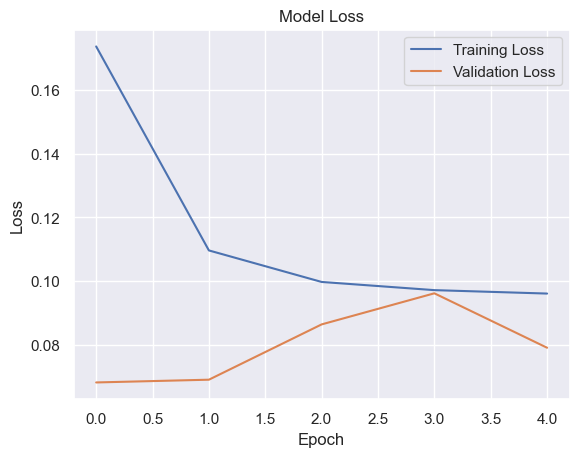

Best Model Test Confusion Matrix:
 [[79  1]
 [ 6 14]]
Best Model Test Accuracy: 0.93
Best Model Test Precision: 0.93
Best Model Test Recall: 0.70
Best Model Test F1 Score: 0.80


In [28]:
# 提取最佳参数
best_params = study.best_trial.params
print("Best trial parameters:", best_params)

# 使用最佳参数重新构建模型
model_cnn_bin_alt = model_cnn_bin_def(
    learning_rate=best_params['learning_rate'],
    dropout_rate=best_params['dropout_rate']
)

# 训练模型
history = model_cnn_bin_alt.fit(
    seq_array,
    label_array,
    epochs=ep,
    # batch_size=best_params['batch_size'],
    validation_split=0.05,
    verbose=1
)

# 输出训练集和验证集的损失
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

# 在测试集上评估性能
predictions_test = model_cnn_bin_alt.predict(seq_array_test_last)
predicted_classes_test = (predictions_test > 0.5).astype(int)

# 计算测试集的指标
conf_matrix_test = confusion_matrix(label_array_test_last, predicted_classes_test)
print("Best Model Test Confusion Matrix:\n", conf_matrix_test)

precision_test = precision_score(label_array_test_last, predicted_classes_test)
recall_test = recall_score(label_array_test_last, predicted_classes_test)
f1_test = f1_score(label_array_test_last, predicted_classes_test)
test_accuracy = accuracy_score(label_array_test_last, predicted_classes_test)

# 打印最终性能指标
print(f"Best Model Test Accuracy: {test_accuracy:.2f}")
print(f"Best Model Test Precision: {precision_test:.2f}")
print(f"Best Model Test Recall: {recall_test:.2f}")
print(f"Best Model Test F1 Score: {f1_test:.2f}")

### LSTM Network
In this section build a LSTM network to do binary classification. The choice of network architecture - no. of layers, type of layers, nodes per layer, activations - is left to students. Please include the following:
- name the model as "model_lstm_bin"
- dropout layer after each LSTM layer (drop probability of your choice)
- output dense layer with appropriate no. of nodes and activation for binary classification
- appropriate loss function and optimizer.

Set 'accuracy' as the metric.

Print the model summary.



In [29]:
# [WriteCode]
model_lstm_bin = Sequential()
model_lstm_bin.add(LSTM(50, return_sequences=True, input_shape=(seq_array.shape[1], seq_array.shape[2])))
model_lstm_bin.add(Dropout(0.2))
model_lstm_bin.add(LSTM(50))
model_lstm_bin.add(Dropout(0.2))
model_lstm_bin.add(Dense(1, activation='sigmoid'))


model_lstm_bin.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
model_lstm_bin.summary()

Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 25, 50)            15200     
_________________________________________________________________
dropout_110 (Dropout)        (None, 25, 50)            0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 50)                20200     
_________________________________________________________________
dropout_111 (Dropout)        (None, 50)                0         
_________________________________________________________________
dense_66 (Dense)             (None, 1)                 51        
Total params: 35,451
Trainable params: 35,451
Non-trainable params: 0
_________________________________________________________________


#### Model Training

Fit the model on **seq_array** and **label_array** with epochs and batch_size set according to the parameter values in the form on top. Use validation_split = 0.05

##### Use callback: "**keras.callbacks.TensorBoard(log_dir=get_run_logdir("run_lstm_bin") , histogram_freq=1, write_graph= True, update_freq='epoch')**" to store the model training to Tensorboard log file "run_lstm_bin" for visualization.

Epoch 1/5


2024-11-11 15:31:22.055357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-11-11 15:31:22.056475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-11-11 15:31:22.057693: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

211/212 [============================>.] - ETA: 0s - loss: 0.1823 - accuracy: 0.9271

2024-11-11 15:31:30.117831: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-11-11 15:31:30.118570: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-11-11 15:31:30.119404: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

212/212 [==============================] - 9s 27ms/step - loss: 0.1822 - accuracy: 0.9271 - val_loss: 0.0856 - val_accuracy: 0.9757
Epoch 2/5
212/212 [==============================] - 5s 25ms/step - loss: 0.0913 - accuracy: 0.9622 - val_loss: 0.0588 - val_accuracy: 0.9820
Epoch 3/5
212/212 [==============================] - 6s 27ms/step - loss: 0.0769 - accuracy: 0.9689 - val_loss: 0.0531 - val_accuracy: 0.9892
Epoch 4/5
212/212 [==============================] - 5s 25ms/step - loss: 0.0705 - accuracy: 0.9705 - val_loss: 0.0576 - val_accuracy: 0.9757
Epoch 5/5
212/212 [==============================] - 5s 24ms/step - loss: 0.0662 - accuracy: 0.9724 - val_loss: 0.0598 - val_accuracy: 0.9730


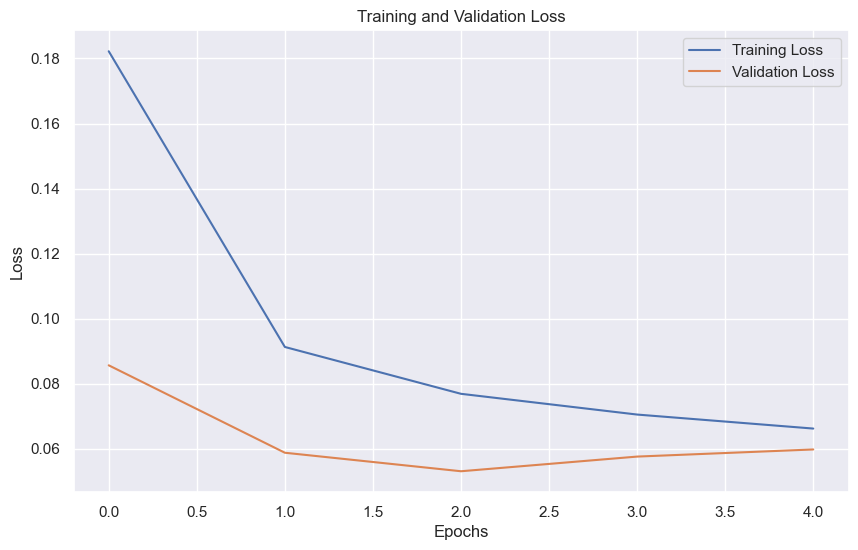

CPU times: user 37 s, sys: 5.22 s, total: 42.2 s
Wall time: 30.5 s


In [63]:
%%time
cb = keras.callbacks.TensorBoard(log_dir= get_run_logdir("run_lstm_bin"), histogram_freq=1, write_graph= True, update_freq='epoch')
# [WriteCode]

history = model_lstm_bin.fit(seq_array, label_array, epochs=ep, batch_size=ba, validation_split=0.05, callbacks=[cb])

# 绘制训练集和验证集的损失曲线
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

#### Training data performance metrics

- Determine the accuracy of prediction of the trained model on the training data
- Print the confusion matrix for training data prediction
- Print the precision and recall for training data prediction

2024-11-11 15:31:57.428645: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-11-11 15:31:57.429549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-11-11 15:31:57.430287: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

695/695 [==============================] - 2s 3ms/step
Training accuracy: 0.9754725472547254
Training precision: 0.8832883288328833
Training recall: 0.9496774193548387
Training F1 score: 0.9152805844862427
Confusion matrix:
 [[18731   389]
 [  156  2944]]


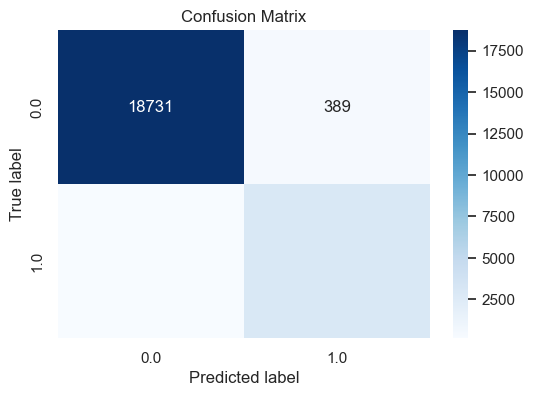

In [64]:
# [WriteCode]
y_pred = model_lstm_bin.predict(seq_array)
y_pred_binary = (y_pred > 0.5).astype(int)

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
accuracy = accuracy_score(label_array, y_pred_binary)
precision = precision_score(label_array, y_pred_binary)
recall = recall_score(label_array, y_pred_binary)
f1 = f1_score(label_array, y_pred_binary)


print("Training accuracy:", accuracy)
print("Training precision:", precision)
print("Training recall:", recall)
print("Training F1 score:", f1)
confusion_mat = confusion_matrix(label_array, y_pred_binary)
print("Confusion matrix:\n", confusion_mat)
df_cm = pd.DataFrame(confusion_mat, index=[i for i in np.unique(label_array)], columns=[i for i in np.unique(label_array)])
plt.figure(figsize=(6, 4))
sns.heatmap(df_cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.show()

#### Test data for prediction

To evaluate the performance on the test data, only the last cycles of data for each engine id in the test data is kept for testing purposes. In order to compare the results to the target, we pick the last sequence for each engine id in the test data (excluding engine ids whose last cycle is shorter than "sequence length" size).

In [30]:
seq_array_test_last = [test_df[test_df['id']==id][sequence_cols].values[-sequence_length:] 
                       for id in test_df['id'].unique() if len(test_df[test_df['id']==id]) >= sequence_length]

seq_array_test_last = np.asarray(seq_array_test_last).astype(np.float32)

# Last cycle test data - seq_array for test data
print(seq_array_test_last.shape)

y_mask = [len(test_df[test_df['id']==id]) >= sequence_length for id in test_df['id'].unique()]
label_array_test_last = test_df.groupby('id')['label1'].nth(-1)[y_mask].values
label_array_test_last = label_array_test_last.reshape(label_array_test_last.shape[0],1).astype(np.float32)

# Last cycle test data - label_array for test data
print(label_array_test_last.shape)

(100, 25, 25)
(100, 1)


#### Test data performance metrics

- Determine the accuracy of prediction of the trained model on the test data
- Print the confusion matrix for test data prediction
- Print the precision, recall and F1 score for test data prediction

*Note*: use seq_array_test_last and label_array_test_last generated in the cell above as X and Y arrays (in place of seq_array and label_array) for performing prediction and calculating metrics

Testing accuracy: 0.61
Testing precision: 0.3389830508474576
Testing recall: 1.0
Testing F1 score: 0.5063291139240507
Confusion matrix:
 [[41 39]
 [ 0 20]]


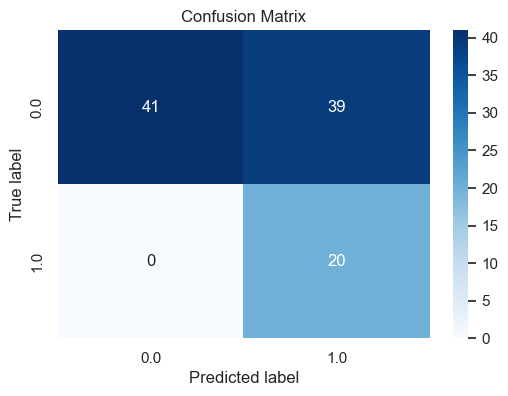

In [31]:
# [WriteCode]
y_pred = model_lstm_bin.predict(seq_array_test_last)
y_pred_binary = (y_pred > 0.5).astype(int)

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
accuracy = accuracy_score(label_array_test_last, y_pred_binary)
precision = precision_score(label_array_test_last, y_pred_binary)
recall = recall_score(label_array_test_last, y_pred_binary)
f1 = f1_score(label_array_test_last, y_pred_binary)

print("Testing accuracy:", accuracy)
print("Testing precision:", precision)
print("Testing recall:", recall)
print("Testing F1 score:", f1)
confusion_mat = confusion_matrix(label_array_test_last, y_pred_binary)
print("Confusion matrix:\n", confusion_mat)
df_cm = pd.DataFrame(confusion_mat, index=[i for i in np.unique(label_array_test_last)], columns=[i for i in np.unique(label_array)])
plt.figure(figsize=(6, 4))
sns.heatmap(df_cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.show()

#### Hyperparameter Optimisation

This involves finding the best network architecture (no. and types of layers, no. of nodes per layer, activations) and values for the learning rate, optimizer, dropout rate etc., even batch size and no. of epochs, parameters of the LSTM model for binary classification. 

Since a systematic search is highly computationally expensive, you will only design and implement an improved LSTM model with the **same** network architecture (no. and types of layers, no. of nodes per layer, activations) as the baseline LSTM model, but you are free to set different values for the other parameters (you may vary the value(s) of one or more parameters).

In the cell below, enter the improved LSTM model (named "model_lstm_bin_alt").

- Fit the model. Use validation_split = 0.05
- Use callback: "**keras.callbacks.TensorBoard(log_dir=get_run_logdir("run_lstm_bin_alt") , histogram_freq=1, write_graph= True, update_freq='epoch')**" to store the model training to Tensorboard log file "run_lstm_bin_alt" for visualization.
- Evaluate and print training data accuracy, confusion matrix, precision and recall.
- Evaluate and print test data accuracy, confusion matrix, precision, recall and F1 score (use seq_array_test_last and label_array_test_last generated previously).

2024-11-11 15:32:17.712882: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-11-11 15:32:17.713559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-11-11 15:32:17.714235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Model: "sequential_48"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 25, 50)            15200     
                                                                 
 dropout_231 (Dropout)       (None, 25, 50)            0         
                                                                 
 lstm_7 (LSTM)               (None, 50)                20200     
                                                                 
 dropout_232 (Dropout)       (None, 50)                0         
                                                                 
 dense_138 (Dense)           (None, 1)                 51        
                                                                 
Total params: 35,451
Trainable params: 35,451
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100


2024-11-11 15:32:18.005789: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-11-11 15:32:18.006683: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-11-11 15:32:18.007580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

211/212 [============================>.] - ETA: 0s - loss: 0.1851 - accuracy: 0.9281

2024-11-11 15:32:26.077068: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-11-11 15:32:26.078091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-11-11 15:32:26.079970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

212/212 [==============================] - 9s 34ms/step - loss: 0.1851 - accuracy: 0.9280 - val_loss: 0.1305 - val_accuracy: 0.9379
Epoch 2/100
212/212 [==============================] - 5s 25ms/step - loss: 0.0972 - accuracy: 0.9607 - val_loss: 0.0594 - val_accuracy: 0.9712
Epoch 3/100
212/212 [==============================] - 5s 24ms/step - loss: 0.0854 - accuracy: 0.9639 - val_loss: 0.0474 - val_accuracy: 0.9847
Epoch 4/100
212/212 [==============================] - 6s 27ms/step - loss: 0.0761 - accuracy: 0.9671 - val_loss: 0.0402 - val_accuracy: 0.9784
Epoch 5/100
212/212 [==============================] - 5s 24ms/step - loss: 0.0665 - accuracy: 0.9707 - val_loss: 0.0491 - val_accuracy: 0.9775
Epoch 6/100
212/212 [==============================] - 5s 25ms/step - loss: 0.0628 - accuracy: 0.9736 - val_loss: 0.0354 - val_accuracy: 0.9892
Epoch 7/100
212/212 [==============================] - 6s 27ms/step - loss: 0.0657 - accuracy: 0.9720 - val_loss: 0.0680 - val_accuracy: 0.9703
Epoc

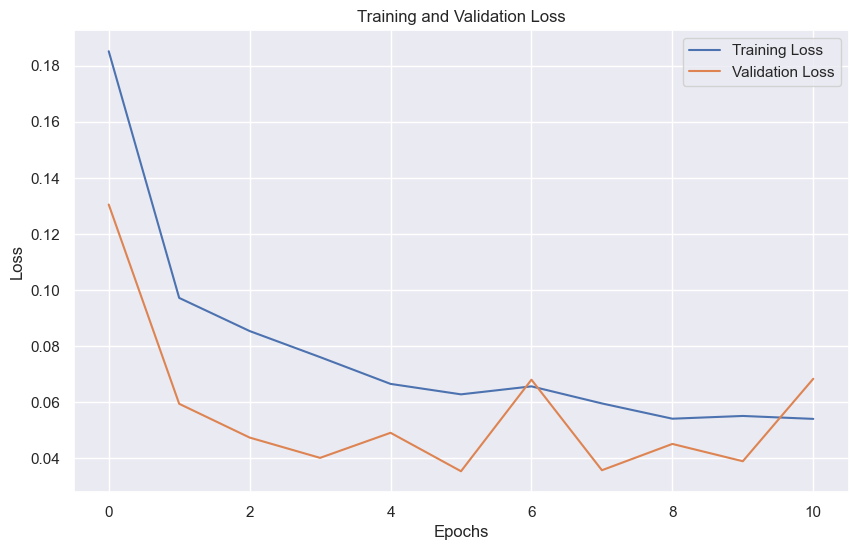

2024-11-11 15:33:26.280936: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-11-11 15:33:26.281948: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-11-11 15:33:26.282863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

695/695 [==============================] - 3s 4ms/step
Training accuracy: 0.9686768676867686
Training precision: 0.8294956140350878
Training recall: 0.9761290322580645
Training F1 score: 0.896858328393598
Training Confusion matrix:
 [[18498   622]
 [   74  3026]]


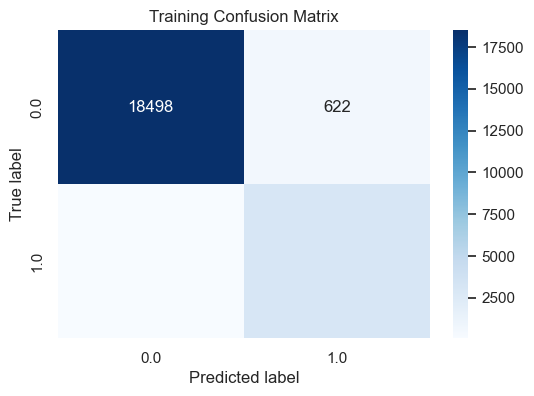

4/4 [==============================] - 0s 5ms/step
Testing accuracy: 0.99
Testing precision: 0.9523809523809523
Testing recall: 1.0
Testing F1 score: 0.975609756097561
Testing Confusion matrix:
 [[79  1]
 [ 0 20]]


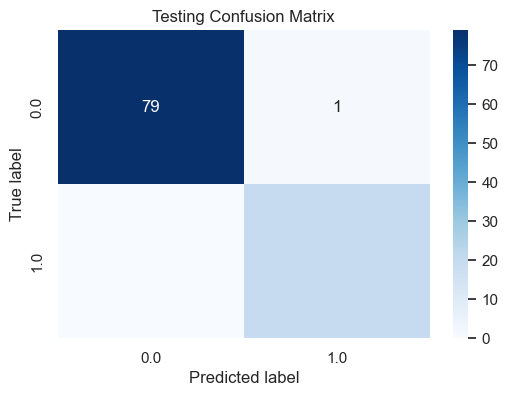

CPU times: user 1min 27s, sys: 12.1 s, total: 1min 39s
Wall time: 1min 12s


In [67]:
%%time
cb = keras.callbacks.TensorBoard(log_dir= get_run_logdir("run_lstm_bin_alt"), histogram_freq=1, write_graph= True, update_freq='epoch')

# [WriteCode]
model_lstm_bin_alt = Sequential()
model_lstm_bin_alt.add(LSTM(50, return_sequences=True, input_shape=(seq_array.shape[1], seq_array.shape[2])))
model_lstm_bin_alt.add(Dropout(0.25))
model_lstm_bin_alt.add(LSTM(50))
model_lstm_bin_alt.add(Dropout(0.25))
model_lstm_bin_alt.add(Dense(1, activation='sigmoid'))


model_lstm_bin_alt.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
model_lstm_bin_alt.summary()


early_stopping = EarlyStopping(monitor='val_loss',  
                   patience=5, 
                   verbose=True)
history = model_lstm_bin_alt.fit(seq_array, label_array, epochs=100, batch_size=ba, validation_split=0.05, callbacks=[early_stopping, cb])

# 绘制训练集和验证集的损失曲线
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

y_pred = model_lstm_bin_alt.predict(seq_array)
y_pred_binary = (y_pred > 0.5).astype(int)

accuracy = accuracy_score(label_array, y_pred_binary)
precision = precision_score(label_array, y_pred_binary)
recall = recall_score(label_array, y_pred_binary)
f1 = f1_score(label_array, y_pred_binary)


print("Training accuracy:", accuracy)
print("Training precision:", precision)
print("Training recall:", recall)
print("Training F1 score:", f1)
confusion_mat = confusion_matrix(label_array, y_pred_binary)
print("Training Confusion matrix:\n", confusion_mat)
df_cm = pd.DataFrame(confusion_mat, index=[i for i in np.unique(label_array)], columns=[i for i in np.unique(label_array)])
plt.figure(figsize=(6, 4))
sns.heatmap(df_cm, annot=True, fmt="d", cmap="Blues")
plt.title("Training Confusion Matrix")
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.show()

y_pred = model_lstm_bin_alt.predict(seq_array_test_last)
y_pred_binary = (y_pred > 0.5).astype(int)

accuracy = accuracy_score(label_array_test_last, y_pred_binary)
precision = precision_score(label_array_test_last, y_pred_binary)
recall = recall_score(label_array_test_last, y_pred_binary)
f1 = f1_score(label_array_test_last, y_pred_binary)

print("Testing accuracy:", accuracy)
print("Testing precision:", precision)
print("Testing recall:", recall)
print("Testing F1 score:", f1)
confusion_mat = confusion_matrix(label_array_test_last, y_pred_binary)
print("Testing Confusion matrix:\n", confusion_mat)
df_cm = pd.DataFrame(confusion_mat, index=[i for i in np.unique(label_array_test_last)], columns=[i for i in np.unique(label_array)])
plt.figure(figsize=(6, 4))
sns.heatmap(df_cm, annot=True, fmt="d", cmap="Blues")
plt.title("Testing Confusion Matrix")
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.show()

### Comparing CNN 1D and LSTM models for binary classification

Using a Pandas dataframe, combine the results obtained for binary classification such as accuracy, precision, recall and F1 score for test data of the CNN, LSTM, alt-CNN and alt-LSTM models for binary classification.

Display this dataframe.

In [32]:
# [WriteCode]
# CNN_bin
y_pred_cnn_bin = model_cnn_bin.predict(seq_array_test_last)
y_pred_binary_cnn_bin = (y_pred_cnn_bin > 0.5).astype(int)

accuracy_cnn_bin = accuracy_score(label_array_test_last, y_pred_binary_cnn_bin)
precision_cnn_bin = precision_score(label_array_test_last, y_pred_binary_cnn_bin)
recall_cnn_bin = recall_score(label_array_test_last, y_pred_binary_cnn_bin)
f1_cnn_bin = f1_score(label_array_test_last, y_pred_binary_cnn_bin)

# LSTM_bin
y_pred_lstm_bin = model_lstm_bin.predict(seq_array_test_last)
y_pred_binary_lstm_bin = (y_pred_lstm_bin > 0.5).astype(int)

accuracy_lstm_bin = accuracy_score(label_array_test_last, y_pred_binary_lstm_bin)
precision_lstm_bin = precision_score(label_array_test_last, y_pred_binary_lstm_bin)
recall_lstm_bin = recall_score(label_array_test_last, y_pred_binary_lstm_bin)
f1_lstm_bin = f1_score(label_array_test_last, y_pred_binary_lstm_bin)

# CNN_bin_alt
y_pred_cnn_bin_alt = model_cnn_bin_alt.predict(seq_array_test_last)
y_pred_binary_cnn_bin_alt = (y_pred_cnn_bin_alt > 0.5).astype(int)

accuracy_cnn_bin_alt = accuracy_score(label_array_test_last, y_pred_binary_cnn_bin_alt)
precision_cnn_bin_alt = precision_score(label_array_test_last, y_pred_binary_cnn_bin_alt)
recall_cnn_bin_alt = recall_score(label_array_test_last, y_pred_binary_cnn_bin_alt)
f1_cnn_bin_alt = f1_score(label_array_test_last, y_pred_binary_cnn_bin_alt)
# accuracy_cnn_bin_alt = 0
# precision_cnn_bin_alt = 0
# recall_cnn_bin_alt = 0
# f1_cnn_bin_alt = 0

# LSTM_bin_alt
y_pred_lstm_bin_alt = model_lstm_bin_alt.predict(seq_array_test_last)
y_pred_binary_lstm_bin_alt = (y_pred_lstm_bin_alt > 0.5).astype(int)

accuracy_lstm_bin_alt = accuracy_score(label_array_test_last, y_pred_binary_lstm_bin_alt)
precision_lstm_bin_alt = precision_score(label_array_test_last, y_pred_binary_lstm_bin_alt)
recall_lstm_bin_alt = recall_score(label_array_test_last, y_pred_binary_lstm_bin_alt)
f1_lstm_bin_alt = f1_score(label_array_test_last, y_pred_binary_lstm_bin_alt)


data = {'Model': ['CNN', 'LSTM', 'CNN-alt', 'LSTM-alt'],
        'accuracy': [accuracy_cnn_bin, accuracy_lstm_bin, accuracy_cnn_bin_alt, accuracy_lstm_bin_alt],
        'precision': [precision_cnn_bin, precision_lstm_bin, precision_cnn_bin_alt, precision_lstm_bin_alt],
        'recall': [recall_cnn_bin, recall_lstm_bin, recall_cnn_bin_alt, recall_lstm_bin_alt],
        'f1': [f1_cnn_bin, f1_lstm_bin, f1_cnn_bin_alt, f1_lstm_bin_alt]}
df = pd.DataFrame(data)
print(df)

NameError: name 'model_lstm_bin_alt' is not defined

## RUL Regression

### Label array generation


In [33]:
# function to generate labels
def gen_labels(id_df, seq_length, label):
    data_array = id_df[label].values
    num_elements = data_array.shape[0]
    return data_array[seq_length:num_elements, :]

# generate labels (generated from "RUL" col as it's RUL regression)
label_gen = [gen_labels(train_df[train_df['id']==id], sequence_length, ['RUL']) 
             for id in train_df['id'].unique()]
label_array = np.concatenate(label_gen).astype(np.float32)

# final label_array which is Y target output to CNN/LSTM
print(label_array.shape)

(22220, 1)


### CNN Model

In this section, build a 1D CNN network to do RUL regression. Use the **same** CNN network architecture (no. and types of layers, no. of nodes per layer, activations) as the binary classification case. Please include the following:
- name the model as "model_cnn_rul"
- use the **same** parameter values as the baseline CNN network for binary classification
- output dense layer with appropriate no. of nodes and activation for RUL regression
- appropriate loss function and optimizer.

Set mean absolute error MAE as the metric.

Print the model summary.

In [38]:
# [WriteCode]
# Define the 1D CNN model for RUL regression
def model_cnn_rul_def(learning_rate=0.001, dropout_rate=0.5):
    model_cnn_rul = Sequential()

    # Add Conv1D layers with Dropout (same as the binary classification model)
    model_cnn_rul.add(Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(sequence_length, len(sequence_cols))))
    model_cnn_rul.add(MaxPooling1D(pool_size=2))
    model_cnn_rul.add(Dropout(0.3))

    model_cnn_rul.add(Conv1D(filters=64, kernel_size=3, activation='relu'))
    model_cnn_rul.add(MaxPooling1D(pool_size=2))
    model_cnn_rul.add(Dropout(0.3))

    model_cnn_rul.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
    model_cnn_rul.add(MaxPooling1D(pool_size=2))
    model_cnn_rul.add(Dropout(0.3))

    # Flatten and add dense layers (same as the binary classification model)
    model_cnn_rul.add(Flatten())
    model_cnn_rul.add(Dense(64, activation='relu'))
    model_cnn_rul.add(Dropout(0.3))
    model_cnn_rul.add(Dense(32, activation='relu'))
    model_cnn_rul.add(Dropout(0.3))

    # Output layer for regression
    model_cnn_rul.add(Dense(1, activation='linear'))

    # Compile the model
    model_cnn_rul.compile(loss='mse', optimizer=Adam(), metrics=['mae'])

    # Print the model summary
    model_cnn_rul.summary()
    return model_cnn_rul

model_cnn_rul=model_cnn_rul_def()

Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_72 (Conv1D)           (None, 23, 32)            2432      
_________________________________________________________________
max_pooling1d_72 (MaxPooling (None, 11, 32)            0         
_________________________________________________________________
dropout_122 (Dropout)        (None, 11, 32)            0         
_________________________________________________________________
conv1d_73 (Conv1D)           (None, 9, 64)             6208      
_________________________________________________________________
max_pooling1d_73 (MaxPooling (None, 4, 64)             0         
_________________________________________________________________
dropout_123 (Dropout)        (None, 4, 64)             0         
_________________________________________________________________
conv1d_74 (Conv1D)           (None, 2, 128)          

#### Model Training

Fit the model on **seq_array** and **label_array** with epochs and batch_size set according to the parameter values in the form on top. Use validation_split = 0.05

##### Use callback: "**keras.callbacks.TensorBoard(log_dir=get_run_logdir("run_cnn_rul") , histogram_freq=1, write_graph= True, update_freq='epoch')**" to store the model training to Tensorboard log file "run_cnn_rul" for visualization.

In [39]:
%%time
cb = keras.callbacks.TensorBoard(log_dir= get_run_logdir("run_cnn_rul"), histogram_freq=1, write_graph= True, update_freq='epoch')

# [WriteCode]
# # Fit the model
history_rul = model_cnn_rul.fit(seq_array,
                                 label_array,
                                 epochs=ep,
                                 batch_size=ba,
                                 validation_split=0.05,
                                 callbacks=[cb])

# Display the training history
print(history_rul.history.keys())

Epoch 1/5
212/212 [==============================] - 2s 8ms/step - loss: 10262.7305 - mae: 74.0591 - val_loss: 3635.2488 - val_mae: 40.7564
Epoch 2/5
212/212 [==============================] - 1s 6ms/step - loss: 4616.9863 - mae: 47.7764 - val_loss: 4289.4795 - val_mae: 44.9420
Epoch 3/5
212/212 [==============================] - 1s 6ms/step - loss: 4340.2017 - mae: 46.0396 - val_loss: 4231.5625 - val_mae: 44.1167
Epoch 4/5
212/212 [==============================] - 1s 6ms/step - loss: 4183.1089 - mae: 44.8096 - val_loss: 4529.1870 - val_mae: 45.1713
Epoch 5/5
212/212 [==============================] - 1s 7ms/step - loss: 3975.0874 - mae: 43.6171 - val_loss: 3925.7566 - val_mae: 42.1937
dict_keys(['loss', 'mae', 'val_loss', 'val_mae'])
CPU times: total: 8.92 s
Wall time: 7.77 s


#### Training data performance metrics

- Print the "mean absolute error" metric for training data prediction.

In [40]:
# [WriteCode]
from sklearn.metrics import mean_absolute_error

# Make predictions on the training data
train_predictions_rul = model_cnn_rul.predict(seq_array)

# Calculate mean absolute error for training data
mae_train = mean_absolute_error(label_array, train_predictions_rul)
print(f"Mean Absolute Error (Training Data): {mae_train:.4f}")

Mean Absolute Error (Training Data): 39.0863


#### Test data for prediction

To evaluate the performance on the test data, only the last cycles of data for each engine id in the test data is kept for testing purposes. In order to compare the results to the target, we pick the last sequence for each engine id in the test data (excluding engine ids whose last cycle is shorter than "sequence length" size).

In [41]:
seq_array_test_last = [test_df[test_df['id']==id][sequence_cols].values[-sequence_length:] 
                       for id in test_df['id'].unique() if len(test_df[test_df['id']==id]) >= sequence_length]

seq_array_test_last = np.asarray(seq_array_test_last).astype(np.float32)

# Last cycle test data - seq_array for test data
print(seq_array_test_last.shape)

y_mask = [len(test_df[test_df['id']==id]) >= sequence_length for id in test_df['id'].unique()]
label_array_test_last = test_df.groupby('id')['RUL'].nth(-1)[y_mask].values
label_array_test_last = label_array_test_last.reshape(label_array_test_last.shape[0],1).astype(np.float32)

# Last cycle test data - label_array for test data
print(label_array_test_last.shape)

(100, 25, 25)
(100, 1)


#### Test data performance metrics
- print the "mean absolute error" metric for test data prediction

*Note*: use seq_array_test_last and label_array_test_last generated in the cell above as X and Y arrays (in place of seq_array and label_array) for performing prediction and calculating metrics

Mean Absolute Error on Test Data: 24.2593


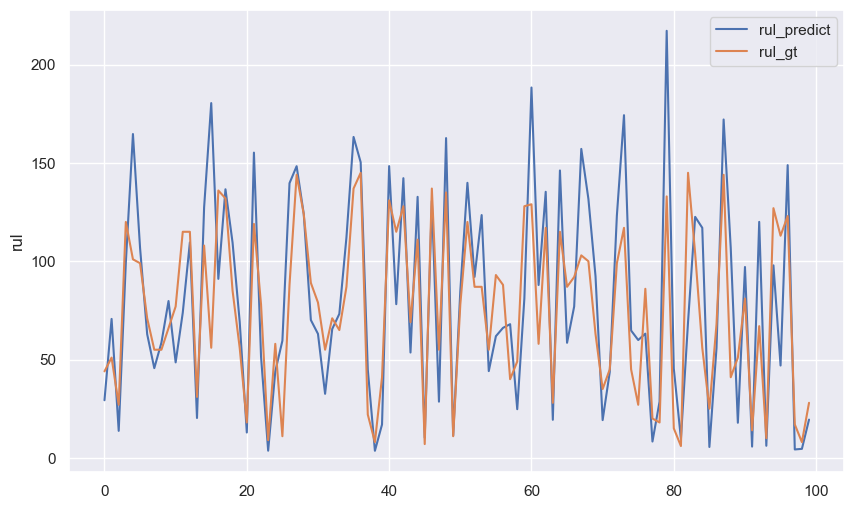

In [42]:
# [WriteCode]
# Make predictions on the test data
test_predictions = model_cnn_rul.predict(seq_array_test_last)

# Calculate mean absolute error (MAE) on the test data
mae_test = np.mean(np.abs(test_predictions - label_array_test_last))

# Print the MAE
print(f"Mean Absolute Error on Test Data: {mae_test:.4f}")
rul = model_cnn_rul.predict(seq_array_test_last)
plt.figure(figsize=(10, 6))
plt.plot(rul, label='rul_predict')
plt.plot(label_array_test_last, label='rul_gt')
plt.ylabel('rul')
plt.legend()
plt.show()

#### Hyperparameter Optimisation

This involves finding the best network architecture (no. of layers, no. of nodes per layer, activations) and values for the learning rate, optimizer, dropout rate etc., even batch size and no. of epochs, parameters of the CNN model for RUL regression.

Since a systematic search is highly computationally expensive, you will only design and implement an improved CNN model with the **same** network architecture (no. and types of layers, no. of nodes per layer, activations) as the baseline CNN model, but you are free to set different values for the other parameters (you may vary the value(s) of one or more parameters).

In the cell below, enter the improved CNN model for RUL regression (named "model_cnn_rul_alt").

- Fit the model. Use validation_split = 0.05
- Use callback: "**keras.callbacks.TensorBoard(log_dir=get_run_logdir("run_cnn_rul_alt") , histogram_freq=1, write_graph= True, update_freq='epoch')**" to store the model training to Tensorboard log file "run_cnn_rul_alt" for visualization.
- Evaluate and print training data MAE.
- Evaluate and print test data MAE (use seq_array_test_last and label_array_test_last generated previously).

[I 2024-11-11 17:25:12,709] A new study created in memory with name: no-name-ff8d6620-bb80-4236-99fb-4be50f128ed3


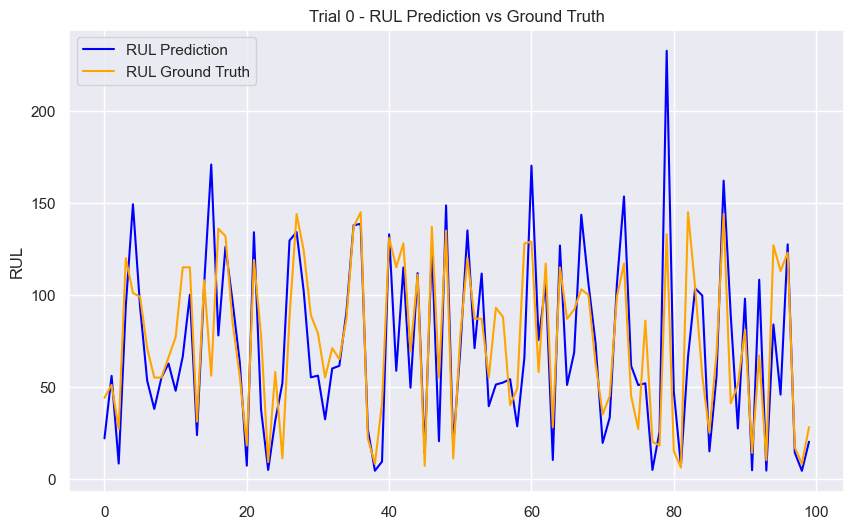

[I 2024-11-11 17:25:18,832] Trial 0 finished with value: 50.71473693847656 and parameters: {'learning_rate': 0.0008749354387711111, 'dropout_rate': 0.6573970283097142, 'batch_size': 128}. Best is trial 0 with value: 50.71473693847656.


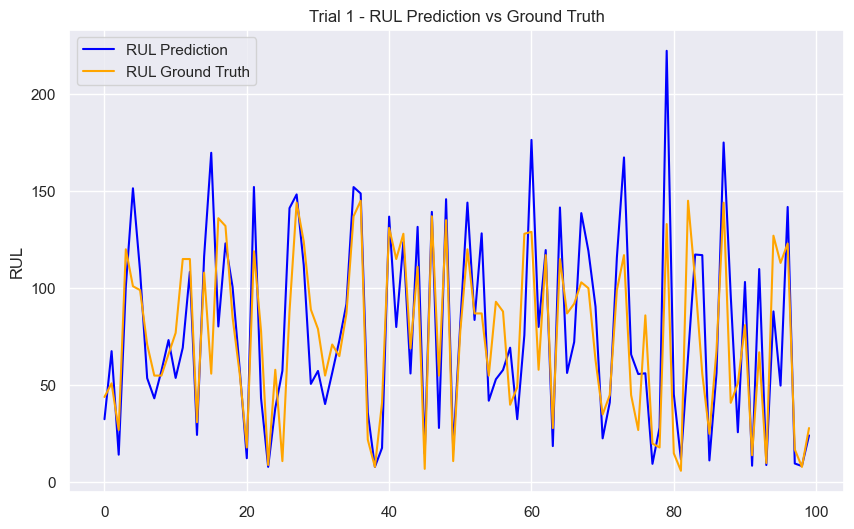

[I 2024-11-11 17:25:25,598] Trial 1 finished with value: 47.91136169433594 and parameters: {'learning_rate': 0.00039914772146702656, 'dropout_rate': 0.49061327933574883, 'batch_size': 100}. Best is trial 1 with value: 47.91136169433594.


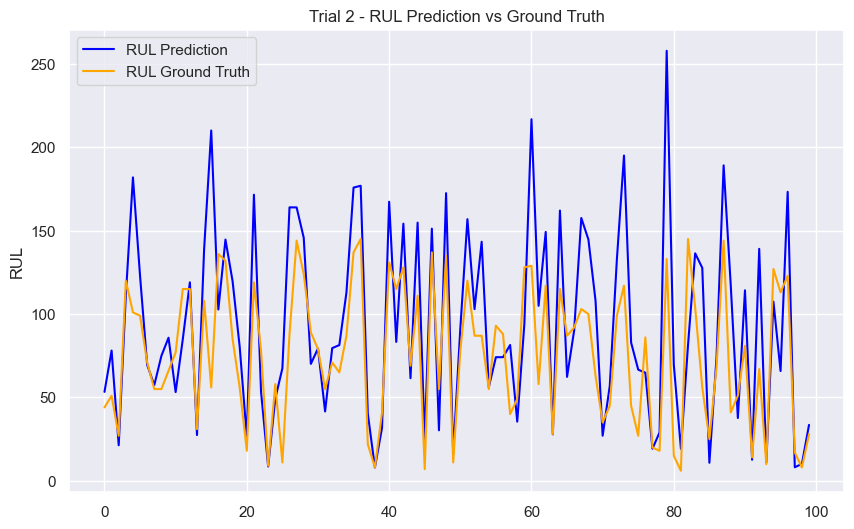

[I 2024-11-11 17:25:32,394] Trial 2 finished with value: 37.038692474365234 and parameters: {'learning_rate': 0.005078792645853916, 'dropout_rate': 0.47299704166750267, 'batch_size': 100}. Best is trial 2 with value: 37.038692474365234.


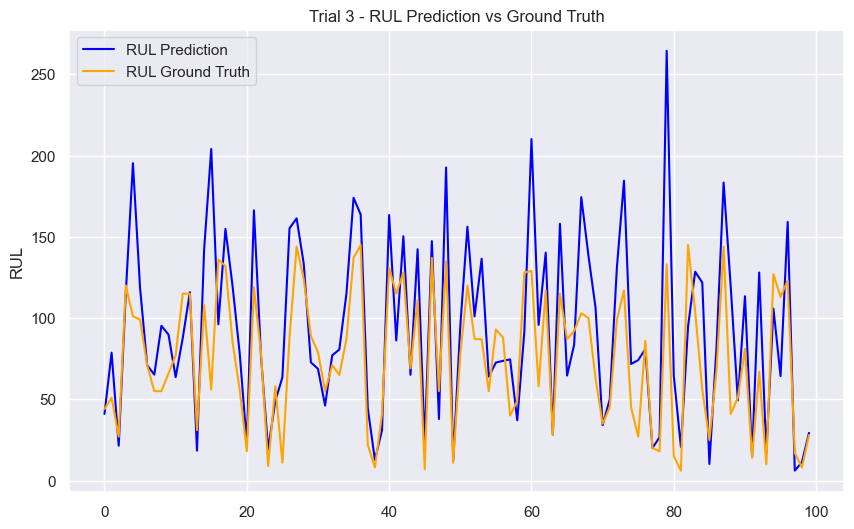

[I 2024-11-11 17:25:39,434] Trial 3 finished with value: 35.78953552246094 and parameters: {'learning_rate': 0.0003553422424278391, 'dropout_rate': 0.42090645747520167, 'batch_size': 100}. Best is trial 3 with value: 35.78953552246094.


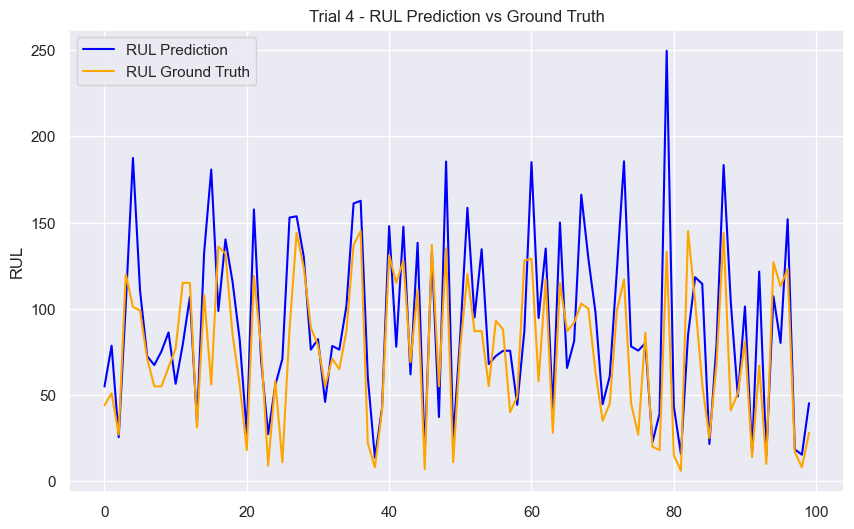

[I 2024-11-11 17:26:16,876] Trial 4 finished with value: 37.2920036315918 and parameters: {'learning_rate': 0.00033807892076866207, 'dropout_rate': 0.5825442604258793, 'batch_size': 16}. Best is trial 3 with value: 35.78953552246094.


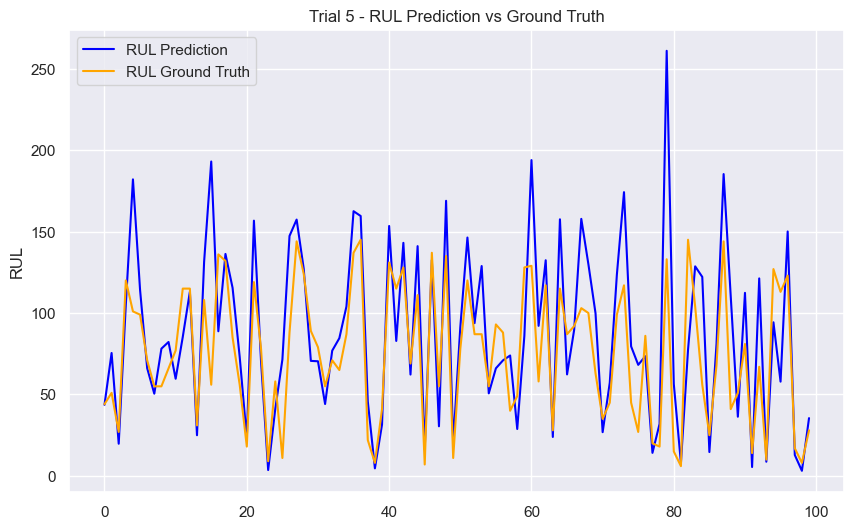

[I 2024-11-11 17:26:22,728] Trial 5 finished with value: 40.37612533569336 and parameters: {'learning_rate': 0.00041394231848654756, 'dropout_rate': 0.616413337055458, 'batch_size': 128}. Best is trial 3 with value: 35.78953552246094.


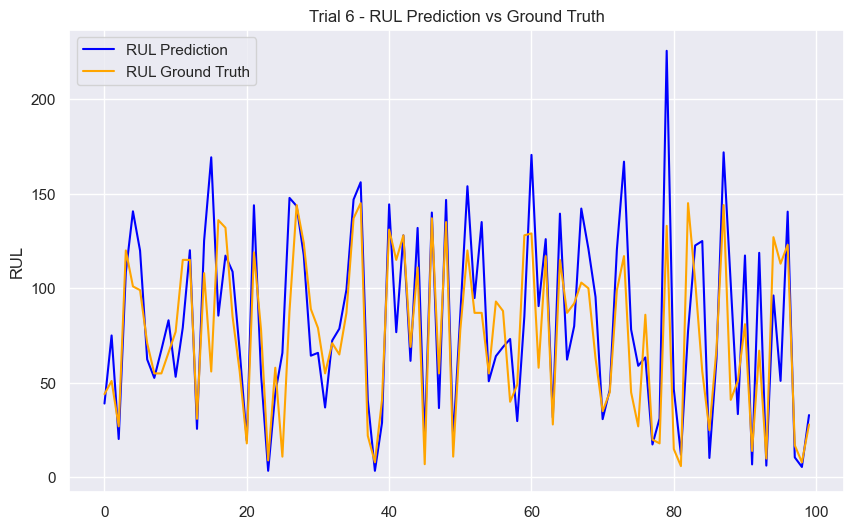

[I 2024-11-11 17:26:28,558] Trial 6 finished with value: 44.213653564453125 and parameters: {'learning_rate': 0.001119686536174232, 'dropout_rate': 0.46108383048017676, 'batch_size': 128}. Best is trial 3 with value: 35.78953552246094.


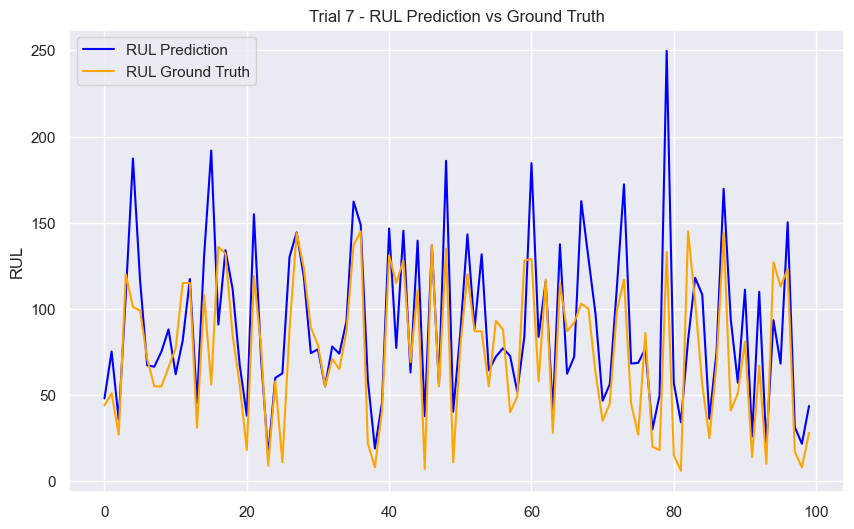

[I 2024-11-11 17:27:07,190] Trial 7 finished with value: 43.53828430175781 and parameters: {'learning_rate': 0.0007858953751844276, 'dropout_rate': 0.498586263432096, 'batch_size': 16}. Best is trial 3 with value: 35.78953552246094.


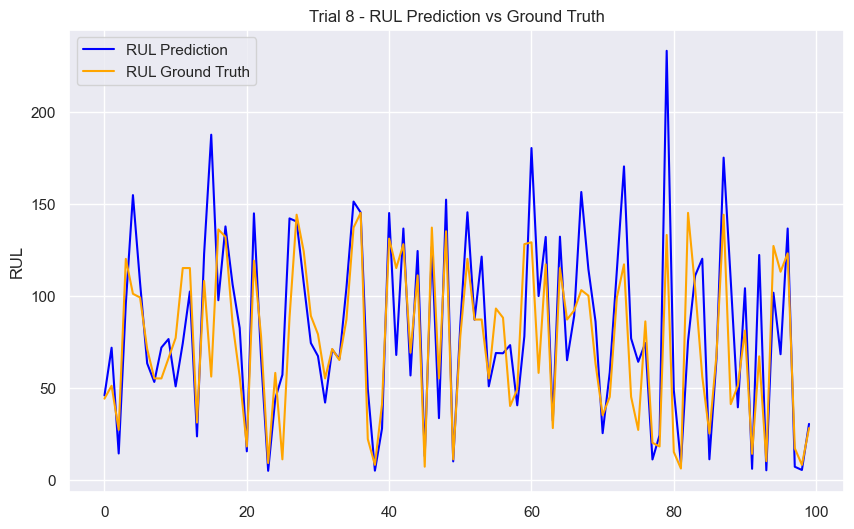

[I 2024-11-11 17:27:17,475] Trial 8 finished with value: 40.768367767333984 and parameters: {'learning_rate': 0.0016998141235976898, 'dropout_rate': 0.30992623146287157, 'batch_size': 64}. Best is trial 3 with value: 35.78953552246094.


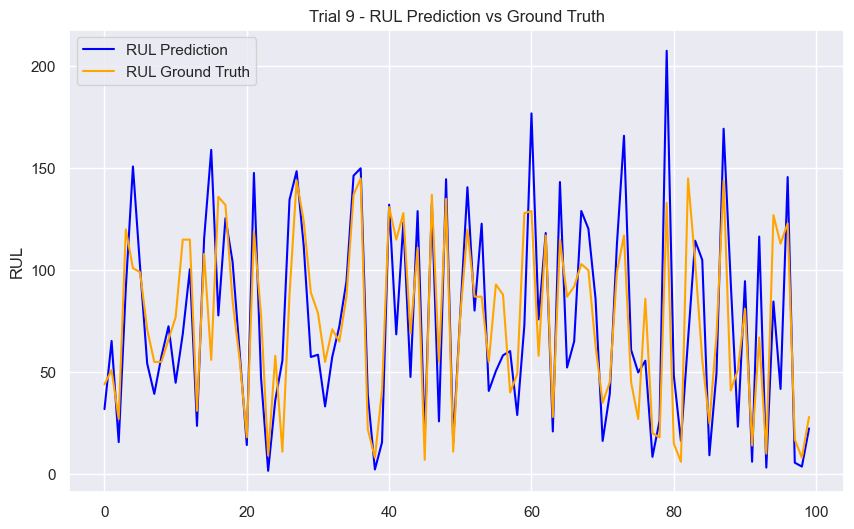

[I 2024-11-11 17:27:23,380] Trial 9 finished with value: 48.16565704345703 and parameters: {'learning_rate': 0.00956450652435136, 'dropout_rate': 0.5258411408449568, 'batch_size': 128}. Best is trial 3 with value: 35.78953552246094.


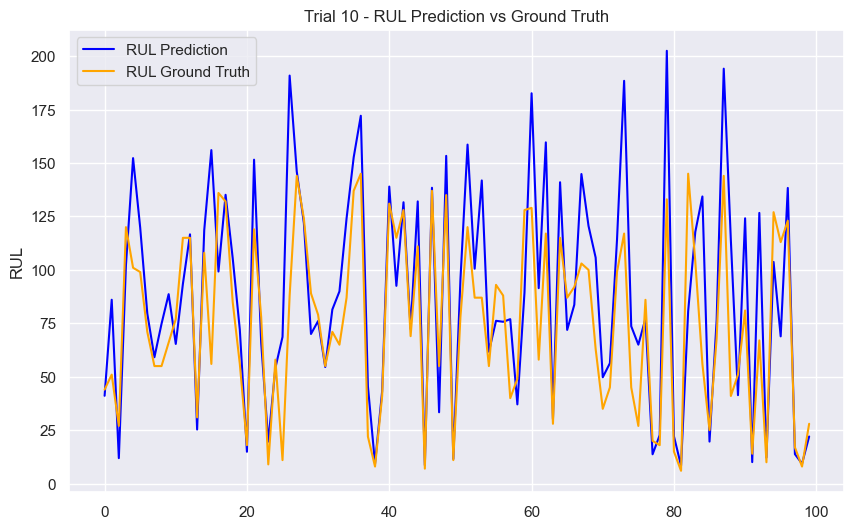

[I 2024-11-11 17:27:42,539] Trial 10 finished with value: 39.87034606933594 and parameters: {'learning_rate': 0.00010479781718797955, 'dropout_rate': 0.3830786028781317, 'batch_size': 32}. Best is trial 3 with value: 35.78953552246094.


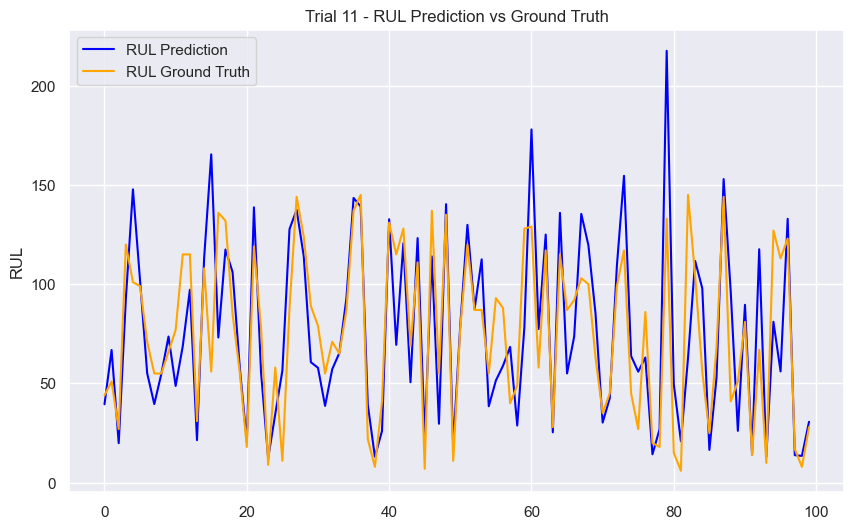

[I 2024-11-11 17:27:49,946] Trial 11 finished with value: 48.60286331176758 and parameters: {'learning_rate': 0.005846110258329182, 'dropout_rate': 0.409109982305407, 'batch_size': 100}. Best is trial 3 with value: 35.78953552246094.


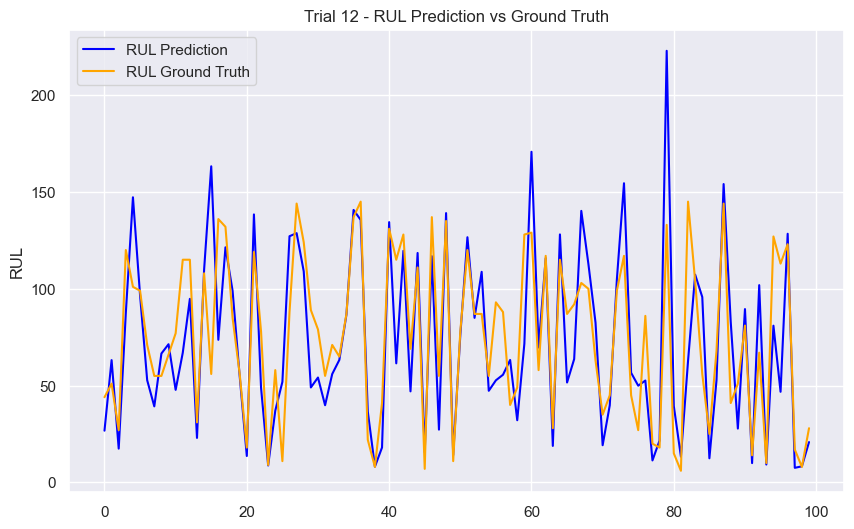

[I 2024-11-11 17:27:56,966] Trial 12 finished with value: 51.70353698730469 and parameters: {'learning_rate': 0.003408170518148845, 'dropout_rate': 0.365910338396627, 'batch_size': 100}. Best is trial 3 with value: 35.78953552246094.


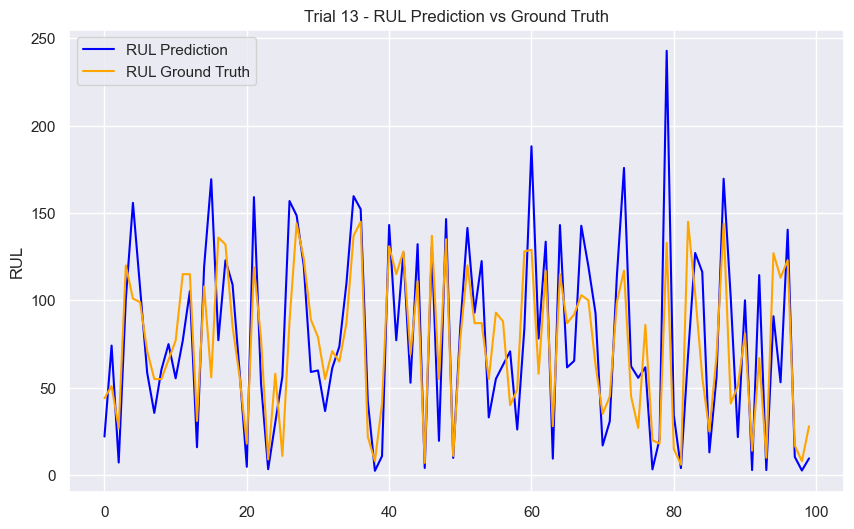

[I 2024-11-11 17:28:03,988] Trial 13 finished with value: 45.91292953491211 and parameters: {'learning_rate': 0.0001483105409572872, 'dropout_rate': 0.43167850308887534, 'batch_size': 100}. Best is trial 3 with value: 35.78953552246094.


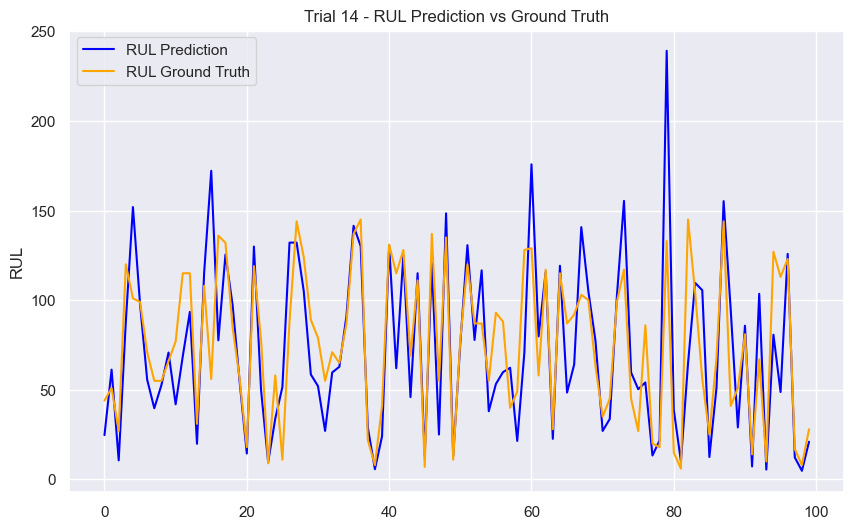

[I 2024-11-11 17:28:11,051] Trial 14 finished with value: 49.073463439941406 and parameters: {'learning_rate': 0.0024510380447380045, 'dropout_rate': 0.5463492615837633, 'batch_size': 100}. Best is trial 3 with value: 35.78953552246094.


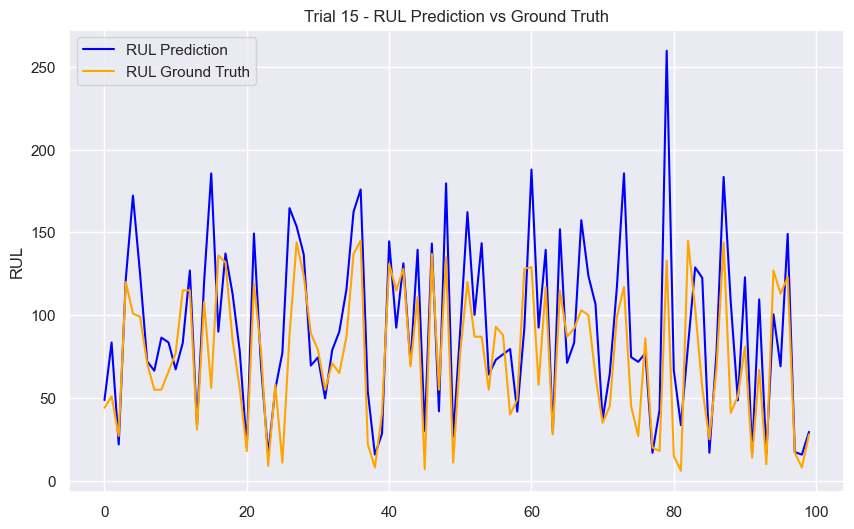

[I 2024-11-11 17:28:30,560] Trial 15 finished with value: 42.229305267333984 and parameters: {'learning_rate': 0.00020014038337701147, 'dropout_rate': 0.3445031126108751, 'batch_size': 32}. Best is trial 3 with value: 35.78953552246094.


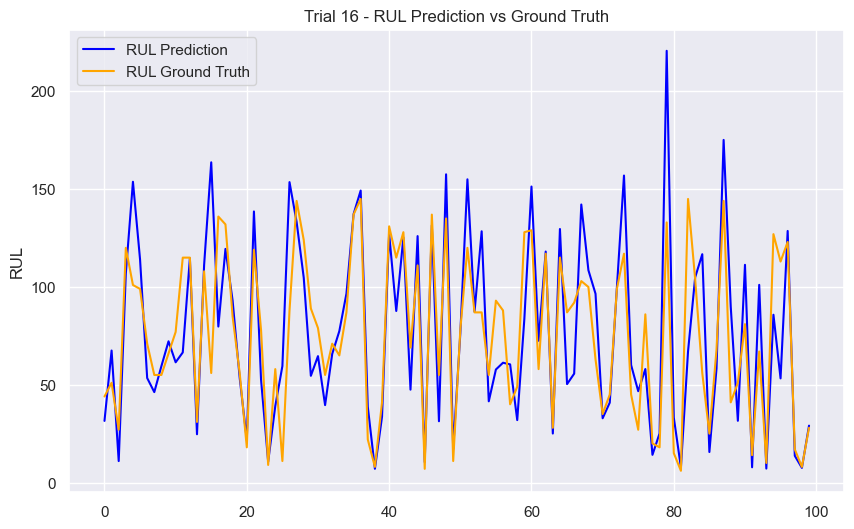

[I 2024-11-11 17:28:40,877] Trial 16 finished with value: 48.09996795654297 and parameters: {'learning_rate': 0.0039858304046910065, 'dropout_rate': 0.43599329143516075, 'batch_size': 64}. Best is trial 3 with value: 35.78953552246094.


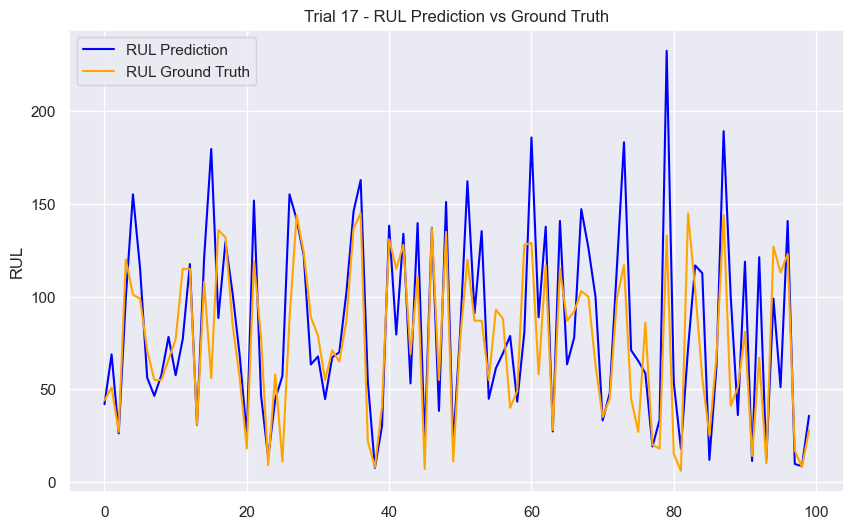

[I 2024-11-11 17:28:47,876] Trial 17 finished with value: 43.195892333984375 and parameters: {'learning_rate': 0.009953742526759216, 'dropout_rate': 0.6961623004901716, 'batch_size': 100}. Best is trial 3 with value: 35.78953552246094.


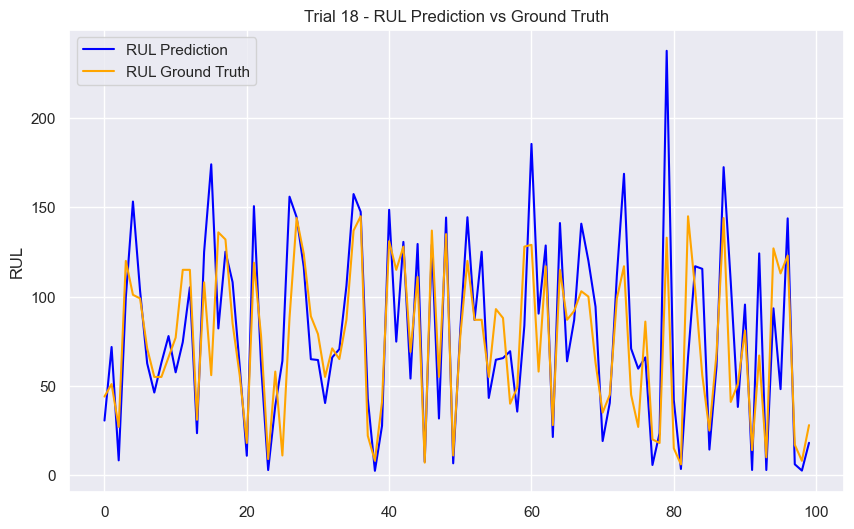

[I 2024-11-11 17:28:55,036] Trial 18 finished with value: 43.786930084228516 and parameters: {'learning_rate': 0.000601703069699212, 'dropout_rate': 0.46653913236697186, 'batch_size': 100}. Best is trial 3 with value: 35.78953552246094.


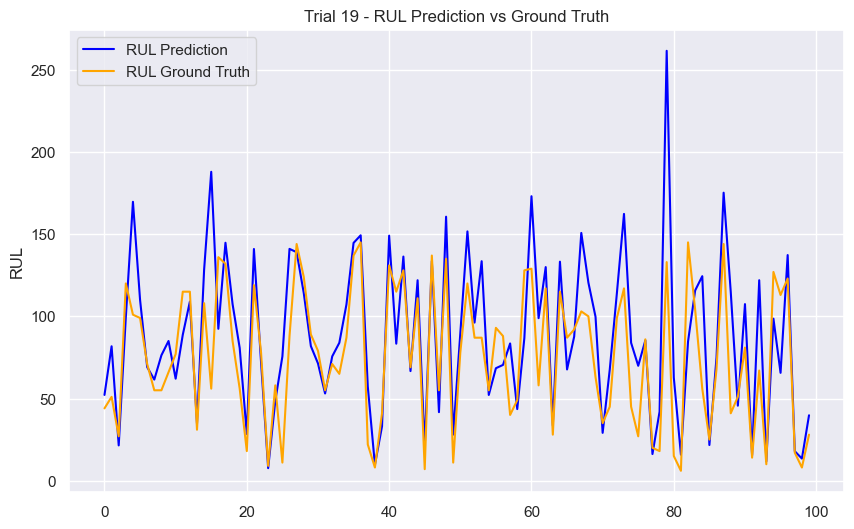

[I 2024-11-11 17:29:02,019] Trial 19 finished with value: 42.47976303100586 and parameters: {'learning_rate': 0.0016502732367766673, 'dropout_rate': 0.5537837455623074, 'batch_size': 100}. Best is trial 3 with value: 35.78953552246094.


Best trial: {'learning_rate': 0.0003553422424278391, 'dropout_rate': 0.42090645747520167, 'batch_size': 100}
Epoch 1/5
212/212 [==============================] - 2s 8ms/step - loss: 8409.9355 - mae: 65.2904 - val_loss: 4884.4966 - val_mae: 48.9542
Epoch 2/5
212/212 [==============================] - 1s 7ms/step - loss: 4366.0664 - mae: 46.0575 - val_loss: 4414.5762 - val_mae: 45.0541
Epoch 3/5
212/212 [==============================] - 1s 7ms/step - loss: 4141.6807 - mae: 44.6243 - val_loss: 3996.8870 - val_mae: 42.6740
Epoch 4/5
212/212 [==============================] - 1s 7ms/step - loss: 3939.8101 - mae: 43.3405 - val_loss: 5340.1055 - val_mae: 50.7206
Epoch 5/5
212/212 [==============================] - 1s 7ms/step - loss: 3843.0679 - mae: 42.7591 - val_loss: 4192.0361 - val_mae: 42.2455
Mean Absolute Error on Training Data (Alt Model): 37.3471
Mean Absolute Error on Test Data (Alt Model): 25.8719


In [46]:
# Define the objective function for Optuna
def model_cnn_rul_def(learning_rate=0.001, dropout_rate=0.5):
    model_cnn_rul = Sequential()

    # Add Conv1D layers with Dropout (same as the binary classification model)
    model_cnn_rul.add(Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(sequence_length, len(sequence_cols))))
    model_cnn_rul.add(MaxPooling1D(pool_size=2))
    model_cnn_rul.add(Dropout(0.3))

    model_cnn_rul.add(Conv1D(filters=64, kernel_size=3, activation='relu'))
    model_cnn_rul.add(MaxPooling1D(pool_size=2))
    model_cnn_rul.add(Dropout(0.3))

    model_cnn_rul.add(Conv1D(filters=128, kernel_size=3, activation='relu'))
    model_cnn_rul.add(MaxPooling1D(pool_size=2))
    model_cnn_rul.add(Dropout(0.3))

    # Flatten and add dense layers (same as the binary classification model)
    model_cnn_rul.add(Flatten())
    model_cnn_rul.add(Dense(64, activation='relu'))
    model_cnn_rul.add(Dropout(0.3))
    model_cnn_rul.add(Dense(32, activation='relu'))
    model_cnn_rul.add(Dropout(0.3))

    # Output layer for regression
    model_cnn_rul.add(Dense(1, activation='linear'))

    # Compile the model
    model_cnn_rul.compile(loss='mse', optimizer=Adam(), metrics=['mae'])

    # Print the model summary
    return model_cnn_rul
def objective(trial):
    # Suggest hyperparameters
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-2, log=True)
    dropout_rate = trial.suggest_float('dropout_rate', 0.3, 0.7)
    batch_size = trial.suggest_categorical('batch_size', [ba, 16, 32, 64, 128])

    # Create the model with suggested hyperparameters
    model = model_cnn_rul_def(learning_rate=learning_rate, dropout_rate=dropout_rate)
    
    # Set up TensorBoard callback
    cb = keras.callbacks.TensorBoard(log_dir=get_run_logdir("run_cnn_rul_alt"), histogram_freq=1, write_graph=True, update_freq='epoch')
    
    # Train the model
    history = model.fit(
        seq_array, 
        label_array, 
        epochs=ep, 
        batch_size=batch_size, 
        validation_split=0.05, 
        callbacks=[cb], 
        verbose=0
    )

    # Evaluate MAE on validation data
    val_mae = history.history['val_mae'][-1]

    # Make predictions on the test data
    test_predictions = model.predict(seq_array_test_last)

    # Plot predictions vs ground truth for this trial
    plt.figure(figsize=(10, 6))
    plt.plot(test_predictions, label='RUL Prediction', color='blue')
    plt.plot(label_array_test_last, label='RUL Ground Truth', color='orange')
    plt.ylabel('RUL')
    plt.title(f"Trial {trial.number} - RUL Prediction vs Ground Truth")
    plt.legend()
    plt.show()

    return val_mae

# Run hyperparameter optimization
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=20)

# Display the best parameters
print("Best trial:", study.best_trial.params)

# Define the improved model using the best hyperparameters
best_params = study.best_trial.params
model_cnn_rul_alt = model_cnn_rul_def(learning_rate=best_params['learning_rate'], dropout_rate=best_params['dropout_rate'])

# Fit the improved model with the best batch size
history_alt = model_cnn_rul_alt.fit(
    seq_array,
    label_array,
    epochs=ep,
    batch_size=best_params['batch_size'],
    validation_split=0.05,
    callbacks=[keras.callbacks.TensorBoard(log_dir=get_run_logdir("run_cnn_rul_alt"), histogram_freq=1, write_graph=True, update_freq='epoch')]
)

# Evaluate on training data
train_predictions_alt = model_cnn_rul_alt.predict(seq_array)
mae_train_alt = mean_absolute_error(label_array, train_predictions_alt)
print(f"Mean Absolute Error on Training Data (Alt Model): {mae_train_alt:.4f}")

# Evaluate on test data
test_predictions_alt = model_cnn_rul_alt.predict(seq_array_test_last)
mae_test_alt = mean_absolute_error(label_array_test_last, test_predictions_alt)
print(f"Mean Absolute Error on Test Data (Alt Model): {mae_test_alt:.4f}")

### LSTM Network

In this section, build a LSTM network to do RUL regression. Use the **same** LSTM network architecture (no. and types of layers, no. of nodes per layer, activations) as the binary classification case. Please include the following:
- name the model as "model_lstm_rul"
- use the **same** parameter values as the baseline LSTM network for binary classification
- output dense layer with appropriate no. of nodes and activation for RUL regression
- appropriate loss function and optimizer.

Set mean absolute error MAE as the metric.

Print the model summary.

In [79]:
# [WriteCode]
model_lstm_rul = Sequential()
model_lstm_rul.add(LSTM(50, return_sequences=True, activation='relu', input_shape=(seq_array.shape[1], seq_array.shape[2])))
model_lstm_rul.add(Dropout(0.2))
model_lstm_rul.add(LSTM(50, return_sequences=False, activation='relu'))
model_lstm_rul.add(Dropout(0.2))
model_lstm_rul.add(Dense(1))
'''model_lstm_rul = Sequential()
model_lstm_rul.add(LSTM(128, return_sequences=True, input_shape=(seq_array.shape[1], seq_array.shape[2]), activation='tanh'))
model_lstm_rul.add(Dropout(0.2))
model_lstm_rul.add(LSTM(64, return_sequences=True, activation='tanh'))
model_lstm_rul.add(Dropout(0.2))
model_lstm_rul.add(LSTM(32, activation='tanh'))
model_lstm_rul.add(Dropout(0.2))
model_lstm_rul.add(Dense(96, activation='relu'))
model_lstm_rul.add(Dropout(0.2))
model_lstm_rul.add(Dense(16, activation='relu'))
model_lstm_rul.add(Dropout(0.2))
model_lstm_rul.add(Dense(1))'''

'''def build_model(hp):
    model = Sequential()
    model.add(LSTM(units = hp.Choice('layer1_units', [10,20,30,40,50,60,70,80,90,100]), return_sequences=True, input_shape=(seq_array.shape[1], seq_array.shape[2])))
    
    for i in range(hp.Int('num_layers', 2, 15)):                        
        model.add(LSTM(units =  hp.Int('units' + str(i), min_value=10, max_value=150, step=10), return_sequences=True))
    
    model.add(LSTM(units = hp.Choice('last_lstm_units', [50, 100, 150])))
    model.add(Dropout(rate = hp.Choice('rate', [0.3, 0.4, 0.5, 0.6, 0.7])))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error',optimizer='adam', metrics=['mae'])
    return model


tuner = RandomSearch(
    build_model,
    objective='val_loss',
    max_trials= 5,
    executions_per_trial=3,
    directory='project', project_name = 'Stacked_LSTM_Stock_Prediction')

tuner.search_space_summary()

tuner.search(seq_array, label_array,
             epochs= 5,
             validation_split=0.05)

model_lstm_rul = tuner.get_best_models(num_models=1)[0]'''


model_lstm_rul.compile(optimizer=Adam(), loss='mean_squared_error', metrics=['mae'])
print(tf.test.is_gpu_available())
model_lstm_rul.summary()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


False
Model: "sequential_52"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 25, 50)            15200     
                                                                 
 dropout_248 (Dropout)       (None, 25, 50)            0         
                                                                 
 lstm_9 (LSTM)               (None, 50)                20200     
                                                                 
 dropout_249 (Dropout)       (None, 50)                0         
                                                                 
 dense_148 (Dense)           (None, 1)                 51        
                                                                 
Total params: 35,451
Trainable params: 35,451
Non-trainable params: 0
_________________________________________________________________


#### Model Training

Fit the model on **seq_array** and **label_array** with epochs and batch_size set according to the parameter values in the form on top. Use validation_split = 0.05

##### Use callback: "**keras.callbacks.TensorBoard(log_dir=get_run_logdir("run_lstm_rul") , histogram_freq=1, write_graph= True, update_freq='epoch')**" to store the model training to Tensorboard log file "run_lstm_rul" for visualization.

Epoch 1/5
212/212 [==============================] - 7s 25ms/step - loss: 9022.6299 - mae: 66.8932 - val_loss: 3164.1875 - val_mae: 39.9046
Epoch 2/5
212/212 [==============================] - 6s 27ms/step - loss: 4316.6104 - mae: 46.4176 - val_loss: 3242.5525 - val_mae: 37.5459
Epoch 3/5
212/212 [==============================] - 5s 24ms/step - loss: 3799.6267 - mae: 43.0070 - val_loss: 4534.7026 - val_mae: 43.2083
Epoch 4/5
212/212 [==============================] - 5s 23ms/step - loss: 4036.2234 - mae: 44.4262 - val_loss: 3849.5063 - val_mae: 42.4717
Epoch 5/5
212/212 [==============================] - 5s 23ms/step - loss: 4242.7900 - mae: 46.1394 - val_loss: 6410.4468 - val_mae: 57.3807


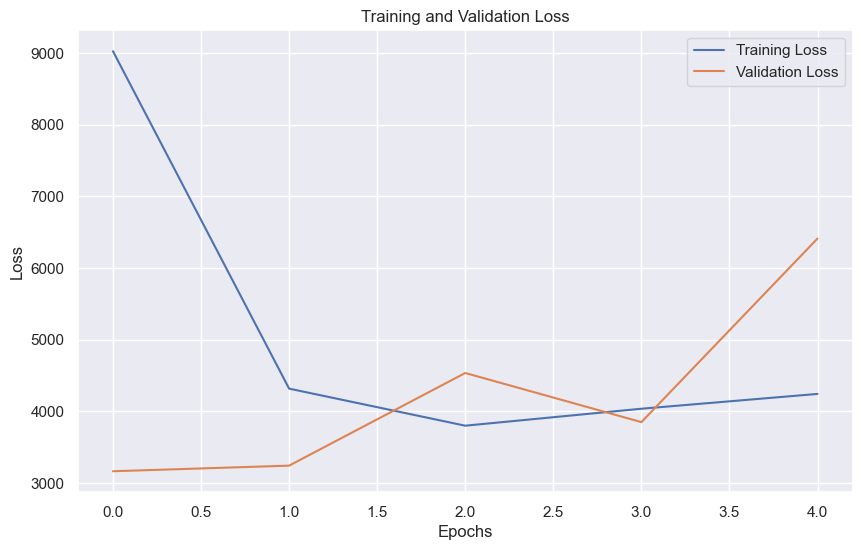

CPU times: user 34.9 s, sys: 4.38 s, total: 39.2 s
Wall time: 28.1 s


In [80]:
%%time
cb = keras.callbacks.TensorBoard(log_dir= get_run_logdir("run_lstm_rul"), histogram_freq=1, write_graph= True, update_freq='epoch')

# [WriteCode]
early_stopping = EarlyStopping(monitor='val_loss',  
                   patience=5, 
                   verbose=True)                  
history = model_lstm_rul.fit(seq_array, label_array, epochs=ep, batch_size=ba, validation_split=0.05, callbacks=[early_stopping, cb])
# 绘制训练集和验证集的损失曲线
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

#### Training data performance metrics
- Print the "mean absolute error" metric for training data prediction.

In [81]:
# [WriteCode]
train_loss, train_mae = model_lstm_rul.evaluate(seq_array, label_array)
print(f"Training Loss: {train_loss}, Training MAE: {train_mae}")

695/695 [==============================] - 2s 3ms/step - loss: 4992.2964 - mae: 48.0089
Training Loss: 4992.29638671875, Training MAE: 48.00890350341797


#### Test data for prediction

To evaluate the performance on the test data, only the last cycles of data for each engine id in the test data is kept for testing purposes. In order to compare the results to the target, we pick the last sequence for each engine id in the test data (excluding engine ids whose last cycle is shorter than "sequence length" size).

In [82]:
seq_array_test_last = [test_df[test_df['id']==id][sequence_cols].values[-sequence_length:] 
                       for id in test_df['id'].unique() if len(test_df[test_df['id']==id]) >= sequence_length]

seq_array_test_last = np.asarray(seq_array_test_last).astype(np.float32)

# Last cycle test data - seq_array for test data
print(seq_array_test_last.shape)

y_mask = [len(test_df[test_df['id']==id]) >= sequence_length for id in test_df['id'].unique()]
label_array_test_last = test_df.groupby('id')['RUL'].nth(-1)[y_mask].values
label_array_test_last = label_array_test_last.reshape(label_array_test_last.shape[0],1).astype(np.float32)

# Last cycle test data - label_array for test data
print(label_array_test_last.shape)

(100, 25, 25)
(100, 1)


#### Test data performance metrics
- print the "mean absolute error" metric for test data prediction

*Note*: use seq_array_test_last and label_array_test_last generated in the cell above as X and Y arrays (in place of seq_array and label_array) for performing prediction and calculating metrics

4/4 [==============================] - 0s 4ms/step - loss: 991.3011 - mae: 23.3383
Test Loss: 991.3011474609375, Test MAE: 23.338289260864258
4/4 [==============================] - 0s 3ms/step


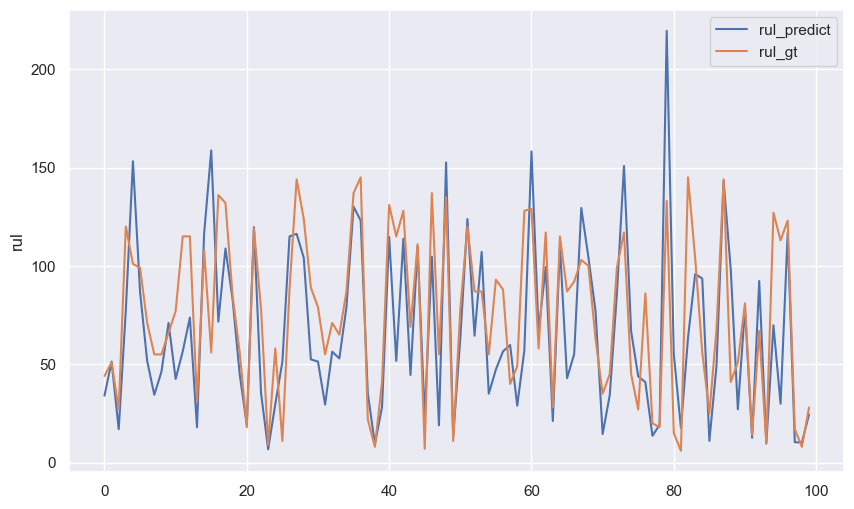

In [83]:
# [WriteCode]
test_loss, test_mae = model_lstm_rul.evaluate(seq_array_test_last, label_array_test_last)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")
rul = model_lstm_rul.predict(seq_array_test_last)
plt.figure(figsize=(10, 6))
plt.plot(rul, label='rul_predict')
plt.plot(label_array_test_last, label='rul_gt')
plt.ylabel('rul')
plt.legend()
plt.show()

#### Hyperparameter Optimisation

This involves finding the best network architecture (no. of layers, no. of nodes per layer, activations) and values for the learning rate, optimizer, dropout rate etc., even batch size and no. of epochs, parameters of the LSTM model for RUL regression.

Since a systematic search is highly computationally expensive, you will only design and implement an improved LSTM model with the **same** network architecture (no. and types of layers, no. of nodes per layer, activations) as the baseline LSTM model, but you are free to set different values for the other parameters (you may vary the value(s) of one or more parameters).

In the cell below, enter the improved LSTM model for RUL regression (named "model_lstm_rul_alt").

- Fit the model. Use validation_split = 0.05
- Use callback: "**keras.callbacks.TensorBoard(log_dir=get_run_logdir("run_lstm_rul_alt") , histogram_freq=1, write_graph= True, update_freq='epoch')**" to store the model training to Tensorboard log file "run_lstm_rul_alt" for visualization.
- Evaluate and print training data MAE.
- Evaluate and print test data MAE (use seq_array_test_last and label_array_test_last generated previously).


Epoch 1: LearningRateScheduler setting learning rate to 0.001.
Epoch 1/100
165/165 [==============================] - 7s 30ms/step - loss: 9988.7646 - mae: 70.9564 - val_loss: 2596.6624 - val_mae: 35.6824 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.001.
Epoch 2/100
165/165 [==============================] - 5s 29ms/step - loss: 4358.2280 - mae: 46.5858 - val_loss: 4316.5151 - val_mae: 44.9738 - lr: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.001.
Epoch 3/100
165/165 [==============================] - 4s 27ms/step - loss: 4029.4453 - mae: 44.1492 - val_loss: 3298.2451 - val_mae: 38.0010 - lr: 0.0010

Epoch 4: LearningRateScheduler setting learning rate to 0.001.
Epoch 4/100
165/165 [==============================] - 5s 31ms/step - loss: 3714.9622 - mae: 42.0124 - val_loss: 3267.0684 - val_mae: 36.2537 - lr: 0.0010

Epoch 5: LearningRateScheduler setting learning rate to 0.001.
Epoch 5/100
165/165 [==============================] - 5s 28

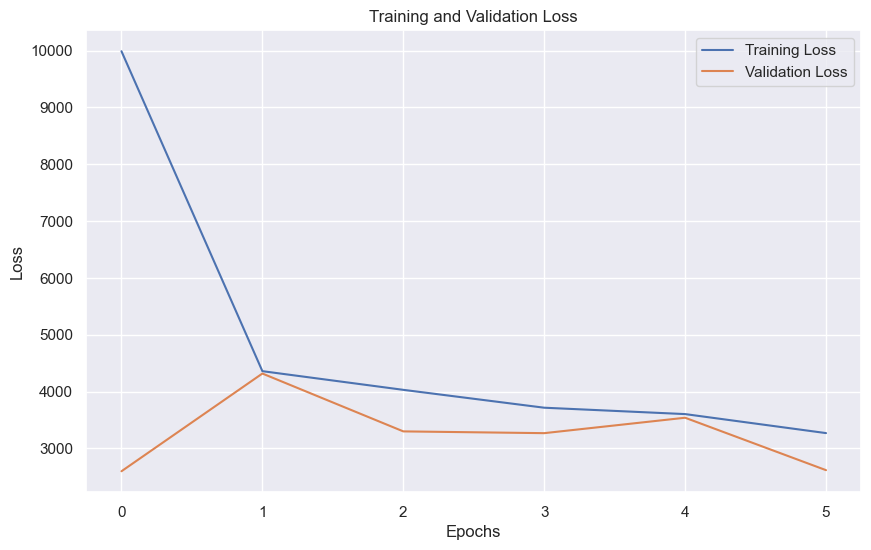

695/695 [==============================] - 2s 3ms/step - loss: 2732.6025 - mae: 35.6200
Training Loss: 2732.6025390625, Training MAE: 35.6199951171875
4/4 [==============================] - 0s 4ms/step - loss: 1720.7087 - mae: 29.9088
Test Loss: 1720.708740234375, Test MAE: 29.9088191986084
4/4 [==============================] - 0s 3ms/step


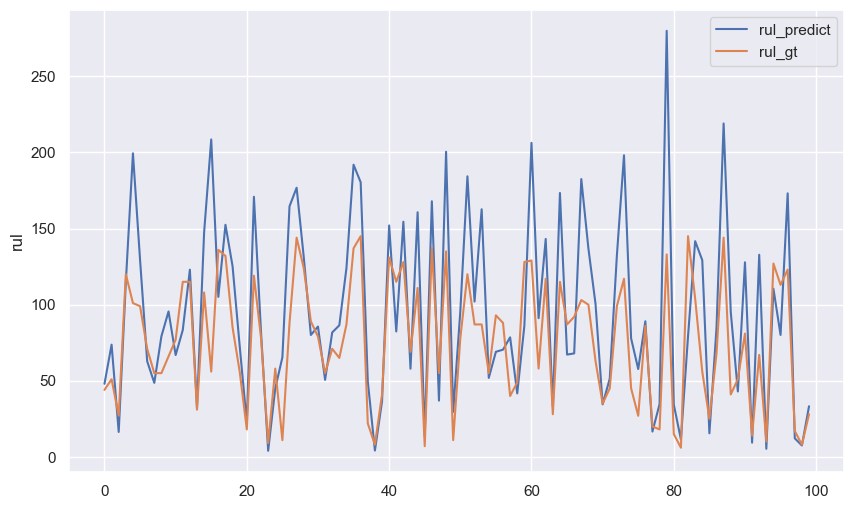

CPU times: user 42.1 s, sys: 6.61 s, total: 48.7 s
Wall time: 33.1 s


In [84]:
%%time
cb = keras.callbacks.TensorBoard(log_dir= get_run_logdir("run_lstm_rul_alt"), histogram_freq=1, write_graph= True, update_freq='epoch')

# [WriteCode]
model_lstm_rul_alt = Sequential()
model_lstm_rul_alt.add(LSTM(50, return_sequences=True, activation='relu', input_shape=(seq_array.shape[1], seq_array.shape[2]), kernel_regularizer=l1(0.01)))
model_lstm_rul_alt.add(Dropout(0.2))
model_lstm_rul_alt.add(LSTM(50, return_sequences=False, activation='relu', kernel_regularizer=l1(0.01)))
model_lstm_rul_alt.add(Dropout(0.2))
model_lstm_rul_alt.add(Dense(1))
'''model_lstm_rul = Sequential()
model_lstm_rul.add(LSTM(128, return_sequences=True, input_shape=(seq_array.shape[1], seq_array.shape[2]), activation='tanh'))
# model_lstm_rul.add(Dropout(0.2))
model_lstm_rul.add(LSTM(64, return_sequences=True, activation='tanh'))
# model_lstm_rul.add(Dropout(0.2))
# model_lstm_rul.add(LSTM(32, activation='tanh'))
# model_lstm_rul.add(Dropout(0.2))
# model_lstm_rul.add(Dense(96, activation='relu'))
# model_lstm_rul.add(Dropout(0.2))
model_lstm_rul.add(Dense(16, activation='relu'))
# model_lstm_rul.add(Dropout(0.2))
model_lstm_rul.add(Dense(1))'''



model_lstm_rul_alt.compile(optimizer=Adam(), loss='mean_squared_error', metrics=['mae'])

'''def lr_schedule(epoch):
    initial_lr = 0.01
    decay_rate = 0.9
    decay_step = 10
    return initial_lr * (decay_rate ** (epoch // decay_step))'''

def lr_schedule(epoch):
    if epoch < 5:
        return 0.001
    else:
        return 0.0001

early_stopping = EarlyStopping(monitor='val_loss',  
                   patience=5, 
                   verbose=True)    

lr_scheduler = LearningRateScheduler(lr_schedule, verbose=True)
history = model_lstm_rul_alt.fit(seq_array, label_array, epochs=100, batch_size=128, validation_split=0.05, callbacks=[lr_scheduler, early_stopping, cb])


# 绘制训练集和验证集的损失曲线
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show() 

train_loss, train_mae = model_lstm_rul_alt.evaluate(seq_array, label_array)
print(f"Training Loss: {train_loss}, Training MAE: {train_mae}")

test_loss, test_mae = model_lstm_rul_alt.evaluate(seq_array_test_last, label_array_test_last)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")
rul = model_lstm_rul_alt.predict(seq_array_test_last)
plt.figure(figsize=(10, 6))
plt.plot(rul, label='rul_predict')
plt.plot(label_array_test_last, label='rul_gt')
plt.ylabel('rul')
plt.legend()
plt.show()

### Comparing CNN 1D and LSTM models for RUL Regression
Using a Pandas dataframe, combine the results obtained for RUL regression such as MAE for test data of the CNN, LSTM, alt-CNN and alt-LSTM models for RUL regression.

Display this dataframe.

In [85]:
# [WriteCode]
model_cnn_rul_test_loss, model_cnn_rul_test_mae = model_cnn_rul.evaluate(seq_array_test_last, label_array_test_last)
model_lstm_rul_test_loss, model_lstm_rul_test_mae = model_lstm_rul.evaluate(seq_array_test_last, label_array_test_last)
model_cnn_rul_alt_test_loss, model_cnn_rul_alt_test_mae = model_cnn_rul_alt.evaluate(seq_array_test_last, label_array_test_last)
model_lstm_rul_alt_test_loss, model_lstm_rul_alt_test_mae = model_lstm_rul_alt.evaluate(seq_array_test_last, label_array_test_last)

# model_cnn_rul_test_loss, model_cnn_rul_test_mae = [0, 0]
# model_cnn_rul_alt_test_loss, model_cnn_rul_alt_test_mae = [0, 0]

data = {'Model': ['CNN', 'LSTM', 'CNN-alt', 'LSTM-alt'],
        'MSE Loss': [model_cnn_rul_test_loss, model_lstm_rul_test_loss, model_cnn_rul_alt_test_loss, model_lstm_rul_alt_test_loss],
        'MAE': [model_cnn_rul_test_mae, model_lstm_rul_test_mae, model_cnn_rul_alt_test_mae, model_lstm_rul_alt_test_mae]}
df = pd.DataFrame(data)
print(df)

4/4 [==============================] - 0s 3ms/step - loss: 1720.7087 - mae: 29.9088
      Model     MSE Loss        MAE
0       CNN  1330.046143  27.650932
1      LSTM   991.301147  23.338289
2   CNN-alt   863.448914  20.102669
3  LSTM-alt  1720.708740  29.908819


## Visualization with TensorBoard

Many quantities such as loss function and performance metrics are saved while training the models and can be visualized using TensorBoard.

Use these visualizations to provide the evidence in your answers to the questions in Section 7.1 of the assignment document.

Make sure you select the correct information to visualize and compare. 

*Note*: Results from different runs are saved in separate time-stamped folders. 

In [86]:
%load_ext tensorboard
%tensorboard --logdir=./eec4400_logs --port=6006

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

Address already in use
Port 6006 is in use by another program. Either identify and stop that program, or start the server with a different port.